In [1]:
import os
import astropy
import requests
import pandas as pd
import numpy as np
import lightkurve as lk
from scipy.interpolate import interp1d
from astropy.modeling import models, fitting
from astropy.time import Time
import astropy.units as u
import matplotlib.pyplot as plt
import emcee
import sys
import csv
from astropy.timeseries import LombScargle
from os.path import basename, exists

# change these paths to wherever you have the files
# sys.path.insert(1,'/Users/neisner/Documents/code/utils/')
import filters # Suzanne's functions
import norm

# change these paths to wherever you have the files
# sys.path.insert(1,'/Users/neisner/Documents/code/ETV')
import etv_functions # Nora's functions

from importlib import reload

%matplotlib inline

In [2]:
from IPython.display import display, HTML, Javascript, clear_output

display(HTML("<style>.container { width:99% !important; }</style>"))  # Jupyter 6
display(HTML("<style>.jp-Notebook { --jp-notebook-max-width: 98%; }</style>"))  # Jupyter 7

# define the paths where the data will be stores - NEED TO CHANGE THIS TO YOUR OWN PATH
outfile_base = './etv_out'  # for ETV
lk_download_dir = 'C:/dev/_juypter/PH_TESS_LightCurveViewer/data'

# A command from shell that can be run to notify users, e.g., fitting is finished. Use "echo" if you do not have one
NOTIFY_CMD = "win-notify.bat"

if hasattr(lk, "conf"):  # default download dir
    lk.conf.cache_dir = lk_download_dir
if hasattr(lk.search, "sr_cache"):   # PR for persistent query result cache
    lk.search.sr_cache.cache_dir = lk_download_dir  # None
    lk.search.sr_cache.expire_seconds = 86400

## Looking for ETVs in TIC 220410224

- target with clear eclipse depth variations, possibly due to a 3rd body.
- eclipses disappeared: much shallower in sector 63, hardly there in 66, gone in 69 and 90


In [3]:
# define the plotting parameters

figsize = (8,4)

In [120]:
# import the data

# choose a TIC ID to analyze
ticid = 220410224

# define the paths where the data will be stores - NEED TO CHANGE THIS TO YOUR OWN PATH
outfile_path = f"{outfile_base}/tic{ticid}_etv_primary.csv"
outfile_path_s = f"{outfile_base}/tic{ticid}_etv_secondary.csv"


# import data using Lightkurve
# sr = lk.search_lightcurve('TIC {}'.format(ticid), author = 'SPOC')
if not "../.." in sys.path:
    sys.path.append("../..")
import lightkurve_ext as lke  # at ../../


sr = lk.search_lightcurve('TIC {}'.format(ticid)) 
# use QLP data to increase the baseline
sr = lke.filter_by_priority(sr, author_priority=['QLP'], exptime_priority=['short', 'long', 'fast'])  # 'SPOC', 'TESS-SPOC', 'QLP'
# sr = sr[sr.exptime != 1800 *u.s]  # exclude 30min cadence data for now (TESS-SPOC, sectors 18, 19, 23 )
# sr = sr[np.isin(sr.author, ['SPOC', 'TESS-SPOC'])]  # exclude QLP to ensure for uniformity in the data
sr = lke._sort_chronologically(sr)  # workaround lightkurve v2.4.2+ change in sort order
with astropy.conf.set_temp("max_lines", -1):
    display(sr)
lcc_tess = sr.download_all()

lcc_tess_all = lcc_tess  # all available TESS data
lcc_tess = lcc_tess[~np.isin(lcc_tess.sector, [69, 90])]  # filter out sectors with eclipses completely disappeared

def use_sap_flux(lc):
    """Helper over select_flux("sap_flux") to ensure flux_err is populated for QLP case"""
    if lc.meta.get("AUTHOR") == "QLP":
        # select_flux("sap_flux") on QLP data will lead to nan flux_err
        # because QLP lc only has err on kspsap_flux / det_flux
        return lc
    else:
        return lc.select_flux("sap_flux")

def use_flux(lc):
    # detrended QLP for cleaner data
    return lke.select_flux(lc, ["kspsap_flux", "det_flux"])

lc_tess = lcc_tess.stitch(
    corrector_func=lambda lc: use_flux(lc).normalize()
    # corrector_func=lambda lc: use_sap_flux(lc).normalize()
)
# lc_tess = lc_tess.truncate(None, 1450)  # use data from sectors 2 - 3 for now


search_result = lc_tess

time = search_result.time.value
flux = search_result.flux.value
fluxerr = search_result.flux_err.value
len(search_result)

#,mission,year,author,exptime,target_name,distance,proposal_id
,,,,s,,arcsec,
0,TESS Sector 03,2018,QLP,1800,220410224,0.0,N/A
1,TESS Sector 04,2018,QLP,1800,220410224,0.0,N/A
2,TESS Sector 05,2018,QLP,1800,220410224,0.0,N/A
3,TESS Sector 06,2018,QLP,1800,220410224,0.0,N/A
4,TESS Sector 09,2019,QLP,1800,220410224,0.0,N/A
5,TESS Sector 29,2020,QLP,600,220410224,0.0,N/A
6,TESS Sector 30,2020,QLP,600,220410224,0.0,N/A
7,TESS Sector 31,2020,QLP,600,220410224,0.0,N/A
8,TESS Sector 32,2020,QLP,600,220410224,0.0,N/A


C:\pkg\_winNonPortables\miniforge3\envs\my_lk_plus\lib\site-packages\numpy\core\fromnumeric.py:771: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedColumn.
  a.partition(kth, axis=axis, kind=kind, order=order)


49361

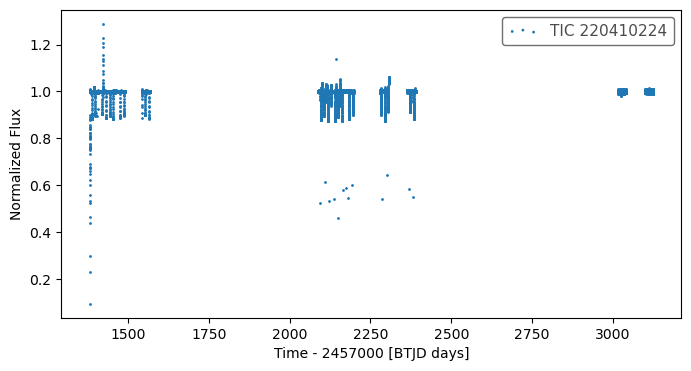

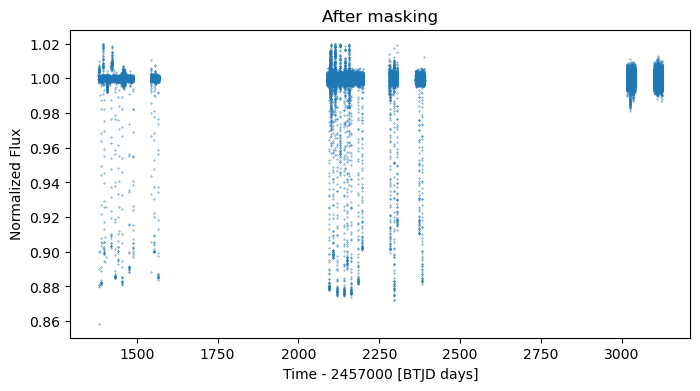

In [18]:
%matplotlib inline
# %matplotlib widget

time = search_result.time.value
flux = search_result.flux.value
fluxerr = search_result.flux_err.value
len(search_result)

# mask out data you don't like...

fig, ax = plt.subplots(figsize=figsize)
search_result.scatter(ax = ax)

mask = time < 0  #( time > 54950) & (time < 54963)  #  truncate weird spikes at the beginning of Kepler data
# mask = flux < 0.85    # remove occasional outliers
mask = (
    ( flux < 0.85 ) | # remove  outliers
    ( flux > 1.02 )  # remove  outliers
)

time = time[~mask]
flux = flux[~mask]
fluxerr = fluxerr[~mask]

# make sure that therte are no nans!

finite_mask = np.isfinite(time) * np.isfinite(flux) * np.isfinite(fluxerr)

# make a dictionary of the data

data = pd.DataFrame({'time': time[finite_mask], 'flux': flux[finite_mask], 'err': fluxerr[finite_mask]})

ax2 = plt.figure(figsize=figsize).gca()
ax2.scatter(data.time, data.flux, s=0.1);
ax2.set_ylabel(ax.get_ylabel())
ax2.set_xlabel(ax.get_xlabel())
ax2.set_title("After masking");

In [ ]:
do_bls = False

if do_bls:
    if not "../.." in sys.path:
        sys.path.append("../..")
    import lightkurve_ext_pg_runner as lke_pg_runner  # at ../../

    bls_result = lke_pg_runner.run_bls(
        search_result.remove_nans(),
        pg_kwargs=dict(
            minimum_period=1, maximum_period=20,
            frequency_factor=1,
            duration=[3.4957 / 24 * f for f in [0.975, 1, 1.025, 1.05, 1.1, 1.15,]],  # based on observed primary eclipse duration for better fit
        ),
    )
    !$NOTIFY_CMD  "BLS Done"

In [ ]:
do_ls = False

if do_ls:
    if not "../.." in sys.path:
        sys.path.append("../..")
    import lightkurve_ext_pg as lke_pg  # at ../../

    lc = lk.LightCurve(time=Time(time, format="btjd"), flux=flux, flux_err=fluxerr)
    lc.meta["LABEL"] = f"TIC {ticid}"
    pg = lc.to_periodogram(method="lombscargle",
                           # maximum_period=10,
                           # minimum_period=0.4,
                           # ls_method="fastchi2", nterms=2,
                           # oversample_factor=50,  # default: 5
                          )

    pg.show_properties();
    print(pg.period_at_max_power);

    ax = lke_pg.plot_pg_n_mark_max(pg, max_period_factor=10);

    ax = pg.plot(view="frequency");  # frequency view
    ax.set_xlim(pg.frequency_at_max_power.value / 100 , pg.frequency_at_max_power.value * 10);

    ax = pg.plot(view="frequency", unit=u.microhertz, scale="log");

    axs, lcs = lke_pg.plot_lc_with_model(
        lc,
        pg,
        plot_lc=False, plot_model=False, plot_folded_model=True,
        also_return_lcs=True);


In [ ]:
# Visaully compare different candidate period

# ax = search_result.normalize().fold(epoch_time=1471.4196, period=8.418132651611877).truncate(-0.1, 0.1).scatter(label="BLS period, frequency_factor=10");  # HWHM 0.001571020094789155
# ax = search_result.normalize().fold(epoch_time=1471.4196, period=8.418147).truncate(-0.1, 0.1).scatter(label="s0001-s0009:TCE1");

### Define epoch, period, duration

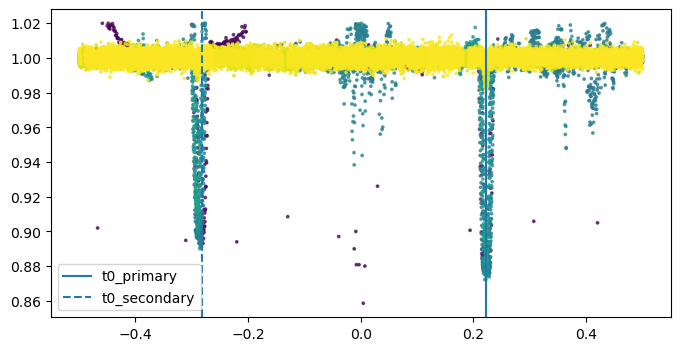

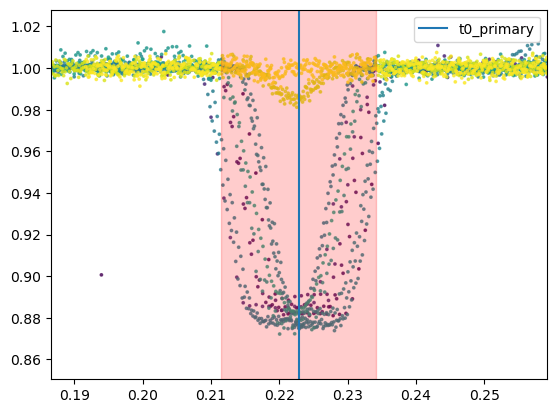

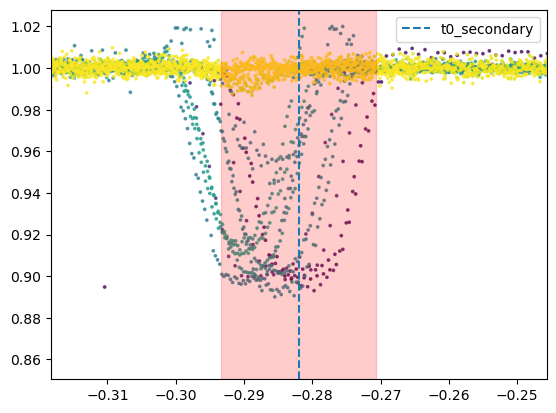

In [152]:
%matplotlib inline
# %matplotlib widget

# define the orbital period and the t0

# epoch=1388.435, duration_hr=12.0, period=22.094, label="EB-deep",  # from visual,   period=22.094 if only using deep dips up S39; period=22.108 if including shallow S63 dips
# epoch=1399.35, duration_hr=12.0, period=22.1045, label="EB-shallow",  # from visual, period=22.1045 if only using deep dips up S39;, period=22.1065 if including shallow S63 dips
# MCMC on df_primary:   p: 22.109023511262293, std_p: 6.152867764957116e-06 ; t0: 1388.3842839549648, std_t0: 0.00016478261515723983
# MCMC on df_seconary:  p: 22.10558461759309, std_p_s: 8.217701184662856e-06 ; t0_s: 1399.3283043207527, std_t0_s: 0.0002108100165980098

# FILL-IN THE eclipse epoch / period,
# period = 22.108  # visual up to S39
period = 22.1090 # MCMC 

# period_s = 22.1065  # viusal, up to S39, the best fit period is pssibly different from the one of primary
period_s = 22.1056  # MCMC

# t0_primary = 1388.435  # visual
t0_primary = 1388.38   # MCMC

# t0_secondary = 1399.35  # visual
t0_secondary = 1399.328   # MCMC

duration_hr_primary = 12.0
duration_hr_secondary = 12.0

# convert epoch from BTJD to commonly mjd used here
# t0_primary = Time(t0_primary, format="btjd").to_value("mjd")
# t0_secondary = Time(t0_secondary, format="btjd").to_value("mjd")

# Move t0 to the first dip in the data (some of the subsequent codes, espically fit_each_eclipse(), assumes that)
t0_primary = t0_primary - int((t0_primary - data['time'][0]) / period) * period
# if t0_secondary is not None:  # the adjustment is counter productivfe due to custom period for secondary
#     t0_secondary = t0_secondary - int((t0_secondary - data['time'][0]) / period) * period

t0_for_plotting = 0  # keep 0 for plotting purposes
if t0_secondary is not None:
    t0_for_plotting = t0_primary - np.abs(t0_primary - t0_secondary) * 0.45  # use a custom one so that the eclipses are not near the edge (-0.5 or +0.5)

phase = etv_functions.phase_data(data['time'], t0_for_plotting, period)

fig, ax = plt.subplots(figsize = (8,4))

plt.scatter(phase,data['flux'], s = 3, alpha = 0.7, c = data['time'])

# add the phase to the dataframe
data['phase'] = phase

plt.axvline(etv_functions.phase_data([t0_primary], t0_for_plotting, period)[0], label="t0_primary")
if t0_secondary is not None:
    plt.axvline(etv_functions.phase_data([t0_secondary], t0_for_plotting, period)[0], linestyle="--", label="t0_secondary")
plt.legend()
# plt.ylim(0.9, 1.04);
# plt.xlim(-0.5, 0.1)
plt.show();

plt.scatter(phase,data['flux'], s = 3, alpha = 0.7, c = data['time'])
plt.axvline(etv_functions.phase_data([t0_primary], t0_for_plotting, period)[0], label="t0_primary")
t1_p, t4_p = etv_functions.phase_data([t0_primary], t0_for_plotting, period)[0] - 0.5 * duration_hr_primary / 24/ period, etv_functions.phase_data([t0_primary], t0_for_plotting, period)[0] + 0.5 * duration_hr_primary / 24/ period
plt.xlim(t1_p - 0.025, t4_p + 0.025);
plt.axvspan(t1_p, t4_p, color="red", alpha=0.2);plt.legend();
# plt.ylim(0.9, 1.04);
plt.show()

# seconary plot not helpful as the period is different
if t0_secondary is not None:
    plt.scatter(phase,data['flux'], s = 3, alpha = 0.7, c = data['time'])
    plt.axvline(etv_functions.phase_data([t0_secondary], t0_for_plotting, period)[0], linestyle="--", label="t0_secondary")
    t1_s, t4_s = etv_functions.phase_data([t0_secondary], t0_for_plotting, period)[0] - 0.5 * duration_hr_secondary / 24/ period, etv_functions.phase_data([t0_secondary], t0_for_plotting, period)[0] + 0.5 * duration_hr_secondary / 24/ period
    plt.xlim(t1_s - 0.025, t4_s + 0.025);
    plt.axvspan(t1_s, t4_s, color="red", alpha=0.2);plt.legend();
    plt.legend();
    # plt.ylim(0.95, 1.03);
    plt.show()

### Difference in the best fit period of primary and the secondary eclipses

Primary:  22.109
Secondary: 22.1056


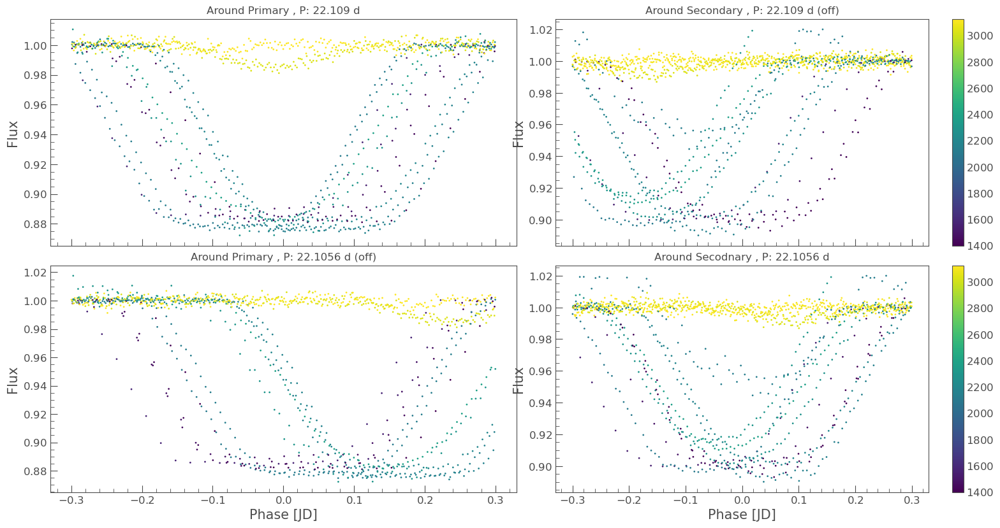

In [153]:
lc_data = lk.LightCurve(time=Time(data.time, format="btjd"), flux=data.flux, flux_err=data.err)

with plt.style.context(lk.MPLSTYLE):
    fig, axs = plt.subplots(2, 2, figsize=(16, 8), sharey=False, sharex=True);
    plt.tight_layout();

ax = axs[0][0]
lc_f = lc_data.fold(period=period, epoch_time=t0_primary).truncate(-0.3, 0.3);
lc_f.scatter(ax=ax, c=lc_f.time_original.value, show_colorbar=False)
ax.set_title(f"Around Primary , P: {lc_f.period}");
ax.set_xlabel(None)

ax = axs[1][0]
lc_f = lc_data.fold(period=period_s, epoch_time=t0_primary).truncate(-0.3, 0.3);
lc_f.scatter(ax=ax, c=lc_f.time_original.value, show_colorbar=False)
ax.set_title(f"Around Primary , P: {lc_f.period} (off)");

ax = axs[0][1]
lc_f = lc_data.fold(period=period, epoch_time=t0_secondary).truncate(-0.3, 0.3);
lc_f.scatter(ax=ax, c=lc_f.time_original.value, show_colorbar=True)
ax.set_title(f"Around Secondary , P: {lc_f.period} (off)");
ax.set_xlabel(None)

ax = axs[1][1]
lc_f = lc_data.fold(period=period_s, epoch_time=t0_secondary).truncate(-0.3, 0.3);
lc_f.scatter(ax=ax, c=lc_f.time_original.value, show_colorbar=True)
ax.set_title(f"Around Secodnary , P: {lc_f.period}");

print("Primary: ", period)
print("Secondary:", period_s)

### Compare folded plots across sectors

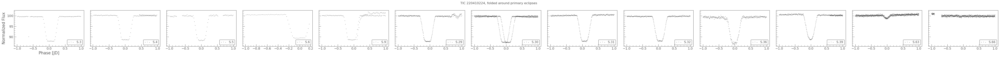

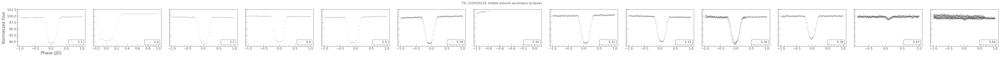

In [154]:
_lcc_tess = lcc_tess

with plt.style.context(lk.MPLSTYLE):
    fig, axs = plt.subplots(1, len(_lcc_tess), figsize=(4 * len(_lcc_tess), 3), sharey=True);
    if isinstance(axs, plt.Axes):
        axs = [axs]
    for i, lc in enumerate(_lcc_tess):
        lc_f = lc.select_flux("flux").normalize(unit="percent").fold(period=period, epoch_time=t0_primary)
        lc_f = lc_f.truncate(85, 102, column="flux")  # crude remove outliers
        lc_f = lc_f.truncate(-duration_hr_primary * 2 / 24, duration_hr_primary * 2 / 24)
        ax = lc_f.scatter(ax=axs[i], s=1, label=f"S.{lc_f.sector}");
        ax.legend(loc="lower right");
        if i > 0:
            ax.set_ylabel(None)
            ax.set_xlabel(None)
    fig.suptitle(f"{lc.label}, folded around primary eclipses");
plt.tight_layout();

# ---
with plt.style.context(lk.MPLSTYLE):
    fig, axs = plt.subplots(1, len(_lcc_tess), figsize=(4 * len(_lcc_tess), 3), sharey=True);
    if isinstance(axs, plt.Axes):
        axs = [axs]
    for i, lc in enumerate(_lcc_tess):
        lc_f = lc.select_flux("flux").normalize(unit="percent").fold(period=period_s, epoch_time=t0_secondary)
        lc_f = lc_f.truncate(85, 102, column="flux")  # crude remove outliers
        lc_f = lc_f.truncate(-duration_hr_secondary * 2 / 24, duration_hr_secondary * 2 / 24)
        ax = lc_f.scatter(ax=axs[i], s=1, label=f"S.{lc_f.sector}");
        ax.legend(loc="lower right");
        if i > 0:
            ax.set_ylabel(None)
            ax.set_xlabel(None)
    fig.suptitle(f"{lc.label}, folded around secondary eclipses");
plt.tight_layout();

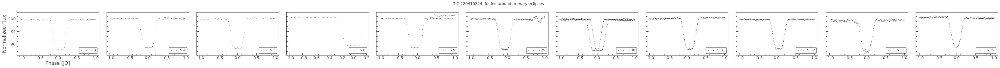

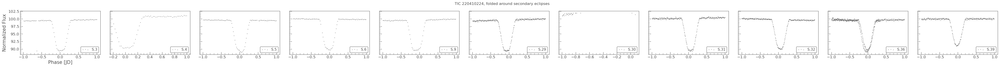

In [158]:
# zoom in to those with significant eclipse depth
_lcc_tess = lcc_tess[lcc_tess.sector <= 39]

with plt.style.context(lk.MPLSTYLE):
    fig, axs = plt.subplots(1, len(_lcc_tess), figsize=(4 * len(_lcc_tess), 3), sharey=True);
    if isinstance(axs, plt.Axes):
        axs = [axs]
    for i, lc in enumerate(_lcc_tess):
        lc_f = lc.select_flux("flux").normalize(unit="percent").fold(period=period, epoch_time=t0_primary)
        lc_f = lc_f.truncate(85, 102, column="flux")  # crude remove outliers
        lc_f = lc_f.truncate(-duration_hr_primary * 2 / 24, duration_hr_primary * 2 / 24)
        ax = lc_f.scatter(ax=axs[i], s=1, label=f"S.{lc_f.sector}");
        ax.legend(loc="lower right");
        if i > 0:
            ax.set_ylabel(None)
            ax.set_xlabel(None)
    fig.suptitle(f"{lc.label}, folded around primary eclipses");
plt.tight_layout();

# ---
with plt.style.context(lk.MPLSTYLE):
    fig, axs = plt.subplots(1, len(_lcc_tess), figsize=(4 * len(_lcc_tess), 3), sharey=True);
    if isinstance(axs, plt.Axes):
        axs = [axs]
    for i, lc in enumerate(_lcc_tess):
        lc_f = lc.select_flux("flux").normalize(unit="percent").fold(period=period_s, epoch_time=t0_secondary)
        lc_f = lc_f.truncate(85, 102, column="flux")  # crude remove outliers
        lc_f = lc_f.truncate(-duration_hr_secondary * 2 / 24, duration_hr_secondary * 2 / 24)
        ax = lc_f.scatter(ax=axs[i], s=1, label=f"S.{lc_f.sector}");
        ax.legend(loc="lower right");
        if i > 0:
            ax.set_ylabel(None)
            ax.set_xlabel(None)
    fig.suptitle(f"{lc.label}, folded around secondary eclipses");
plt.tight_layout();

#### Eclipses are barely there in secotr 66, and completely disappear subsequent sectors (69, 90)

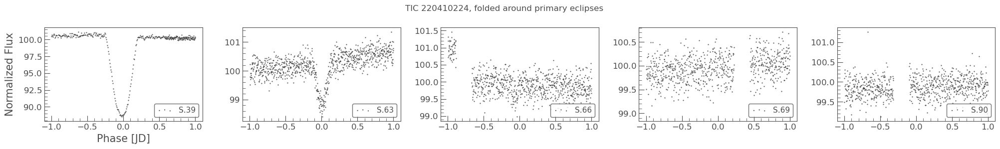


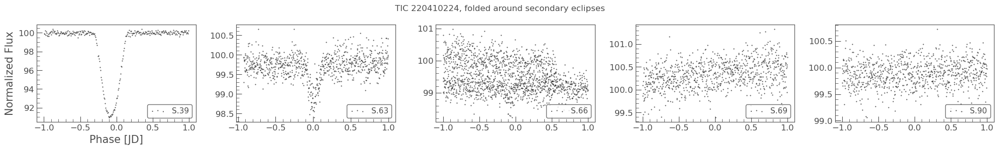

### Detrend (optional)

- detrended flux is in `flux_detrended`, and won't be used in subsequent work by default

In [ ]:
data["flux_original"] = data.flux  # save the original flux 

In [ ]:
# show data to visualize what's changed in each step below
data

In [ ]:
# phase fold the data and create an appoximate binary model (top) and subtract it from the data (bottom)
#_, _ , flux_sub_binary, model, _, _ = etv_functions.trend_removal_interact(period, 0, data['time'], data['flux'], data['time'], data['flux'])

data = etv_functions.trend_removal_interact(period, t0_for_plotting, data)
data

In [ ]:
# if you want to detrend the data run this line!

data = etv_functions.detrend_suz(data, T_dur = 10, plot = True)
data

In [ ]:
# plot the phase folded data here so that you know at what phase you want to cut the data to model 
plt.scatter(phase,data['flux_detrended'], s = 3, alpha = 0.7, c = data['time'])

plt.axvline(etv_functions.phase_data([t0_primary], t0_for_plotting, period)[0], label="t0_primary")
if t0_secondary is not None:
    plt.axvline(etv_functions.phase_data([t0_secondary], t0_for_plotting, period)[0], linestyle="--", label="t0_secondary")
plt.legend()
# plt.ylim(0.535, 0.55)
# plt.xlim(-0.5, 0.1)
plt.show();

plt.scatter(phase,data['flux_detrended'], s = 3, alpha = 0.7, c = data['time'])
plt.axvline(etv_functions.phase_data([t0_primary], t0_for_plotting, period)[0], label="t0_primary")
t1_p, t4_p = etv_functions.phase_data([t0_primary], t0_for_plotting, period)[0] - 0.5 * duration_hr_primary / 24/ period, etv_functions.phase_data([t0_primary], t0_for_plotting, period)[0] + 0.5 * duration_hr_primary / 24/ period 
plt.xlim(t1_p - 0.025, t4_p + 0.025);
plt.axvspan(t1_p, t4_p, color="red", alpha=0.2);plt.legend();
# plt.ylim(0.75, 0.85);
plt.show()

if t0_secondary is not None:
    plt.scatter(phase,data['flux_detrended'], s = 3, alpha = 0.7, c = data['time'])
    plt.axvline(etv_functions.phase_data([t0_secondary], t0_for_plotting, period)[0], linestyle="--", label="t0_secondary")
    t1_s, t4_s = etv_functions.phase_data([t0_secondary], t0_for_plotting, period)[0] - 0.5 * duration_hr_secondary / 24/ period, etv_functions.phase_data([t0_secondary], t0_for_plotting, period)[0] + 0.5 * duration_hr_secondary / 24/ period 
    plt.xlim(t1_s - 0.025, t4_s + 0.025);
    plt.axvspan(t1_s, t4_s, color="red", alpha=0.2);plt.legend();
    plt.legend();
    # plt.ylim(0.975, 1.005);
    plt.show()

In [ ]:
# # Uncomment to use the detrended flux
# #
# print("Use deterended flux")
# data.flux = data.flux_detrended

### Now that the data is ready we can start 

- generally the clipped LC window is ***smaller*** than the eclipse duration, to avoid the complication of fitting ingress/egress.

In [53]:
# define the midpoints of the primary and secondary eclipses and the window width

# if these don't look central - change them!! the eclipses should be central
midpoint_p =  etv_functions.phase_data([t0_primary], t0_for_plotting, period)[0]  # convet to time in phase
# midpoint_p -= 0.004  # the offset is added back to t0_primary (& secondary above
print('Primary:  ', t0_primary, midpoint_p)

# change depending on the width of the eclipses, default to be slightly larger than the primary eclipse
window_width_p = 2.0 * duration_hr_primary / 24 / period   # use a large window to account for ETV
# use a shoter duration to avoid fitting the out-of-eclipse LC, which has its own variability that the model is not equipped to hanlde
# window_width_p = 0.095
print("window_width_p (phase):", window_width_p)

data_primary = data[(data['phase'] > midpoint_p - window_width_p / 2) & (data['phase'] < midpoint_p + window_width_p / 2) ]
data_primary = data_primary[data_primary["time"] <= np.ceil(lke.of_sector(lcc_tess, 39).time[-1].value)]  # use only a subset with deep enough eclipses for param modeling

# data_primary = data_primary[data_primary["time"] >= np.floor(lke.of_sector(lcc_tess, 63).time[0].value)]  # use only a subset with deep enough eclipses for param modeling
# data_primary = data_primary[data_primary["time"] <= np.ceil(lke.of_sector(lcc_tess, 63).time[-1].value)]  # use only a subset with deep enough eclipses for param modeling

ph_binned,flux_binned,err_binned = etv_functions.run_binning_phased(data_primary.phase, data_primary.flux, yerr=data_primary.err,nbins=1000)


# if t0_secondary is not None:
#     midpoint_s =  etv_functions.phase_data([t0_secondary], t0_for_plotting, period)[0]
#     print('Secondary:', t0_secondary, midpoint_s)

#     # the coshgauss model seems problematic, try to use a larger width to give it more shape to fit
#     window_width_s = 0.8 * duration_hr_secondary / 24 / period
#     # window_width_s = 0.22
#     print("window_width_s (phase):", window_width_s)

#     data_secondary = data[(data['phase'] > midpoint_s - window_width_s / 2) & (data['phase'] < midpoint_s + window_width_s / 2) ]
#     ph_binned_s,flux_binned_s,err_binned_s = etv_functions.run_binning_phased(data_secondary.phase, data_secondary.flux, yerr=data_secondary.err,nbins=1000)


### # you need initial guesses!! The order is :
# alpha0, alpha1, t0, d, Tau - CHANGE THESE TO YOUR OWN INITIAL GUESSES
# median flux, -eclipse depth, t0, related to duration, related to shape (U or V)
# t0 in normalixed phase

# start_vals = [1.0, -0.12, midpoint_p, 0.005, 2.5]  # the shape fits better for the sector 3 dip
start_vals = [1.001, -0.1178, midpoint_p, 0.0058, 1.50]  # fits aggreagte beter but probably not fitting well for any indiviual
# start_vals_s = None

# -- -- -- -- -- -- -- -- --
# etv_functions.plot_initial_guess(data_primary, ph_binned, flux_binned, err_binned, *start_vals)
etv_functions.plot_initial_guess_interactive(data_primary, ph_binned, flux_binned, err_binned, "midpoint_p", *start_vals)
# if t0_secondary is not None:
#     # etv_functions.plot_initial_guess(data_secondary, ph_binned_s, flux_binned_s, err_binned_s, *start_vals_s)
#     etv_functions.plot_initial_guess_interactive(data_secondary, ph_binned_s, flux_binned_s, err_binned_s, "midpoint_s", *start_vals_s)

print("Start params for  fitting period with MCMC on df_primary:")
print(f"[{start_vals[0]}, {start_vals[1]}, {t0_primary}, {start_vals[3]}, {start_vals[4]}, {period}],");

Primary:   1388.38 0.22328011217150467
window_width_p (phase): 0.04523044913835994


Output(layout=Layout(padding='1em 0px'))

Output(layout=Layout(padding='1em'))

Start params for  fitting period with MCMC on df_primary:
[1.001, -0.1178, 1388.38, 0.0058, 1.5, 22.109],


#### Custom `start_vals` for sector 63, 66 with much shallower dips for primary eclipses

```python
start_vals_s63 = [1.0, -0.015, midpoint_p, 0.003, 1.0]
```

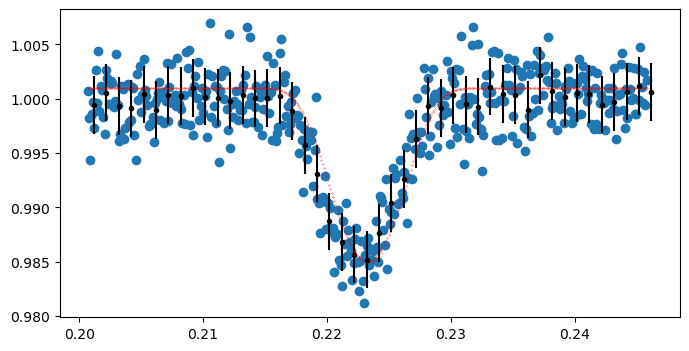


```python
start_vals_s66  = [1.0, -0.005, midpoint_p, 0.003, 1.0]
```

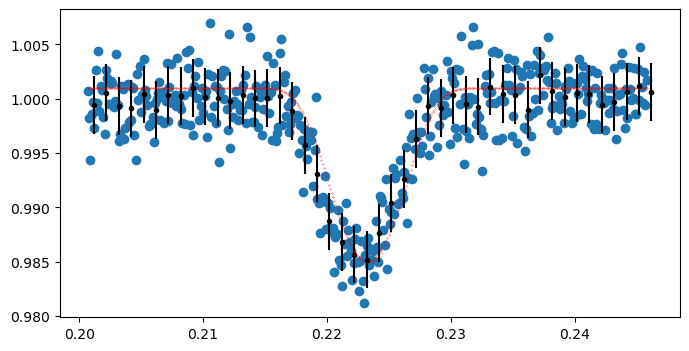


In [163]:
midpoint_s = 0  # fixed at 0
print('Secondary:', t0_secondary, midpoint_s)

# the coshgauss model seems problematic, try to use a larger width to give it more shape to fit
window_width_s = 2.0 * duration_hr_secondary / 24 / period_s  # avoid ingress/egress
# window_width_s = 0.22
print("window_width_s (phase):", window_width_s)


_lc = lk.LightCurve(time=Time(data.time, format="btjd"), flux=data.flux, flux_err=data.err)
_lc_f = _lc.fold(period=period_s, epoch_time=t0_secondary, normalize_phase=True)
_lc_f = _lc_f.truncate(midpoint_s - window_width_s / 2, midpoint_s + window_width_s / 2)
_lc_f = _lc_f.truncate(0.85, 1.012, column="flux")  # custom further truncate outliers

_lc_f = _lc_f.truncate(None, np.ceil(lke.of_sector(lcc_tess, 39).time[-1].value), column="time_original")  # use only a subset with deep enough eclipses for param modeling
# _lc_f = _lc_f.truncate(np.floor(lke.of_sector(lcc_tess, 63).time[0].value), np.ceil(lke.of_sector(lcc_tess, 63).time[-1].value), column="time_original")  # use only a subset with deep enough eclipses for param modeling


from types import SimpleNamespace
data_secondary = SimpleNamespace(time=_lc_f.time_original.value, phase=_lc_f.time.value, flux=np.array(_lc_f.flux.value), err=np.array(_lc_f.flux_err.value))
ph_binned_s,flux_binned_s,err_binned_s = etv_functions.run_binning_phased(data_secondary.phase, data_secondary.flux, yerr=data_secondary.err,nbins=1000)


# start_vals_s = [1.0, -0.095, midpoint_s, 0.0055, 1.8]  # fits sector 3 dip
start_vals_s = [1.001, -0.0918, midpoint_s, 0.0059, 1.29]


etv_functions.plot_initial_guess_interactive(data_secondary, ph_binned_s, flux_binned_s, err_binned_s, "midpoint_s", *start_vals_s)

print("Start params for  fitting period with MCMC on df_secondary:")
print(f"[{start_vals_s[0]}, {start_vals_s[1]}, {t0_secondary}, {start_vals_s[3]}, {start_vals_s[4]}, {period_s}],");

Secondary: 1399.328 0
window_width_s (phase): 0.04523740590619572


Output(layout=Layout(padding='1em 0px'))

Output(layout=Layout(padding='1em'))

Start params for  fitting period with MCMC on df_secondary:
[1.001, -0.0918, 1399.328, 0.0059, 1.29, 22.1056],


#### Custom `start_vals` for sector 63, 66 with much shallower dips for secondary eclipses

```python
start_vals_s63_s = [1.0, -0.01, midpoint_s, 0.003, 1.0]
```

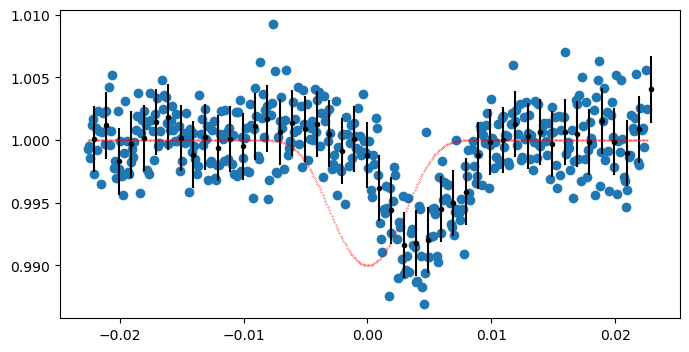


```python
start_vals_s66_s = [1.0, -0.005, midpoint_s, 0.003, 0.9]
```

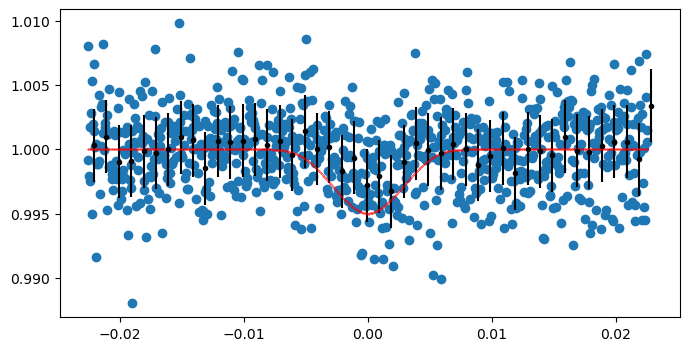


In [ ]:
if False:
    # Export the data around primary eclipses, for period analysis outside of notebook
    data_primary[["time", "flux", "err"]].to_csv(f"tmp/data_primary_{ticid}.csv", index=False)

emcee parallel enabled, use 4 CPUs.


100%|██████████████████████████████████████████████████████████| 4000/4000 [04:22<00:00, 15.21it/s]
The chain is shorter than 20 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/20 = 200;
tau: [199.58562353 188.05081117  99.22047778 292.7642239  284.04614475
 102.0465341 ]


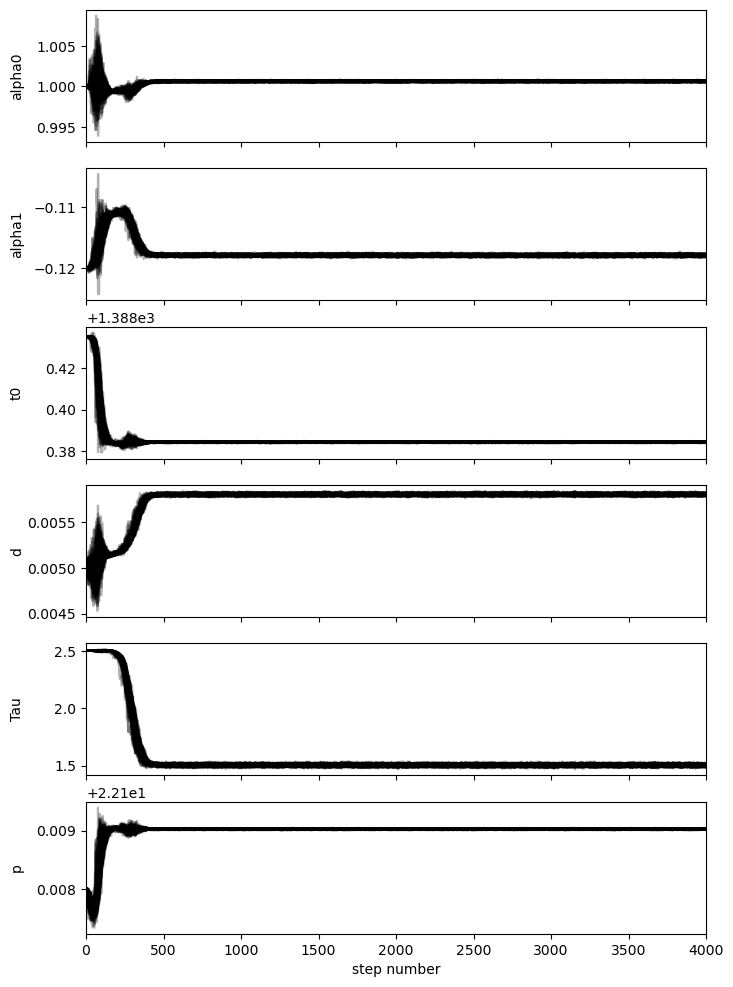

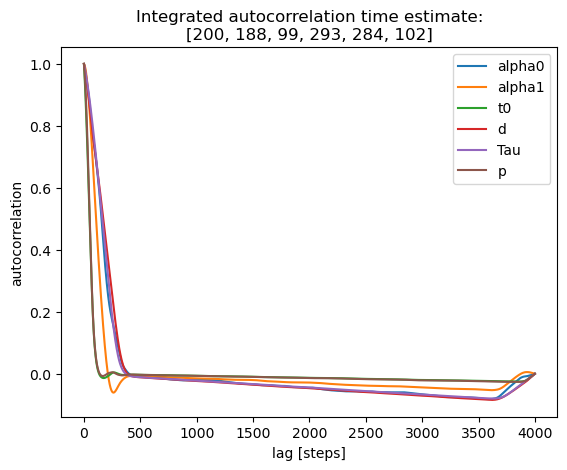

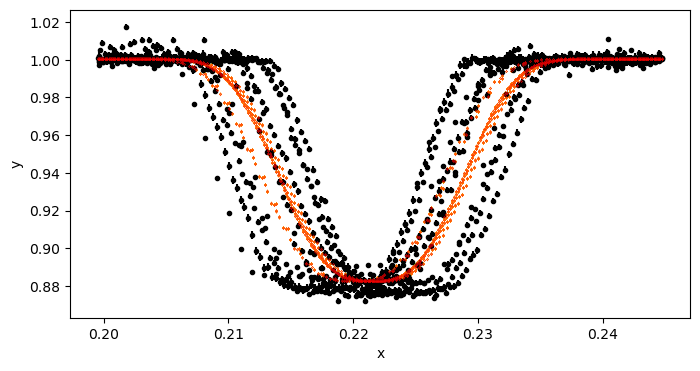

mean_alpha0, mean_alpha1, mean_t0_time, mean_d, mean_Tau, mean_p = 1.000633145842305, -0.11784935840986753, 1388.3842839549648, 0.0058052760305881464, 1.5037433442912396, 22.109023511262293
std_p: 6.152867764957116e-06 ; std_t0: 0.00016478261515723983


In [41]:
# use MCMC to refine the period

use_mcmc_to_fit_period = True


if use_mcmc_to_fit_period:
    import etv_functions_with_period as etvp

    etv_functions.enable_info_log_for_jupyter()

    # MCMC result
    mean_alpha0, mean_alpha1, mean_t0_time, mean_d, mean_Tau, mean_p, fit_params_p_stats = etvp.run_mcmc_initial_fit_p(
        data_primary[:],
        [1.0, -0.12, 1388.435, 0.005, 2.5, 22.108],
        # nruns=20, discard=1, # for a sanity test,  to ensure the initial guess is not way off.
        nruns=4000, discard=600,
        autocorr_time_kwargs=dict(tol=20),  # the emcee defaults tol=50 seems to be too strict for our use case, tol of ~10 - 20 seems to be sufficient
        pool=-2,
        plot_chains=True,
        plot_autocorrelation=True,
        plot=True,
        also_return_stats=True,
    )
    print("mean_alpha0, mean_alpha1, mean_t0_time, mean_d, mean_Tau, mean_p = " + ", ".join([str(v) for v in [mean_alpha0, mean_alpha1, mean_t0_time, mean_d, mean_Tau, mean_p]]))
    print("std_p:", fit_params_p_stats["std_p"], "; std_t0:", fit_params_p_stats['std_t0'])
    !$NOTIFY_CMD "Fitting period done."

emcee parallel enabled, use 4 CPUs.


100%|██████████████████████████████████████████████████████████| 4000/4000 [02:28<00:00, 26.88it/s]
The chain is shorter than 20 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/20 = 200;
tau: [ 29.99844682  57.6157181  116.67434479 241.90575096 249.75853062
  21.16489416]


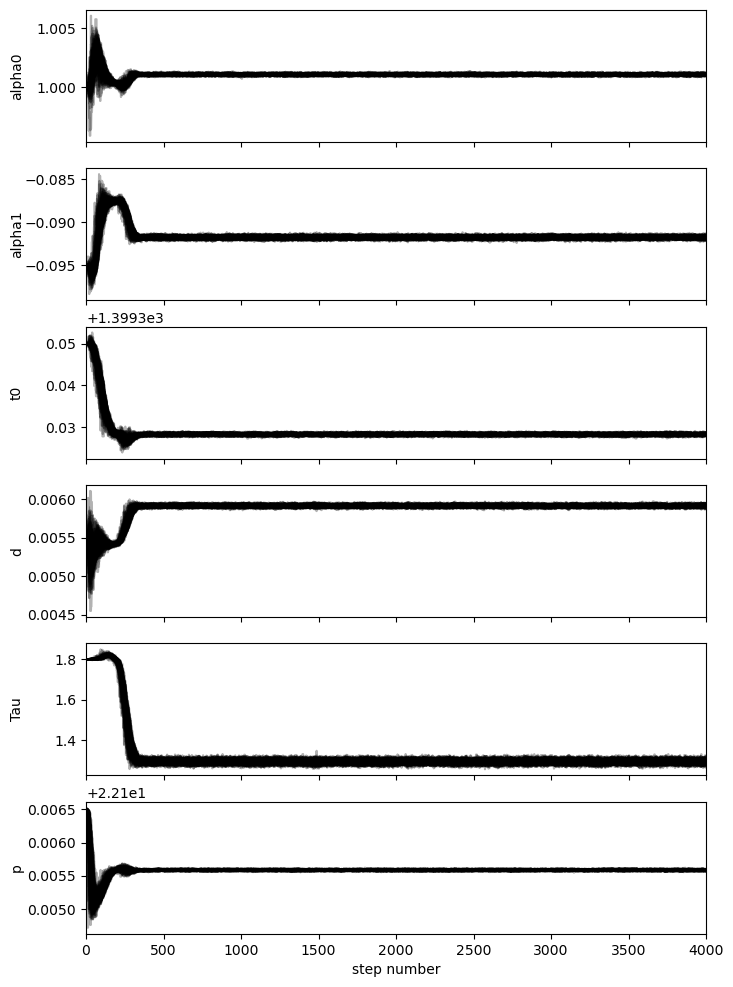

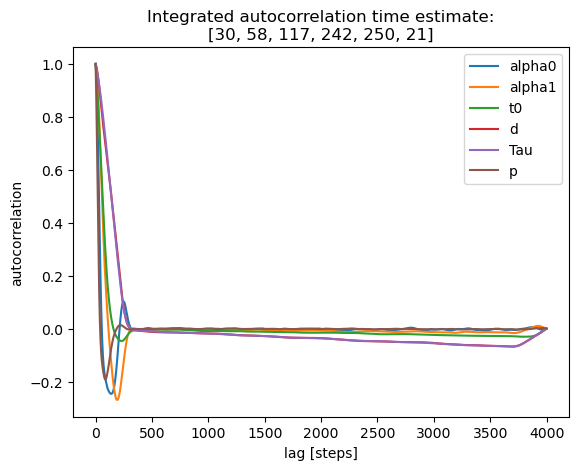

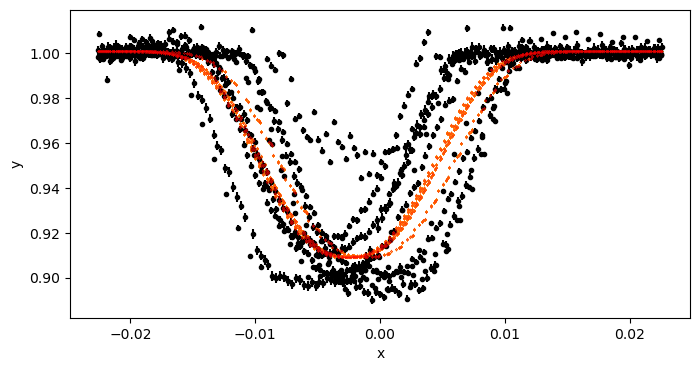

mean_alpha0_s, mean_alpha1_s, mean_t0_time_s, mean_d_s, mean_Tau_s, mean_p = 1.0010771019020572, -0.09176507826170328, 1399.3283043207527, 0.005911470390894905, 1.2933188123642292, 22.10558461759309
std_p_s: 8.217701184662856e-06 ; std_t0_s: 0.0002108100165980098


In [151]:
if use_mcmc_to_fit_period:
    import etv_functions_with_period as etvp

    etv_functions.enable_info_log_for_jupyter()

    # MCMC result
    mean_alpha0_s, mean_alpha1_s, mean_t0_time_s, mean_d_s, mean_Tau_s, mean_p, fit_params_s_stats = etvp.run_mcmc_initial_fit_p(
        data_secondary,
        [1.0, -0.095, 1399.35, 0.0055, 1.8, 22.1065],
        # nruns=20, discard=1, # for a sanity test,  to ensure the initial guess is not way off.
        nruns=4000, discard=600,
        autocorr_time_kwargs=dict(tol=20),  # the emcee defaults tol=50 seems to be too strict for our use case, tol of ~10 - 20 seems to be sufficient
        pool=-2,
        plot_chains=True,
        plot_autocorrelation=True,
        plot=True,
        also_return_stats=True,
    )
    print("mean_alpha0_s, mean_alpha1_s, mean_t0_time_s, mean_d_s, mean_Tau_s, mean_p = " + ", ".join([str(v) for v in [mean_alpha0_s, mean_alpha1_s, mean_t0_time_s, mean_d_s, mean_Tau_s, mean_p]]))
    print("std_p_s:", fit_params_s_stats["std_p"], "; std_t0_s:", fit_params_s_stats['std_t0'])
    !$NOTIFY_CMD "Fitting period (secondary) done."

In [ ]:
# run the initial model fit using MCMC for the primary and secondary eclipses
run_init_fit = True

if run_init_fit:
    etv_functions.enable_info_log_for_jupyter()
    
    mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau, fit_params_stats = etv_functions.run_mcmc_initial_fit(data_primary, start_vals, nruns=4000, discard=600, autocorr_time_kwargs=dict(tol=20), pool=-2, plot_chains=True,  plot_autocorrelation=True, plot=True, also_return_stats=True)
    !$NOTIFY_CMD "Initial fit done"

In [ ]:
if run_init_fit and t0_secondary is not None:
    mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s, fit_params_s_stats = etv_functions.run_mcmc_initial_fit(data_secondary, start_vals_s, nruns=4000, discard=600, autocorr_time_kwargs=dict(tol=20), pool=-2, plot_chains=True,  plot_autocorrelation=True, plot=True, also_return_stats=True)
    !$NOTIFY_CMD "Initial fit (seconary) done"


In [ ]:
# if not run_init_fit:  # case init fit has been previously saved and to be reussed
if True: 
    print("Use pre-defined inital model params:")
    # initial fit params from TESS data
    mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau = 1.0291728375890945, -0.22137396309094426, 0.30302626527394994, 0.015374141992856164, 0.9480693937055169

    # warning: period for secondary is different
    mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s = mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s = 1.0020821125166746, -0.015132262443550981, 0.0003626774364172433, 0.0130974222512278, 1.1583989095099447


    etv_functions.plot_initial_guess(data_primary, ph_binned, flux_binned, err_binned, *[mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau])
    etv_functions.plot_initial_guess(data_secondary, ph_binned_s, flux_binned_s, err_binned_s, *[mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s])

In [ ]:
print("Initial model params:")  # For information, and they can be copied to the cell above for future reuse

print("mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau = " + ", ".join([str(v) for v in [mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau]]))

In [ ]:
if t0_secondary is not None:
    print("mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s = " + ", ".join([str(v) for v in [mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s]]))

### Run custom indiviual fit (per-sector)

- the eclipse depth varies greatly over time. The standard codes `fit_each_eclipse()` would not work well, as they assume consistent eclipse shape (`d` and `Tau`), but the varying depth means the shape varies over time too.

#### per-sector fit for `data_primary`

In [ ]:
from types import SimpleNamespace

etv_out_str = "number,epoch,mean_alpha0,mean_alpha1,t0,stdv_t0,mean_d,mean_Tau\n"

for lc in lcc_tess[:]: 
    lc_f = lc.fold(epoch_time=t0_primary, period=period, normalize_phase=True)
    lc_f = lc_f.truncate(-window_width_p / 2, window_width_p / 2)
    lc_f = lc_f.truncate(0.75, 1.07, column="flux")  # crude remove outliers
    # ax = lc_f.scatter(label=f"S. {lc.sector}");  # for diagnostics
    
    # convert lc to the form needed by fit etv_functions
    lc_f_data = SimpleNamespace(time=lc_f.time_original.value, phase=lc_f.time.value, flux=np.array(lc_f.flux.value), err=np.array(lc_f.flux_err.value))
    
    start_vals = [mean_alpha0, mean_alpha1, 0, mean_d, mean_Tau]  # mean_t0 is not helpful at all
    _alpha0, _alpha1, _t0, _d, _Tau, _fit_params_stats = etv_functions.run_mcmc_initial_fit(
        lc_f_data, start_vals, 
        # nruns=40, discard=6, 
        nruns=5000, discard=1000,  # 3000  is probably sufficient
        autocorr_time_kwargs=dict(tol=20), pool=-2, plot_chains=True,  plot_autocorrelation=True, plot=True, also_return_stats=True)
    
    _stdv_t0 = _fit_params_stats["std_t0"]
    _t = np.mean(lc_f.time_original.value)  # approximate transit time 
    print(lc.sector, _t)
    
    etv_out_str += ",".join([str(s) for s in [lc.sector, _t, _alpha0, _alpha1, _t0, _stdv_t0, _d, _Tau]])
    etv_out_str += "\n"

print(etv_out_str)

In [ ]:
# # Keep the result in a cell for safekeeping
# etv_out_str = """\
# number,epoch,mean_alpha0,mean_alpha1,t0,stdv_t0,mean_d,mean_Tau
# 14,1695.9642162858286,1.0255854636259616,-0.21644426788558072,-0.0024008505740388754,2.4064291975290342e-05,0.01561571586640588,0.9634184345621482
# 15,1723.7211645866616,1.0249567185600195,-0.21802765716203706,-0.0020156727280138953,2.130923542208041e-05,0.01589617042283358,0.9599721733342846
# 41,2433.4062900690574,1.0211743119347325,-0.224835585116559,0.001676215822963366,1.3229475302095662e-05,0.015410598571403509,0.9590437428432734
# 54,2782.2643405178424,1.0200287198328328,-0.22116616768019554,0.0013800566988877718,1.300100983025872e-05,0.015233803006336328,0.9602694392889783
# 55,2810.197751899215,1.022283187065812,-0.21870193349335765,0.0013120313170804625,1.2997310135495301e-05,0.015451148485645497,0.9526016844760491
# 75,3353.367096317601,1.0205460738112884,-0.2285169479711899,-0.0002827957736571234,9.939889214197791e-06,0.015161979944050379,0.9627959829679646
# 81,3519.950881277999,1.0236283626800922,-0.22535387218663228,-0.0007503676884400836,8.496581397869978e-06,0.015295660899385641,0.9469549048852569
# 82,3545.7122385259336,1.0265363627801491,-0.2253490393672804,-0.000774649780242683,9.136687384057492e-06,0.015465383048108503,0.9454191487904116
# """


#### per-sector fit for `data_secondary`

- use custom `log_prior()`

In [ ]:
etv_out_str_s = "number,epoch,mean_alpha0,mean_alpha1,t0,stdv_t0,mean_d,mean_Tau\n"


from types import SimpleNamespace

# use a custom log_prior so that emcee won't waste time going over amplitude (alpha1) that is too large
# in order for use the custom log_prior in emcee, I then need to create a custom log_probability
def custom_log_prior(theta):
    alpha0, alpha1, t0, d, Tau = theta
    if (0 < alpha0 < 10) and (mean_alpha1_s * 3 < alpha1 < 0) and (-0.5 < t0 < 0.5) and (0 < d < 10) and (0.5 < Tau < 50):
        return 0.0
    return -np.inf

    
def custom_log_probability(theta, x, y, yerr):
    # check that the priors are satisfied
    lp = custom_log_prior(theta)
    if not np.isfinite(lp):
        return -np.inf
    return lp + etv_functions.log_likelihood(theta, x, y, yerr)


for lc in lcc_tess[:]: 
    lc_f = lc.fold(epoch_time=t0_secondary, period=period_s, normalize_phase=True)
    lc_f = lc_f.truncate(-window_width_s / 2, window_width_s / 2)
    # lc_f = lc_f.truncate(0.96, 1.015, column="flux")  # crude remove outliers (not needed in the window)
    # if True: # for diagnostics
    #     ax = lc_f.scatter(label=f"S. {lc.sector}");  
    #     continue
        
    # convert lc to the form needed by fit etv_functions
    lc_f_data = SimpleNamespace(time=lc_f.time_original.value, phase=lc_f.time.value, flux=np.array(lc_f.flux.value), err=np.array(lc_f.flux_err.value))

    start_vals_s = [mean_alpha0_s, mean_alpha1_s, 0, mean_d_s, mean_Tau_s]  # mean_t0 is not helpful at all

    start_vals_dict_s = dict(alpha0=mean_alpha0_s, alpha1=mean_alpha1_s, t0=0, d=mean_d_s, Tau=mean_Tau_s)
    _alpha0, _alpha1, _t0, _d, _Tau, _fit_params_stats = etv_functions.run_mcmc_initial_fit_of_model(
        custom_log_probability, etv_functions.coshgauss_model_fit,
        lc_f_data, start_vals_dict_s, 
        # nruns=40, discard=6, 
        nruns=5000, discard=1000,  # ?? is probably sufficient
        autocorr_time_kwargs=dict(tol=20), pool=None, plot_chains=True,  plot_autocorrelation=True, plot=True, also_return_stats=True)
    
    # _alpha0, _alpha1, _t0, _d, _Tau, _fit_params_stats = etv_functions.run_mcmc_initial_fit(
    #     lc_f_data, start_vals_s, 
    #     # nruns=40, discard=6, 
    #     nruns=5000, discard=1000,  # ?? is probably sufficient
    #     autocorr_time_kwargs=dict(tol=20), pool=-2, plot_chains=True,  plot_autocorrelation=True, plot=True, also_return_stats=True)
    
    _stdv_t0 = _fit_params_stats["std_t0"]
    _t = np.mean(lc_f.time_original.value)  # approximate transit time 
    print(lc.sector, _t)
    
    etv_out_str_s += ",".join([str(s) for s in [lc.sector, _t, _alpha0, _alpha1, _t0, _stdv_t0, _d, _Tau]])
    etv_out_str_s += "\n"

print(etv_out_str_s)

In [ ]:
# # Keep the result in a cell for safekeeping
# etv_out_str_s = """\
# number,epoch,mean_alpha0,mean_alpha1,t0,stdv_t0,mean_d,mean_Tau
# 14,1696.5297514442548,0.9914891392741656,-0.01988432494250353,-0.002501922259197956,0.00021567360541065514,0.01067501814133225,1.452606785228331
# 15,1724.2876052205654,1.0105003534557788,-0.03915481756838379,-0.0017458020166821575,0.00017111477847538267,0.018660229489378545,1.0166131209800244
# 41,2432.072959742361,1.0049534844908847,-0.02724177415923652,0.002532240248940962,0.00011892540259990807,0.016281411342910404,1.0403120063842366
# 54,2783.003780807773,1.0150443954203159,-0.033882077667700405,0.0021189694536122797,0.00014762316625458298,0.02046504023311251,1.0277695025197309
# 55,2810.7429213184814,1.0094150786169185,-0.026948165703138117,0.0018899916428845767,0.00014392697740995988,0.017674003324158867,1.064553645864812
# 75,3351.9917393086425,1.0108135204105855,-0.02555564166512462,-0.00017911155097717236,0.00014954879185866365,0.022564711308413914,0.852954061897542
# 81,3518.6007622572097,0.9979131494086556,-0.010089927416007644,-0.0011946200039621756,0.0001445474623212018,0.010745154580725884,1.2585824947960262
# 82,3545.712456673671,1.006830022807498,-0.01796028414836623,-0.000776579708091111,0.0001550903137152167,0.01902392255438851,0.9312798569846803
# """

### Run custom individual fit (per-cycle)

In [55]:
# the stitched, outlier-filtered  data
lc_data = lk.LightCurve(time=Time(data.time, format="btjd"), flux=data.flux, flux_err=data.err)
len(lc_data)


49079

#### per-cycle fit for `data_primary`

emcee parallel enabled, use 4 CPUs.


100%|██████████████████████████████████████████████████████████| 8000/8000 [01:24<00:00, 95.03it/s]


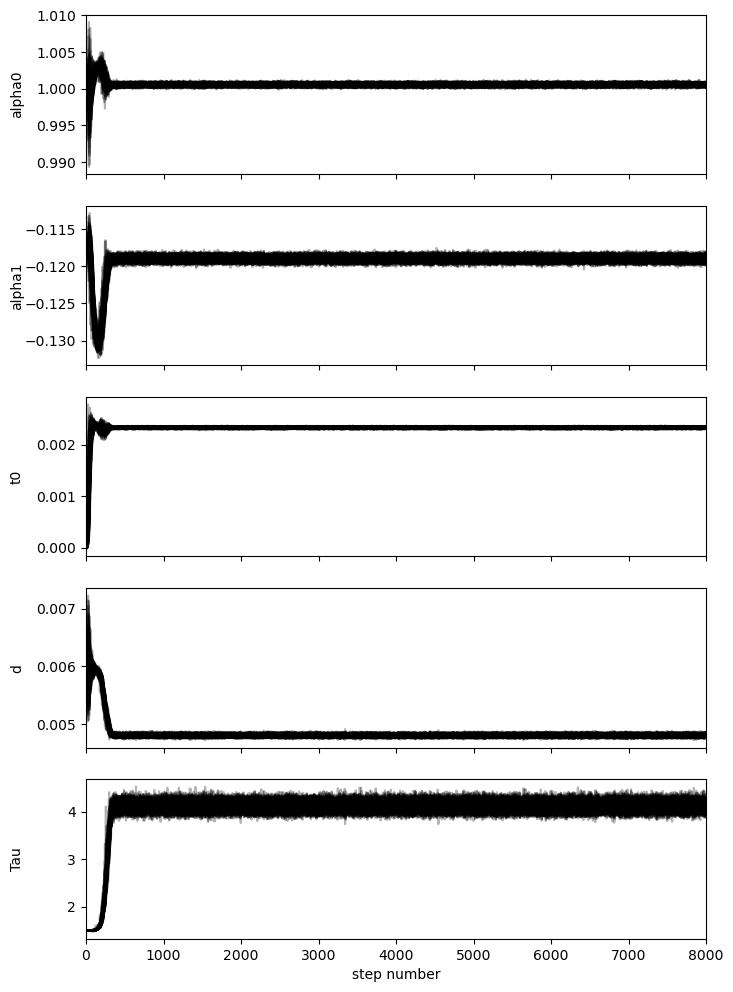

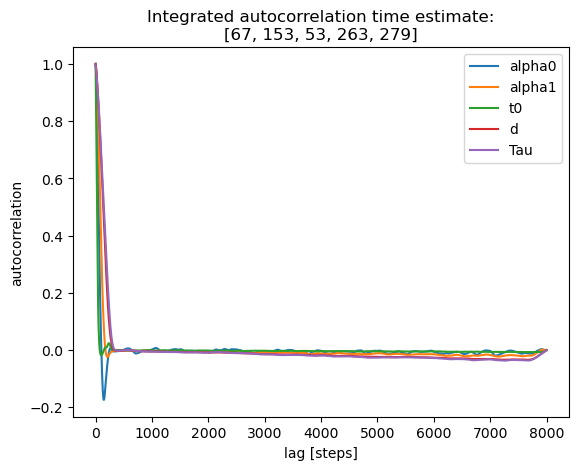

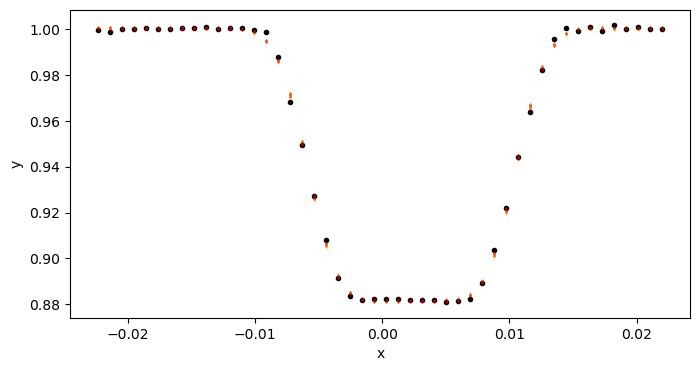

0 1388.3767371678732
Skipped cycle 1 due to insuffient data points 3
emcee parallel enabled, use 4 CPUs.


100%|██████████████████████████████████████████████████████████| 8000/8000 [01:29<00:00, 89.76it/s]


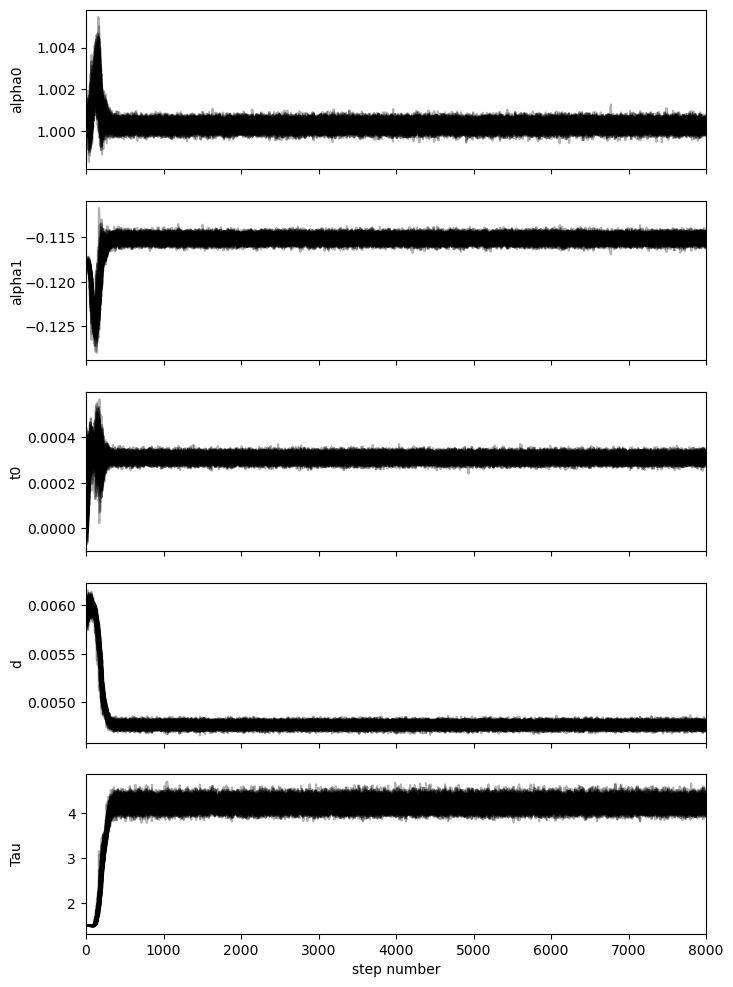

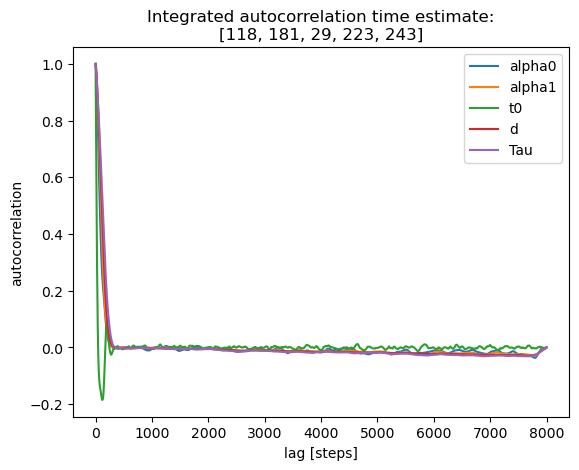

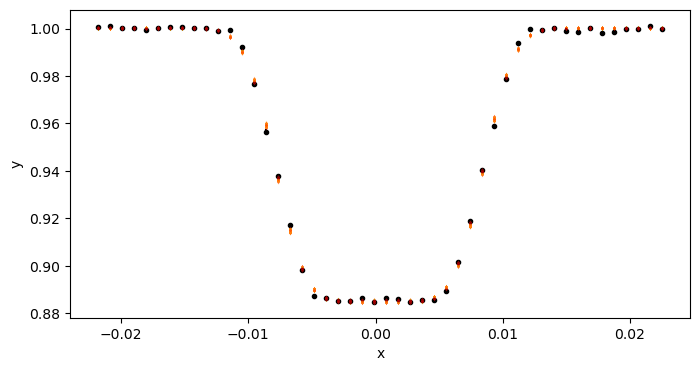

2 1432.6061655202236
emcee parallel enabled, use 4 CPUs.


100%|██████████████████████████████████████████████████████████| 8000/8000 [01:24<00:00, 95.07it/s]


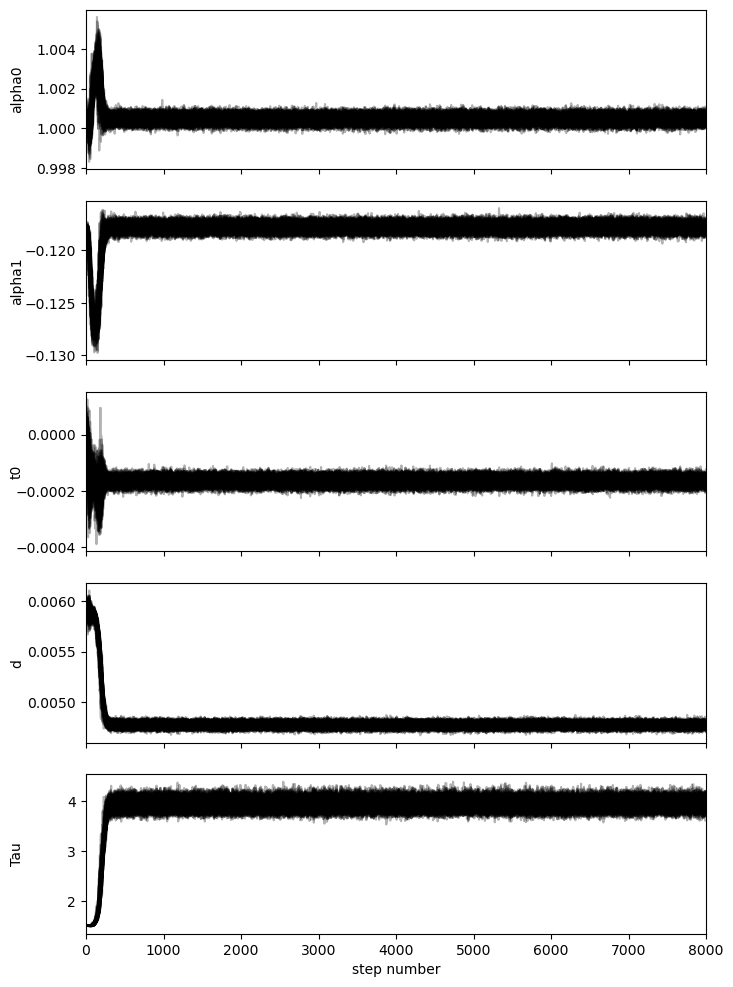

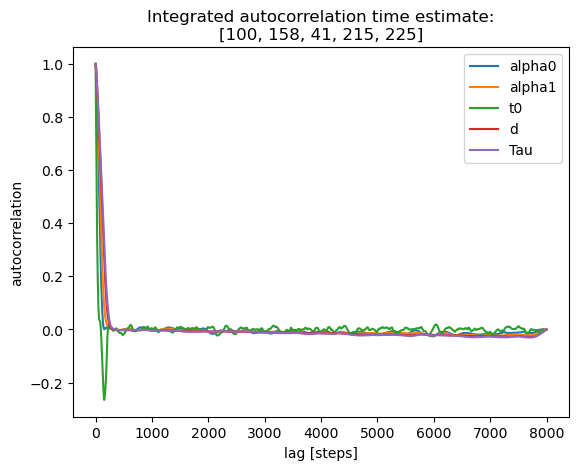

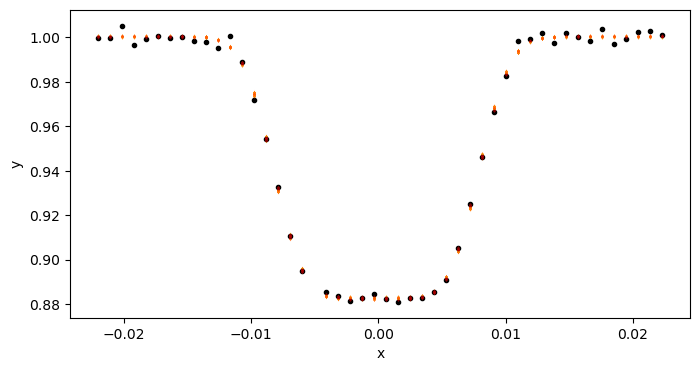

3 1454.7125914373626
emcee parallel enabled, use 4 CPUs.


100%|██████████████████████████████████████████████████████████| 8000/8000 [01:29<00:00, 89.51it/s]


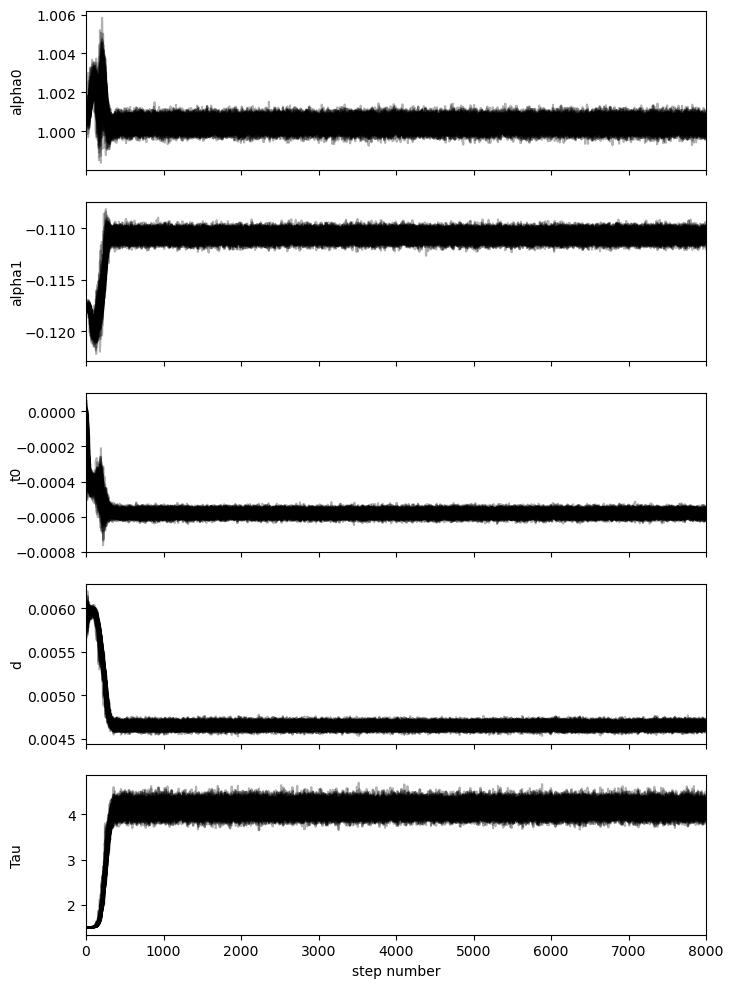

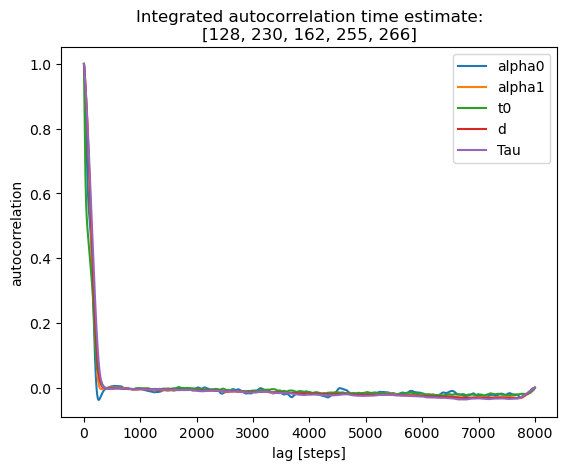

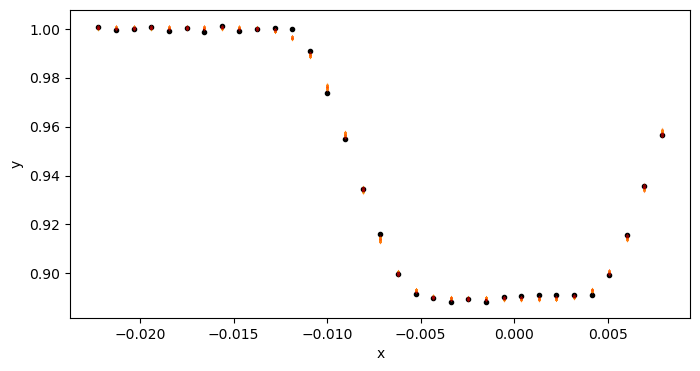

4 1476.6577159027565
emcee parallel enabled, use 4 CPUs.


100%|██████████████████████████████████████████████████████████| 8000/8000 [01:25<00:00, 93.05it/s]
The chain is shorter than 20 times the integrated autocorrelation time for 4 parameter(s). Use this estimate with caution and run a longer chain!
N/20 = 400;
tau: [ 242.660714    805.15434679  982.97221325  946.18809003 1033.6745449 ]


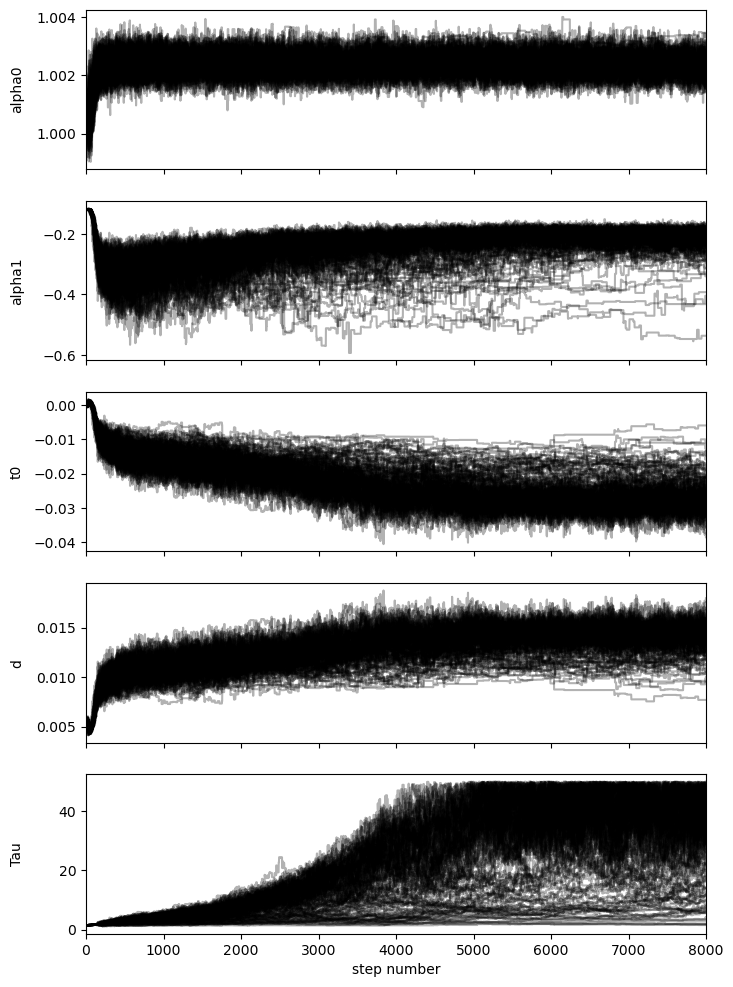

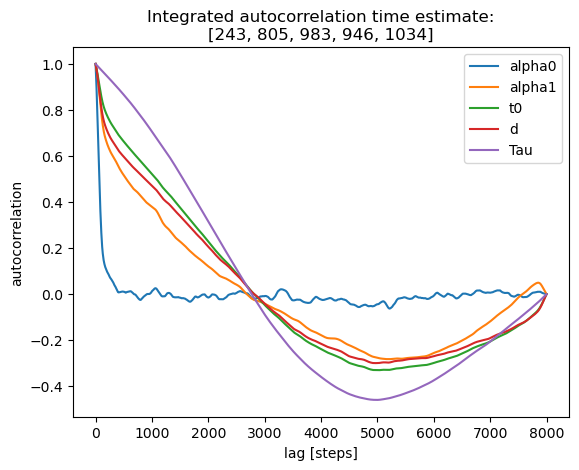

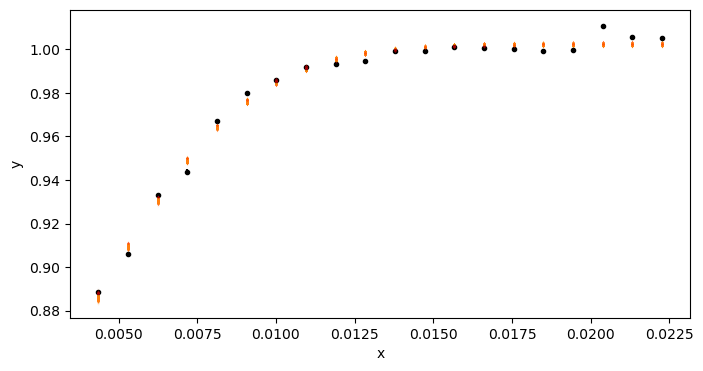

7 1543.437347410732
emcee parallel enabled, use 4 CPUs.


100%|██████████████████████████████████████████████████████████| 8000/8000 [01:27<00:00, 91.03it/s]


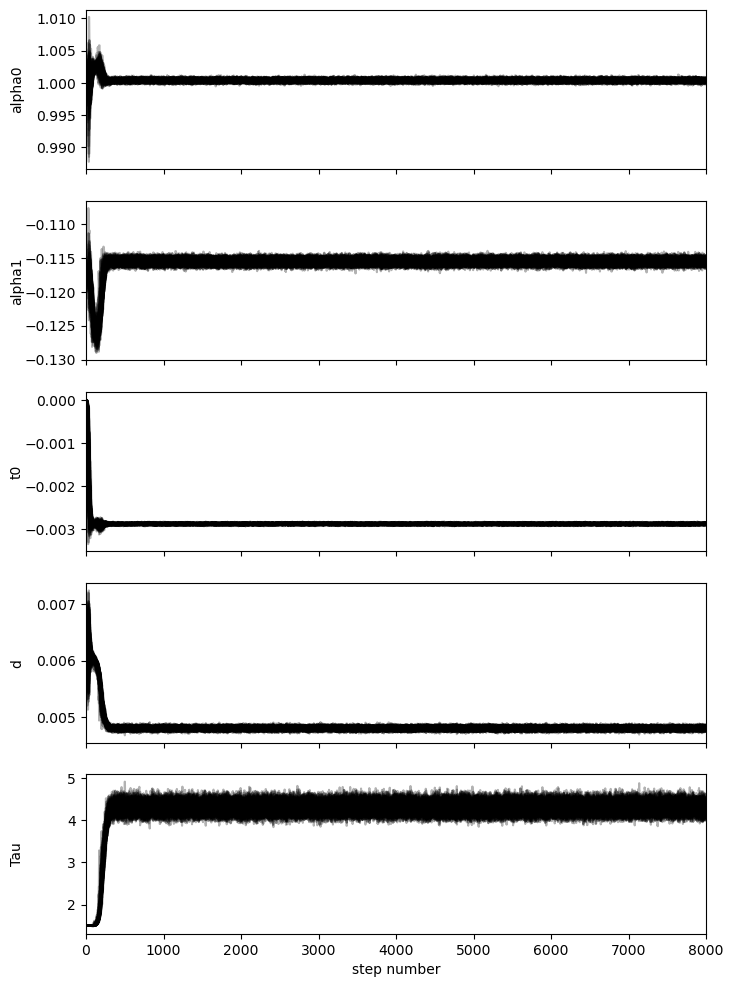

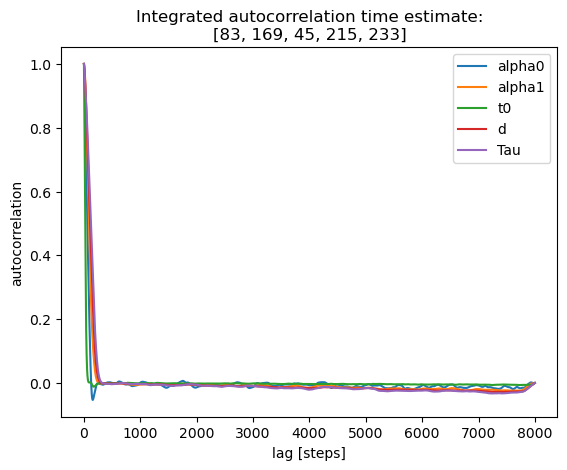

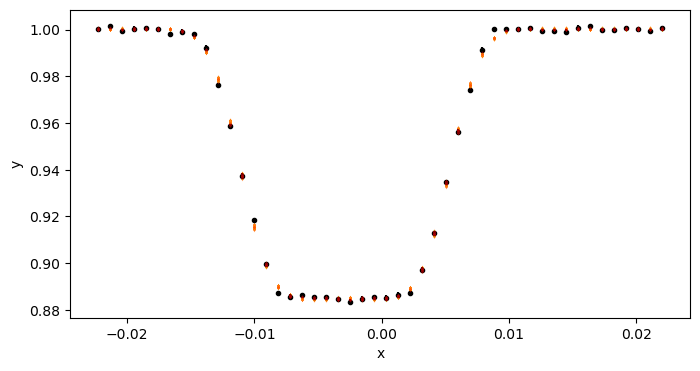

8 1565.249425950971
emcee parallel enabled, use 4 CPUs.


100%|██████████████████████████████████████████████████████████| 8000/8000 [01:28<00:00, 89.90it/s]


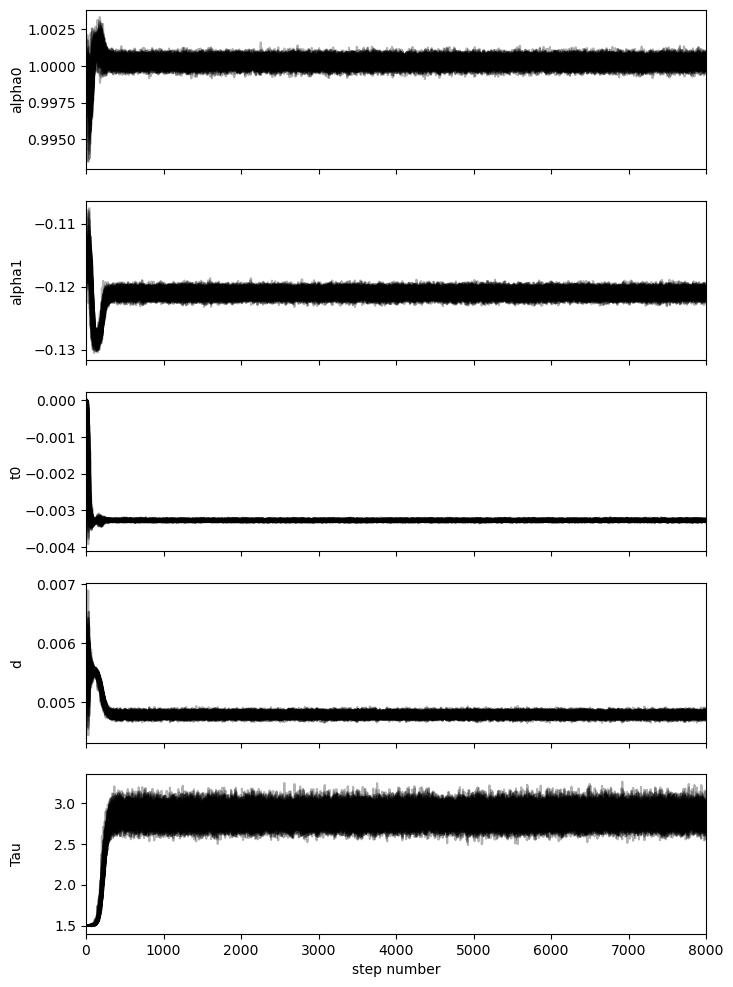

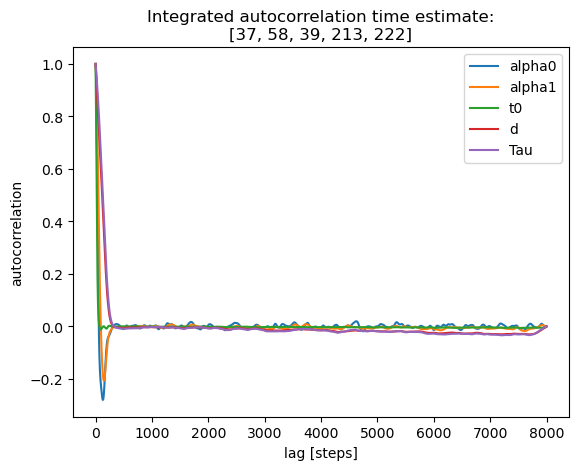

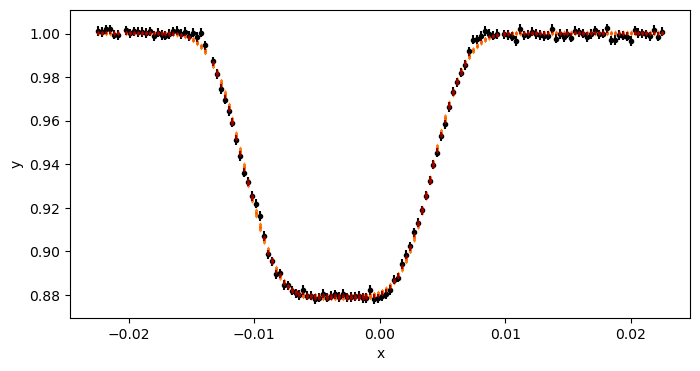

32 2095.8729325436634
emcee parallel enabled, use 4 CPUs.


100%|██████████████████████████████████████████████████████████| 8000/8000 [01:29<00:00, 89.48it/s]


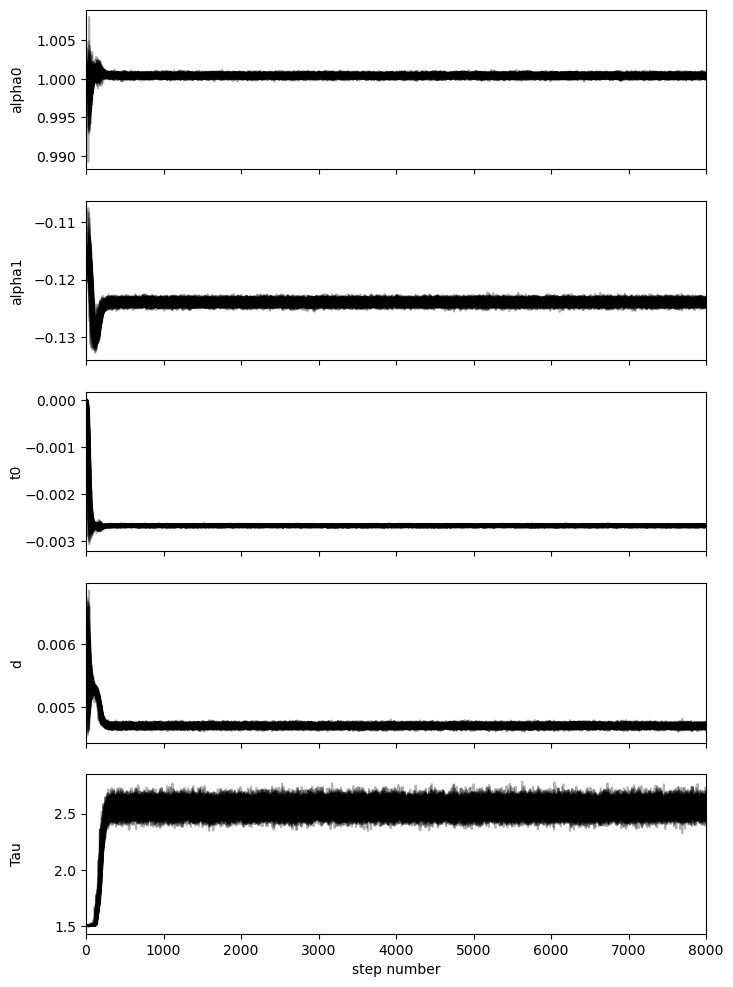

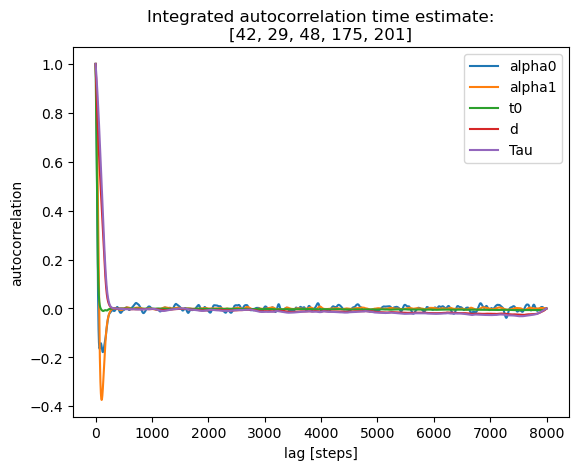

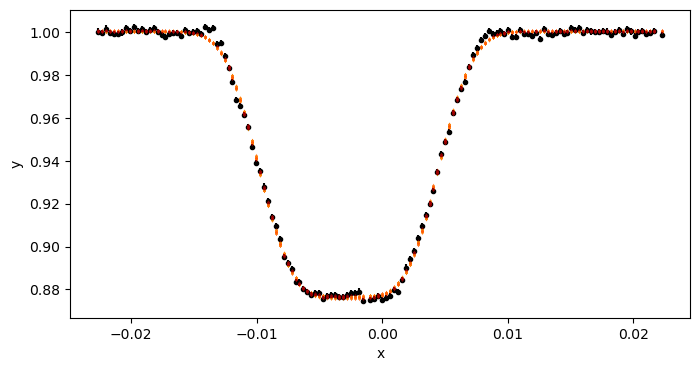

33 2117.970342246422
emcee parallel enabled, use 4 CPUs.


100%|██████████████████████████████████████████████████████████| 8000/8000 [01:27<00:00, 91.65it/s]


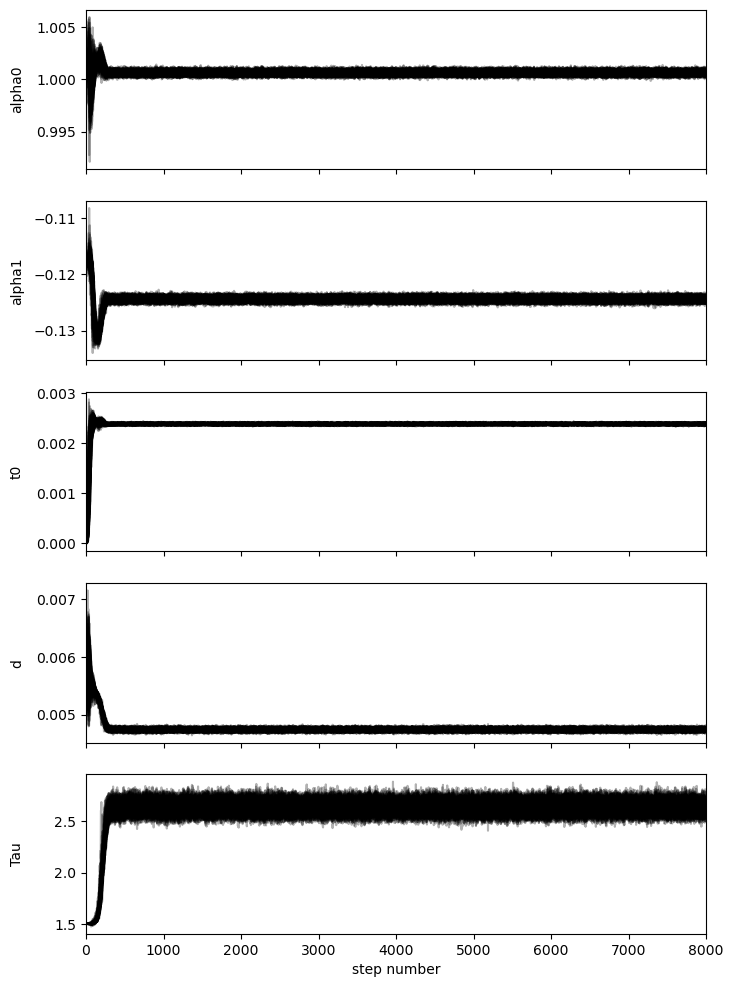

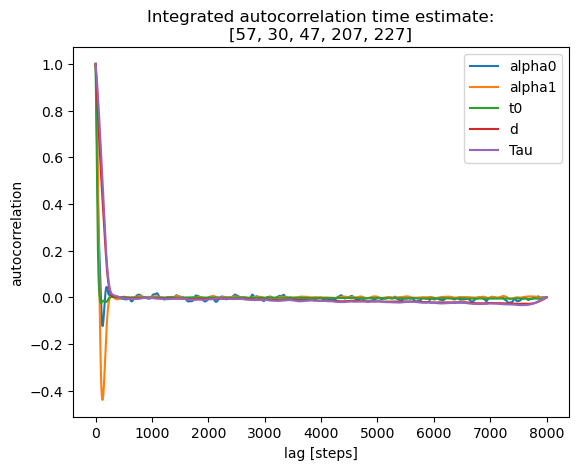

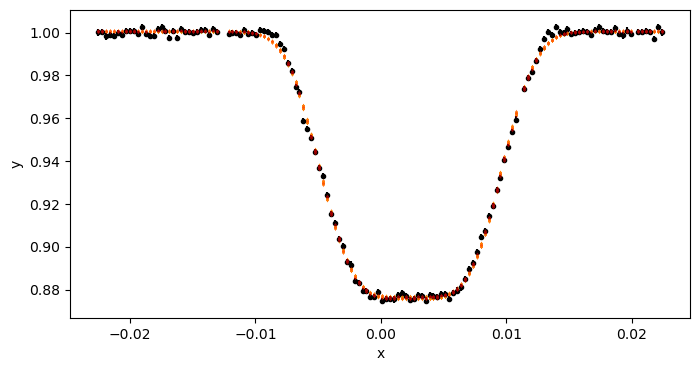

34 2140.0839681884754
emcee parallel enabled, use 4 CPUs.


100%|██████████████████████████████████████████████████████████| 8000/8000 [01:29<00:00, 89.67it/s]


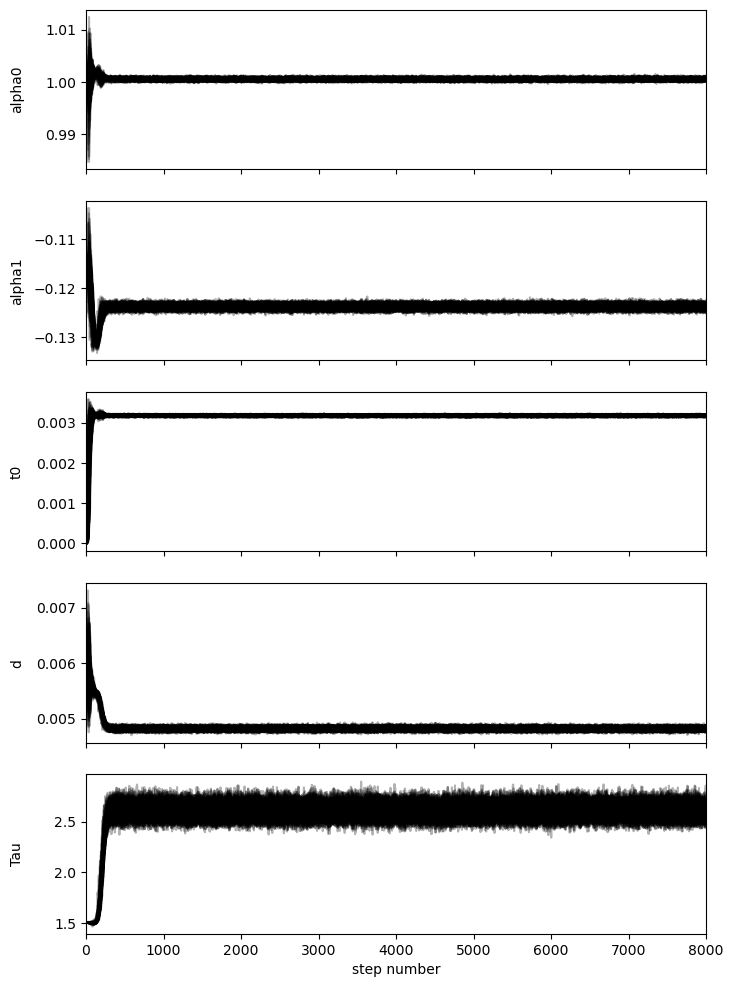

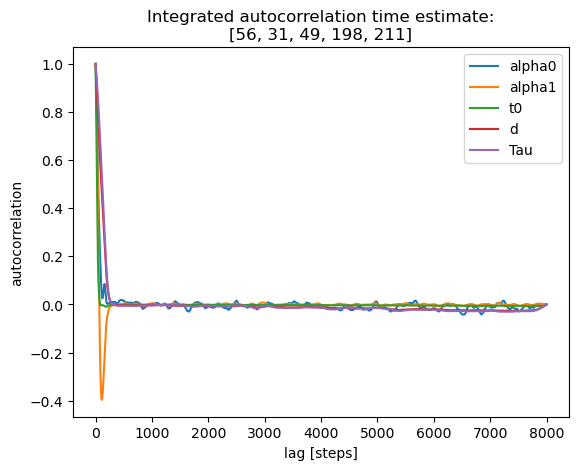

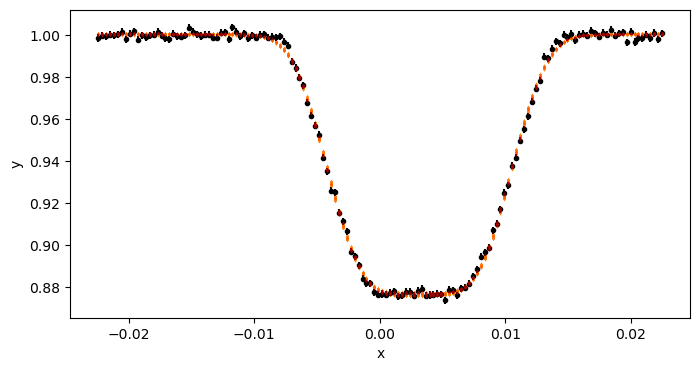

35 2162.19611099738
emcee parallel enabled, use 4 CPUs.


100%|██████████████████████████████████████████████████████████| 8000/8000 [01:28<00:00, 90.55it/s]


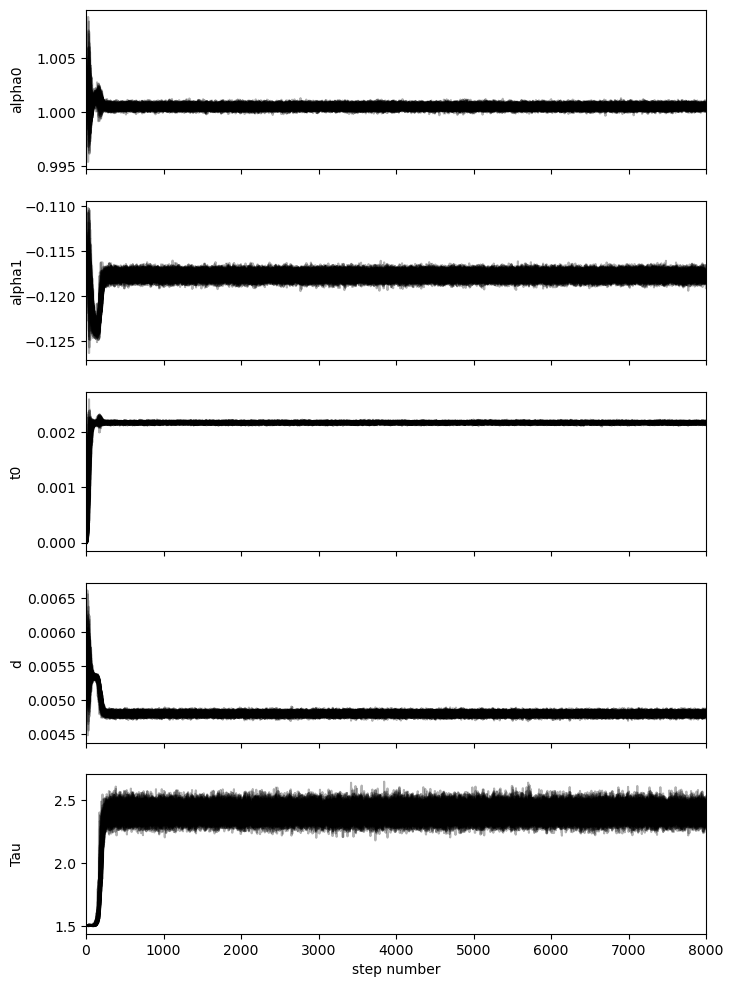

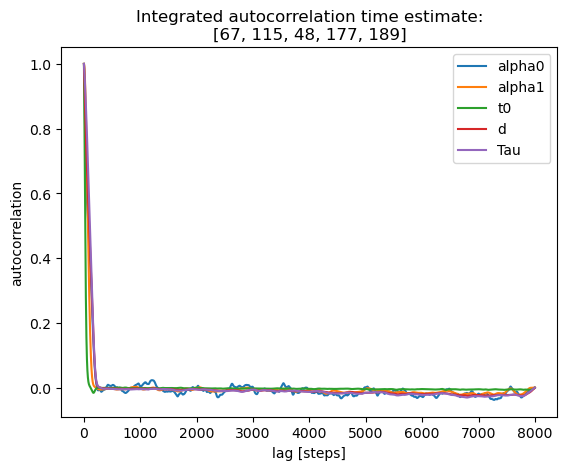

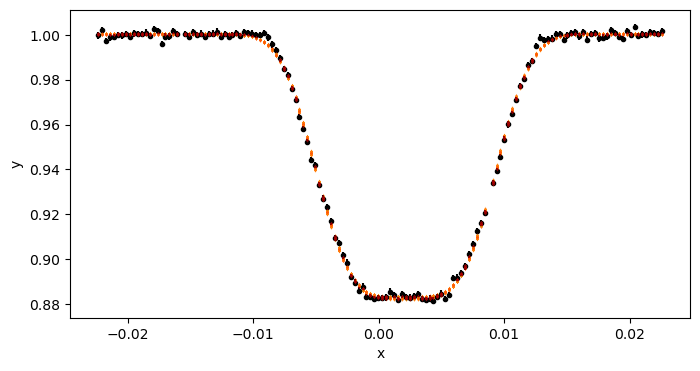

36 2184.308168688285
emcee parallel enabled, use 4 CPUs.


100%|██████████████████████████████████████████████████████████| 8000/8000 [01:28<00:00, 90.87it/s]


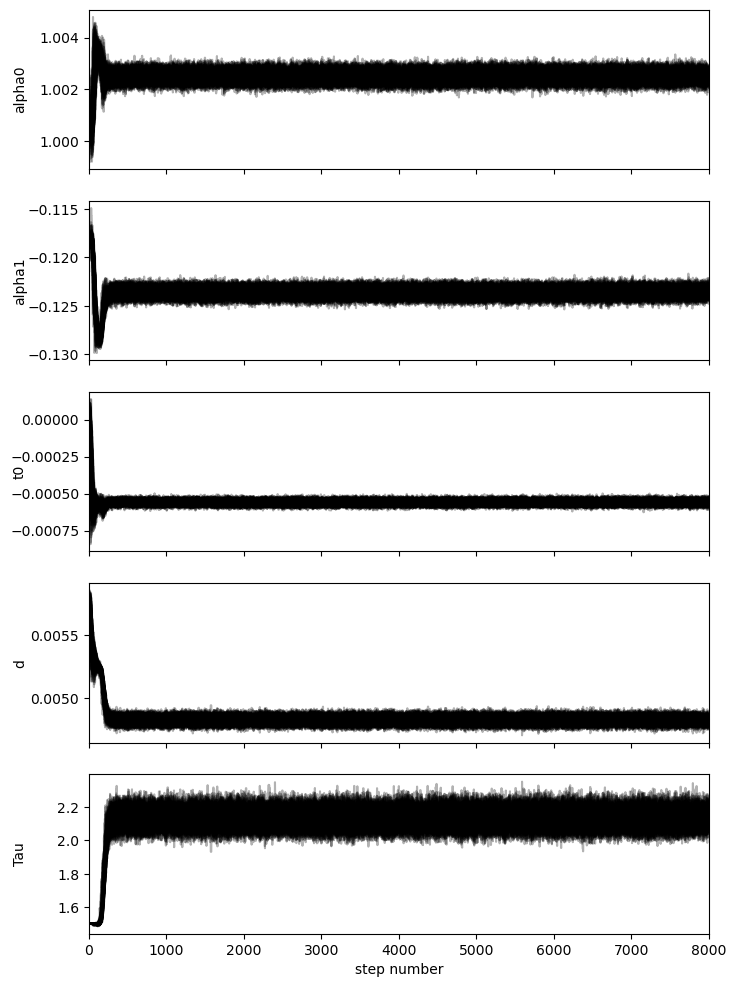

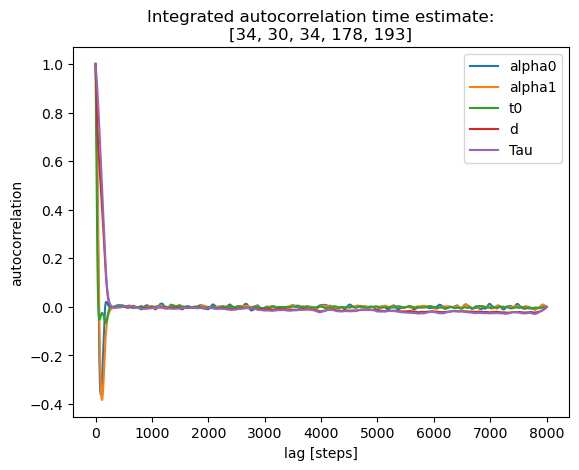

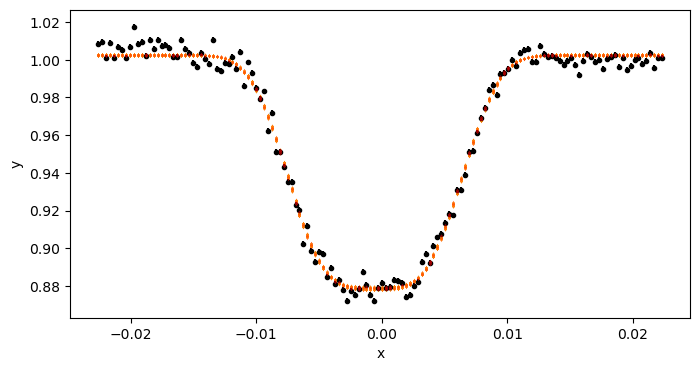

41 2294.8463324093736
emcee parallel enabled, use 4 CPUs.


100%|██████████████████████████████████████████████████████████| 8000/8000 [01:34<00:00, 85.07it/s]


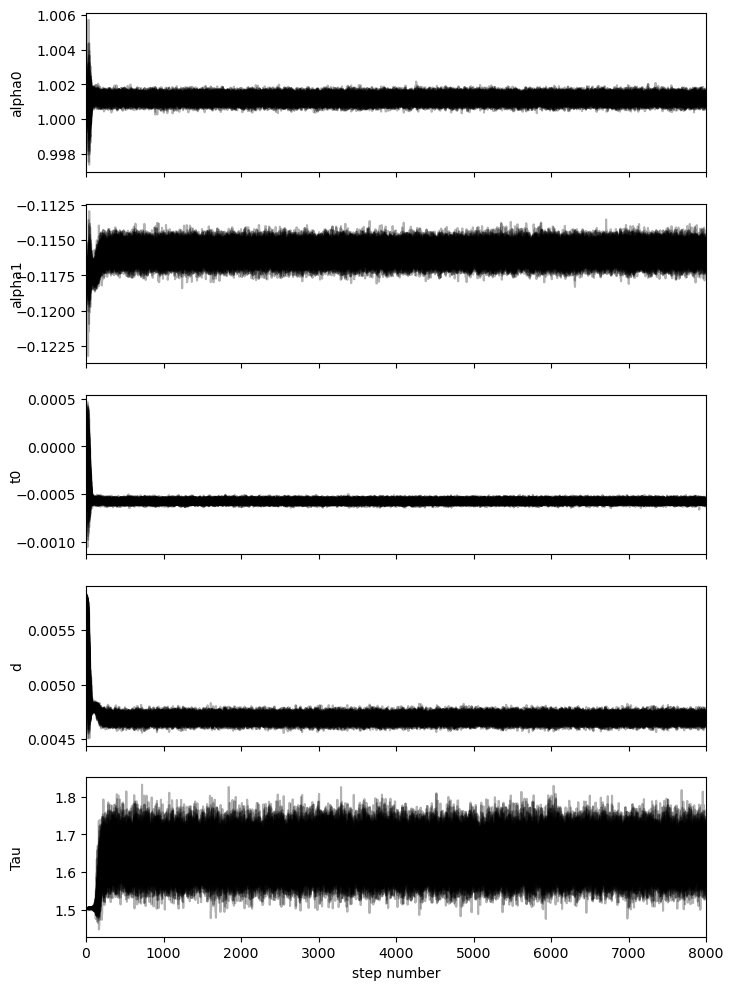

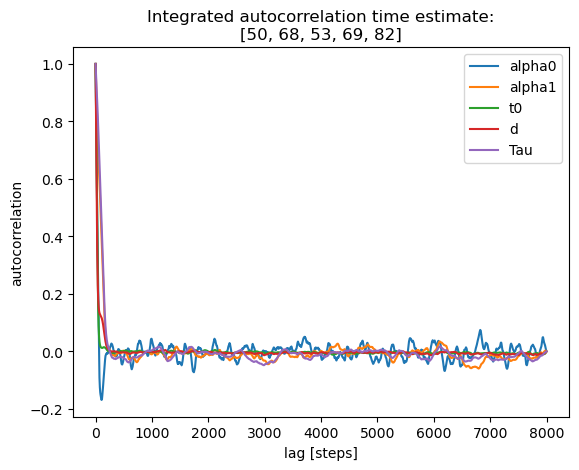

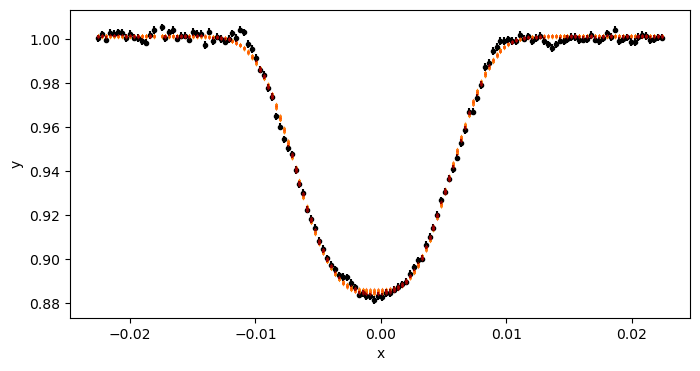

45 2383.286604426245
emcee parallel enabled, use 4 CPUs.


100%|██████████████████████████████████████████████████████████| 8000/8000 [01:33<00:00, 85.53it/s]


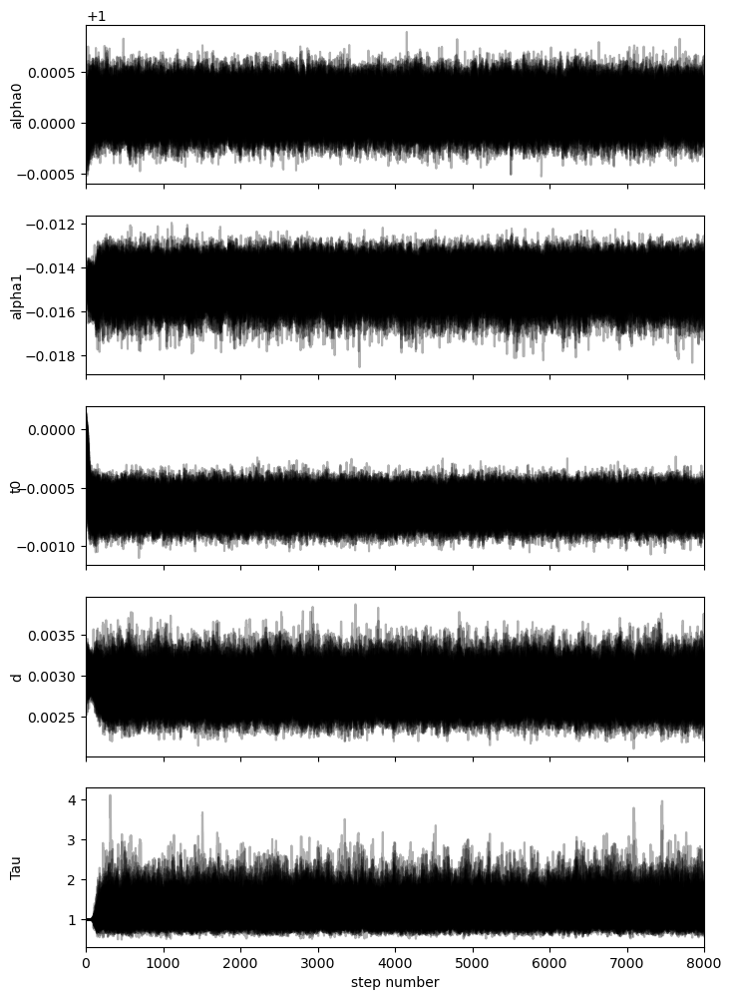

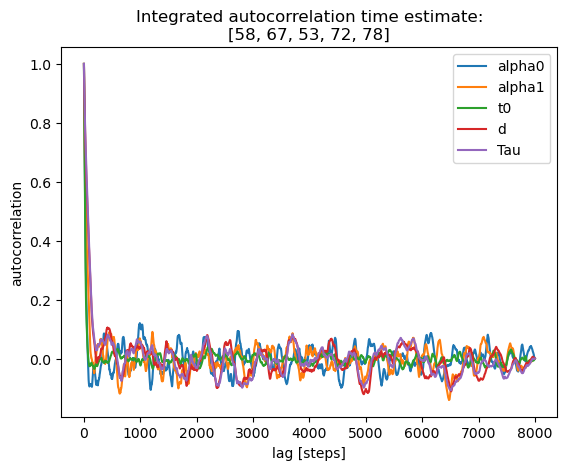

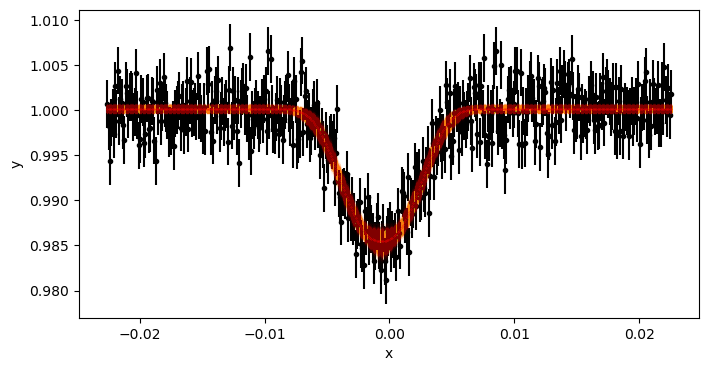

74 3024.445544038318
emcee parallel enabled, use 4 CPUs.


100%|██████████████████████████████████████████████████████████| 8000/8000 [01:34<00:00, 84.84it/s]


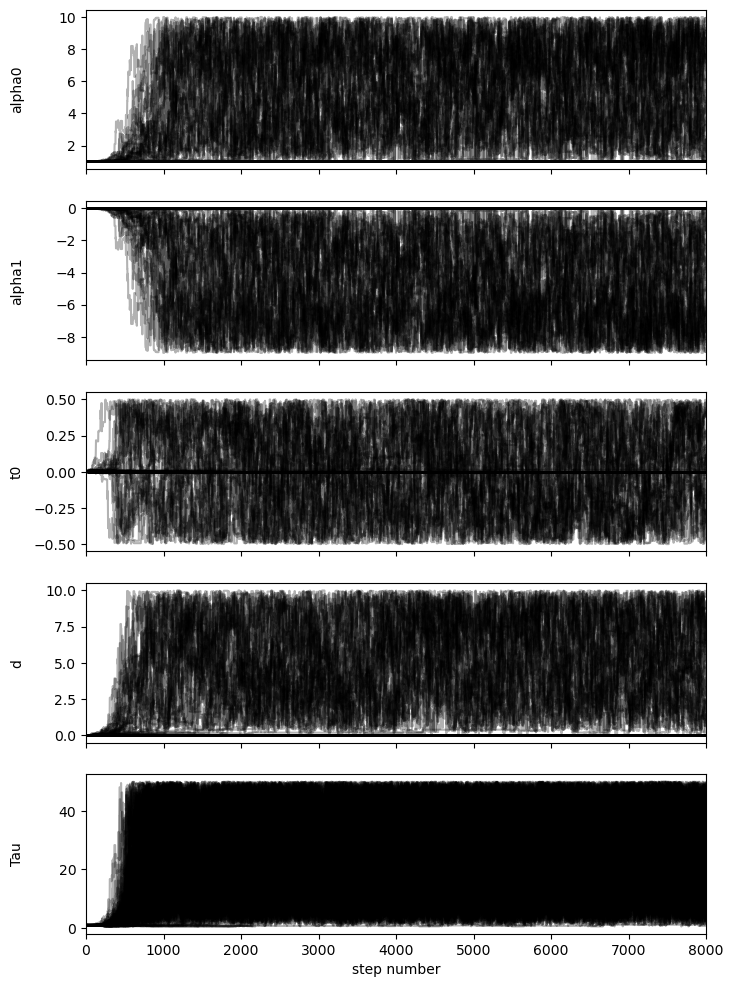

C:\dev\_juypter\PH_TESS_LightCurveViewer\eb_with_diff_sb_period\etv\etv_functions.py:290: RuntimeWarning: overflow encountered in cosh
  cosh_term = np.cosh((x - t0) / d)


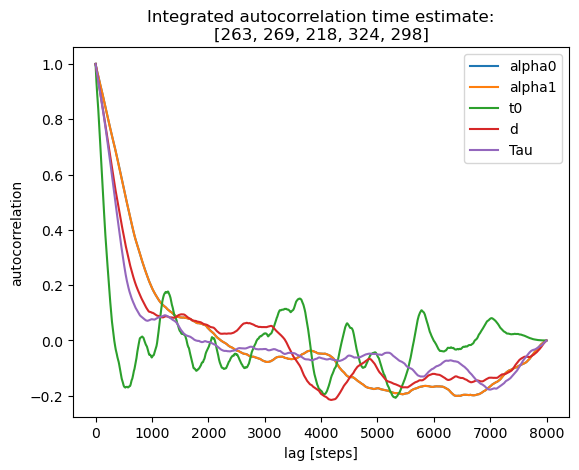

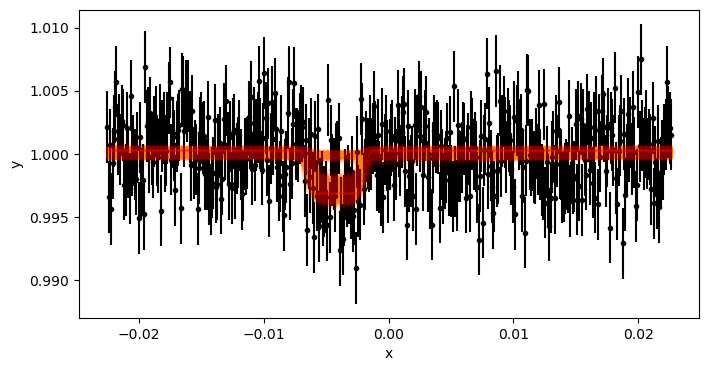

78 3112.8830350915323
number,epoch,mean_alpha0,mean_alpha1,t0,stdv_t0,mean_d,mean_Tau
0,1388.3767371678732,1.0005358146659684,-0.11899888380175588,0.002329316108449146,1.123797107593991e-05,0.004806430584678909,4.113975691581789
2,1432.6061655202236,1.00025185494147,-0.11516183267233052,0.0003087976912885453,1.320495879680893e-05,0.004767298575428798,4.1923834407967
3,1454.7125914373626,1.0004651684687835,-0.11778909860973905,-0.00016500946962982426,1.2982203120480429e-05,0.004774776724109195,3.9376399761330685
4,1476.6577159027565,1.0003717883669636,-0.11072057865769981,-0.0005810236531820802,1.4390576692339872e-05,0.004650692352902984,4.1244176340152485
7,1543.437347410732,1.0024015037425087,-0.2331342863114959,-0.022505659848219867,0.006011964463440177,0.012946625322594617,13.798942065072055
8,1565.249425950971,1.0003650707112657,-0.11551403439122965,-0.002873272443845787,1.4106471162971301e-05,0.00479624641479319,4.299743914723815
32,2095.8729325436634,1.0002639221862153,-0.1210232

In [60]:

_lc_data_f = lc_data.fold(epoch_time=t0_primary, period=period, normalize_phase=True)

c_etv_out_str = "number,epoch,mean_alpha0,mean_alpha1,t0,stdv_t0,mean_d,mean_Tau\n"

for c in np.unique(_lc_data_f.cycle):
    lc_f = _lc_data_f[_lc_data_f.cycle == c]
    lc_f = lc_f.truncate(-window_width_p / 2, window_width_p / 2)
    if len(lc_f) < 1:
        continue

    if len(lc_f) < 8:
        print(f"Skipped cycle {c} due to insuffient data points {len(lc_f)}")
        continue

    # if True:
    #     ax = lc_f.scatter(label=f"C.{c}");  # for diagnostics
    #     continue

    # verbose_cycles =   # the first cycle of sectors 14,  41,  54,  81

    # if c not in verbose_cycles:  # for trying a few cycles
    #     continue

    # cycles are sparse enough that i could use all
    plot_chains, plot_autocorrelation = True, True
    # if c in verbose_cycles:  # show MCMC details for selected cycles
    #     plot_chains, plot_autocorrelation = True, True  

    # convert lc to the form needed by fit etv_functions
    lc_f_data = SimpleNamespace(time=lc_f.time_original.value, phase=lc_f.time.value, flux=np.array(lc_f.flux.value), err=np.array(lc_f.flux_err.value))
    
    start_vals = [mean_alpha0, mean_alpha1, 0, mean_d, mean_Tau]  # mean_t0 is not helpful at all
    # custom start_vals for sector 63, 66, much shallower dips
    if c == 74:  # sector 63
        start_vals = [1.0, -0.015, 0, 0.003, 1.0]
    if c == 78:  # sector 66
        start_vals = [1.0, -0.005, 0, 0.003, 1.0]

    
    _alpha0, _alpha1, _t0, _d, _Tau, _fit_params_stats = etv_functions.run_mcmc_initial_fit(
        lc_f_data, start_vals, 
        # nruns=20, discard=1, 
        nruns=8000, discard=1000,   # 6000 would probably be sufficient to satisfy convergence check of tol=20, but use a larger run to be safe
        autocorr_time_kwargs=dict(tol=20), pool=-2, plot_chains=plot_chains,  plot_autocorrelation=plot_autocorrelation, plot=True, also_return_stats=True)
    _stdv_t0 = _fit_params_stats["std_t0"]
    _t = np.mean(lc_f.time_original.value)  # approximate transit time 
    print(c, _t)
    
    c_etv_out_str += ",".join([str(s) for s in [c, _t, _alpha0, _alpha1, _t0, _stdv_t0, _d, _Tau]])
    c_etv_out_str += "\n"
    
print(c_etv_out_str)

In [ ]:
# # save the result in a cell for safekeeping
# c_etv_out_str = """
# number,epoch,mean_alpha0,mean_alpha1,t0,stdv_t0,mean_d,mean_Tau
# 0,1388.3767371678732,1.0005358146659684,-0.11899888380175588,0.002329316108449146,1.123797107593991e-05,0.004806430584678909,4.113975691581789
# 2,1432.6061655202236,1.00025185494147,-0.11516183267233052,0.0003087976912885453,1.320495879680893e-05,0.004767298575428798,4.1923834407967
# 3,1454.7125914373626,1.0004651684687835,-0.11778909860973905,-0.00016500946962982426,1.2982203120480429e-05,0.004774776724109195,3.9376399761330685
# 4,1476.6577159027565,1.0003717883669636,-0.11072057865769981,-0.0005810236531820802,1.4390576692339872e-05,0.004650692352902984,4.1244176340152485
# 7,1543.437347410732,1.0024015037425087,-0.2331342863114959,-0.022505659848219867,0.006011964463440177,0.012946625322594617,13.798942065072055
# 8,1565.249425950971,1.0003650707112657,-0.11551403439122965,-0.002873272443845787,1.4106471162971301e-05,0.00479624641479319,4.299743914723815
# 32,2095.8729325436634,1.0002639221862153,-0.12102324793339683,-0.0032770663064175774,1.8908210512766804e-05,0.0047802585256001215,2.83928098517365
# 33,2117.970342246422,1.0004189843075904,-0.12394605866272909,-0.0026791679828328963,1.2337937488932048e-05,0.004705267496382533,2.5477308458301664
# 34,2140.0839681884754,1.0006295839823718,-0.12437202621426524,0.0023826460117078447,1.2487356754424273e-05,0.004737228606889864,2.632960478158294
# 35,2162.19611099738,1.0004964069636735,-0.12380154427560666,0.0031714679901360186,1.4821653011844765e-05,0.004817359238428042,2.608655948182177
# 36,2184.308168688285,1.0005011694295531,-0.11769529123877212,0.0021680404753554768,1.3343044828955485e-05,0.004794512413908223,2.4004938843880534
# 41,2294.8463324093736,1.0025074143862924,-0.12360033274371282,-0.0005591928270149241,1.4083899591060332e-05,0.004821616147596146,2.1316993305672183
# 45,2383.286604426245,1.0011832439315573,-0.11590795304521809,-0.0005763532538742408,1.6533644495196746e-05,0.0046900042594313456,1.6440803970400195
# 74,3024.445544038318,1.0001537609061426,-0.014676654417752052,-0.0006631932293426299,9.513066117499905e-05,0.0028351320104383383,1.2040971526042386
# 78,3112.8830350915323,1.000301840823255,-0.003417741792032414,-0.004222604459956645,0.15926363074827468,0.0010231210076530823,25.20306101032319
# """

#### per-cycle fit for `data_secondary`

- use custom `log_prior()`

100%|█████████████████████████████████████████████████████████| 8000/8000 [00:41<00:00, 191.85it/s]


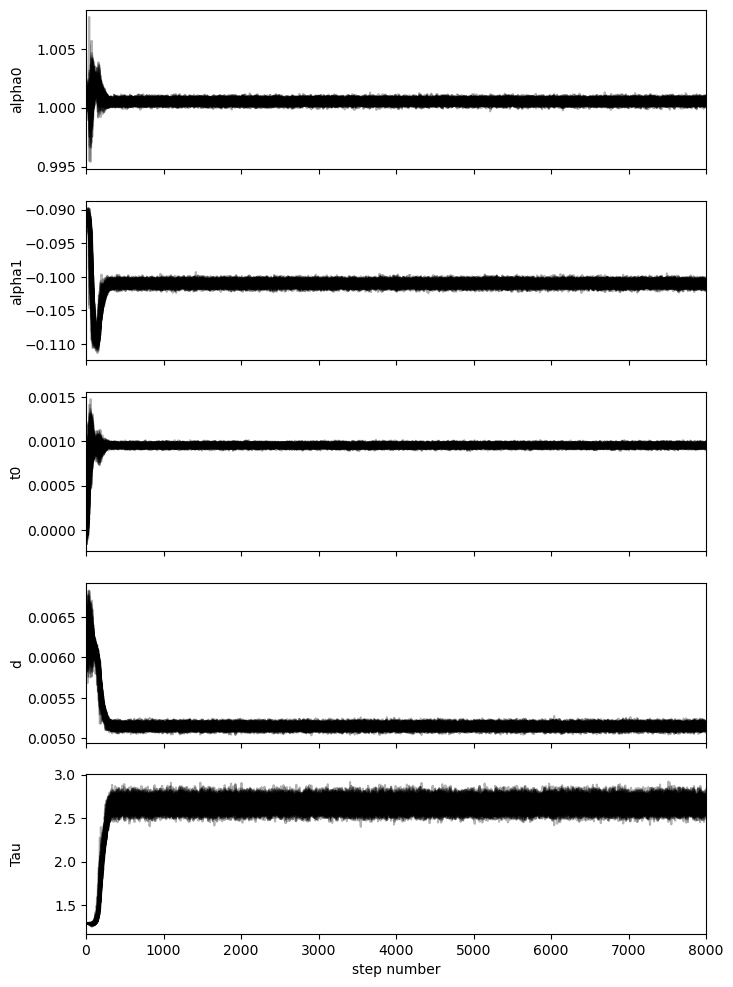

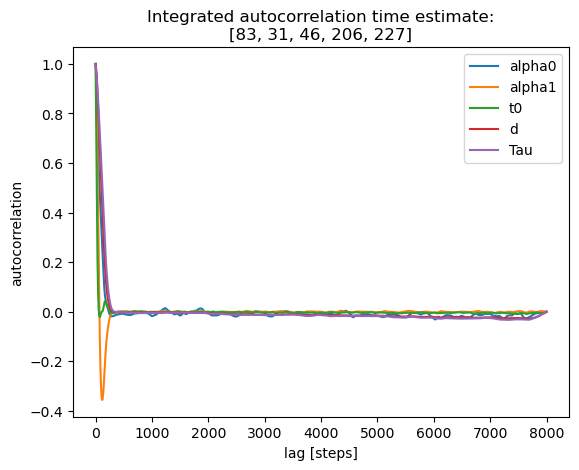

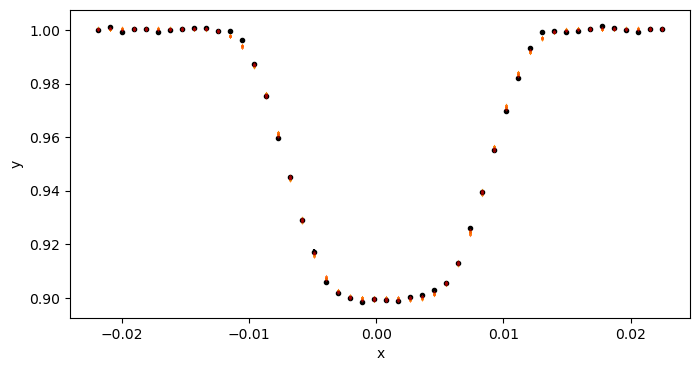

1 1399.3352038869698


100%|█████████████████████████████████████████████████████████| 8000/8000 [00:39<00:00, 200.98it/s]


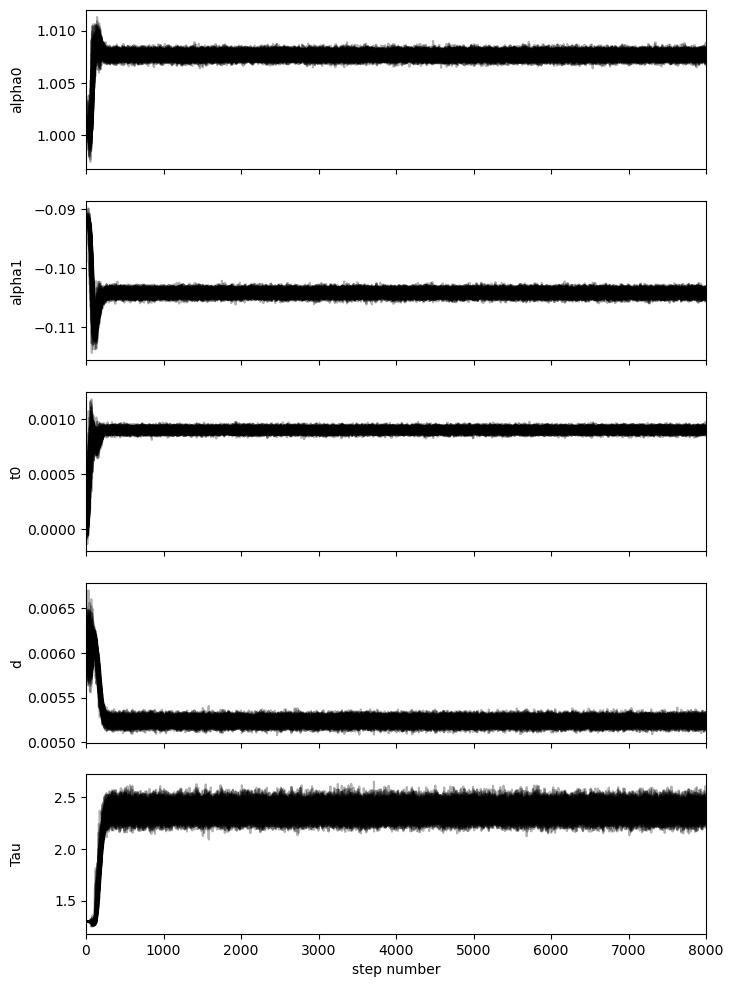

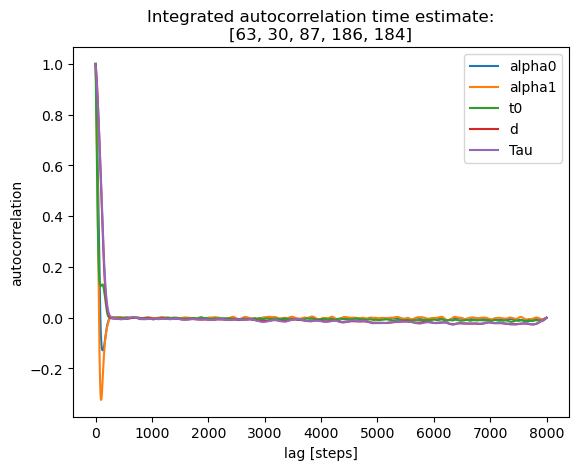

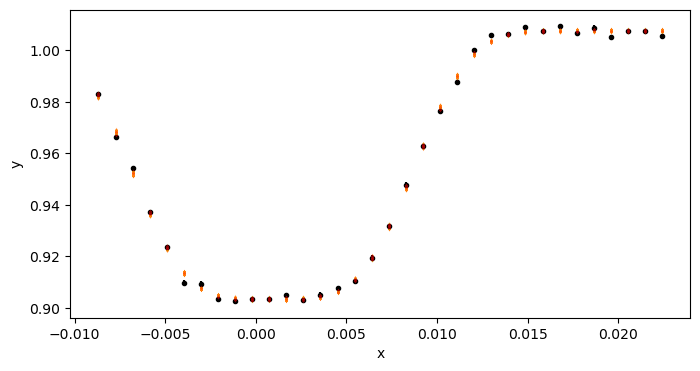

2 1421.5853392612346


100%|█████████████████████████████████████████████████████████| 8000/8000 [00:40<00:00, 198.15it/s]


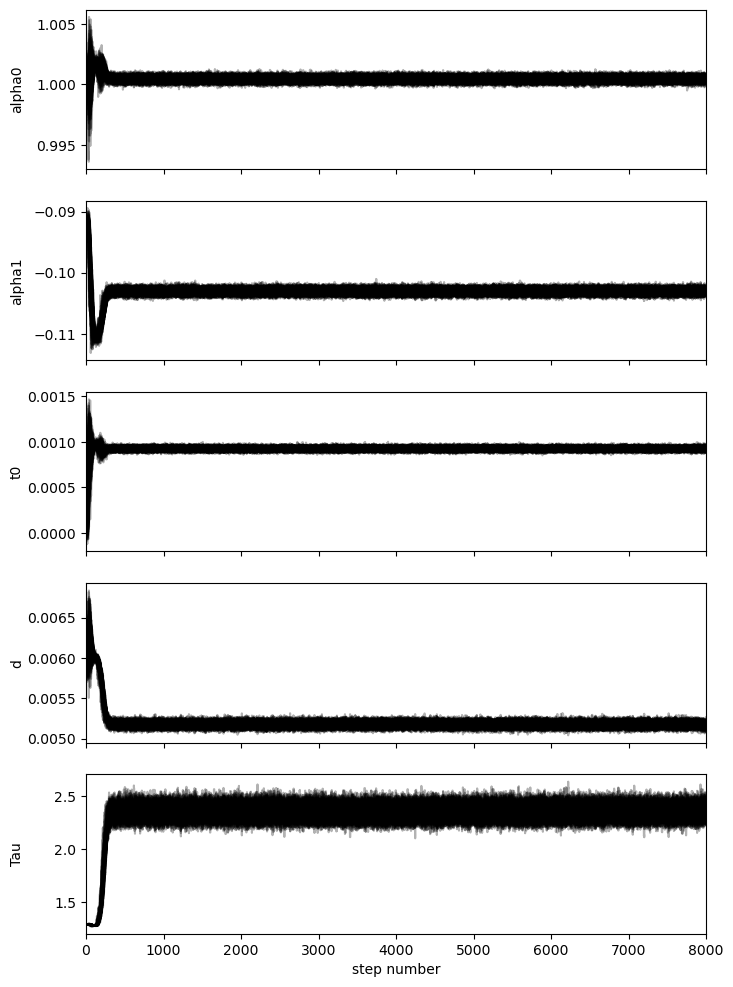

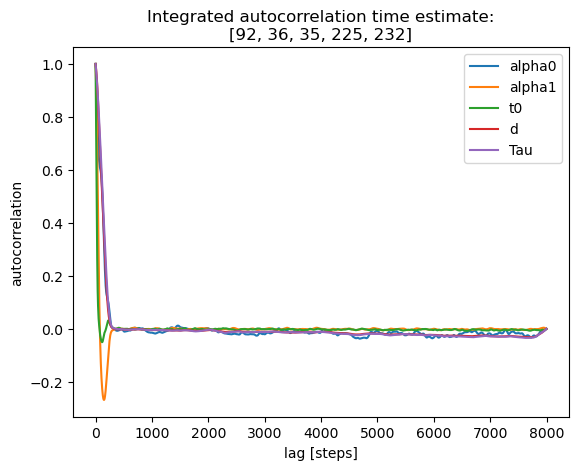

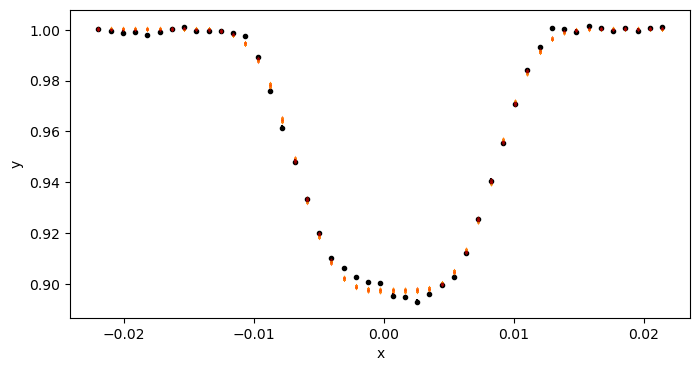

3 1443.533186487803


100%|█████████████████████████████████████████████████████████| 8000/8000 [00:41<00:00, 193.06it/s]


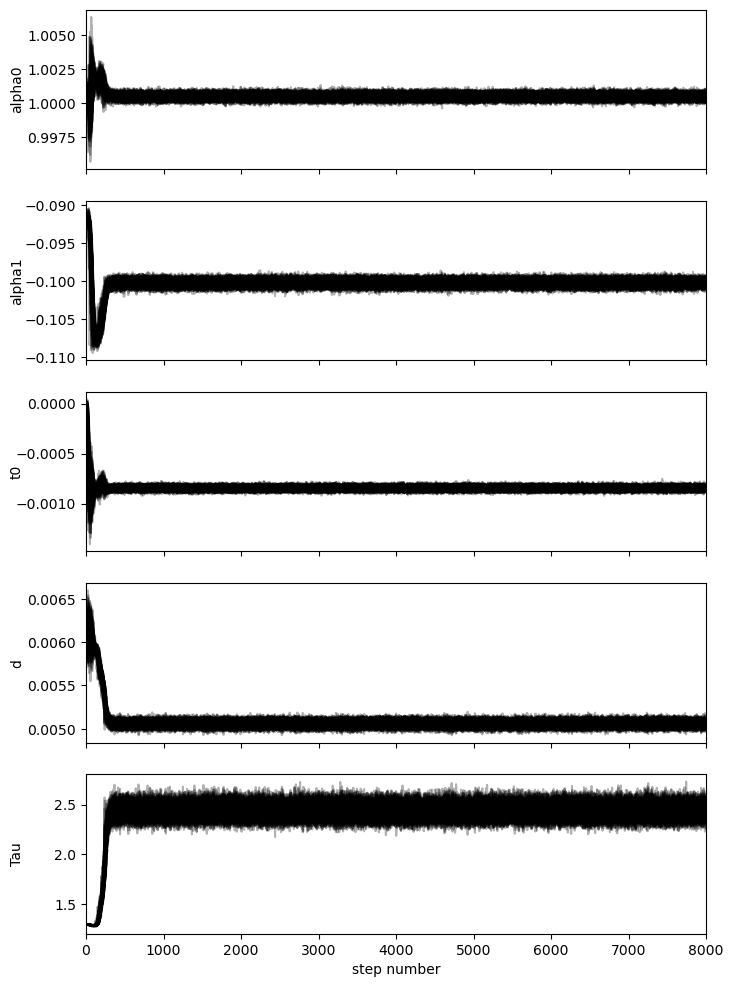

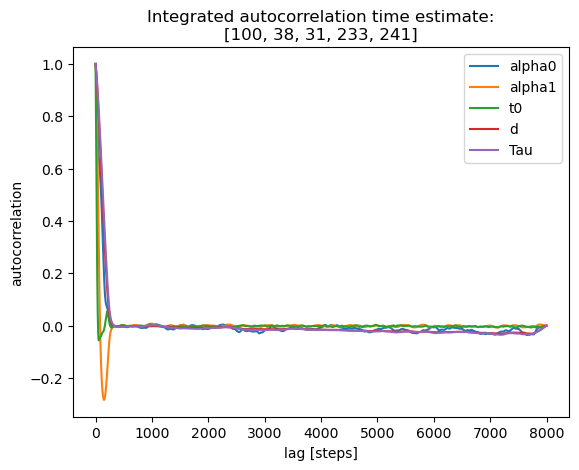

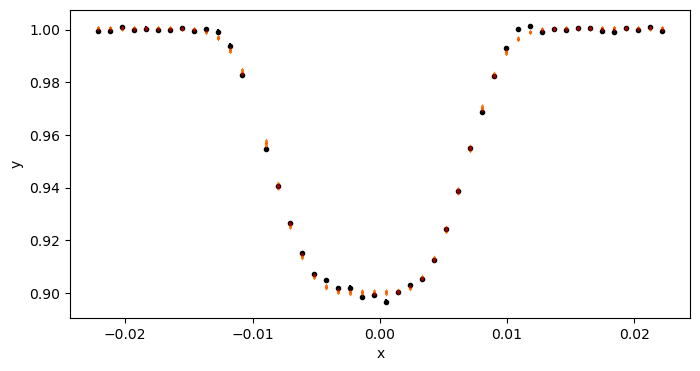

5 1487.755890125215


100%|█████████████████████████████████████████████████████████| 8000/8000 [00:40<00:00, 195.81it/s]


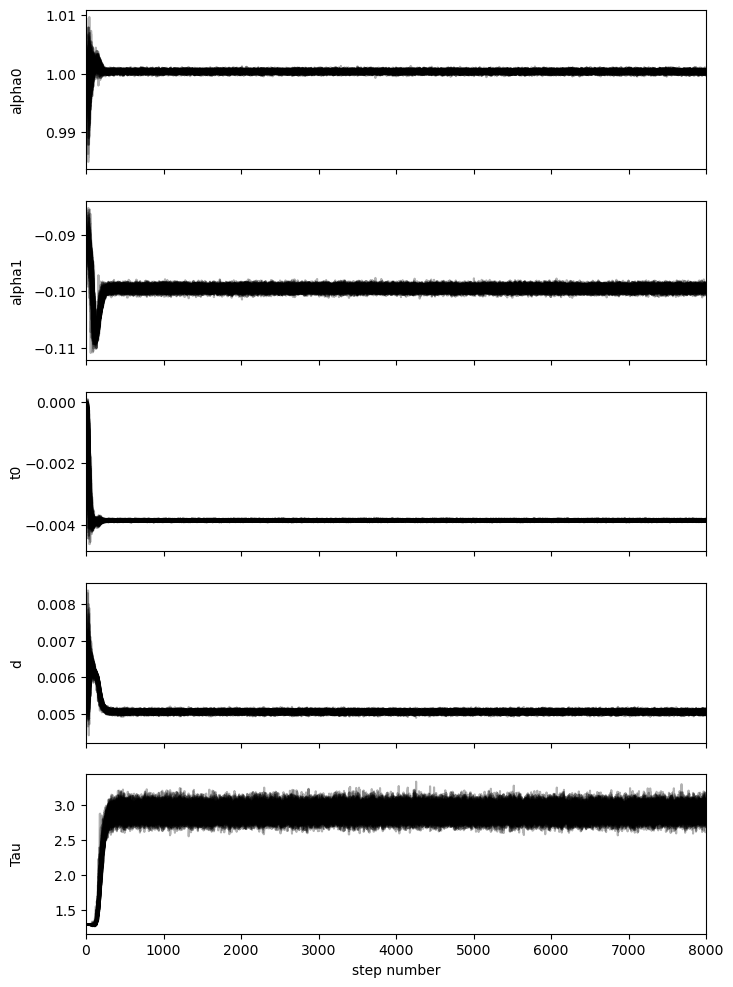

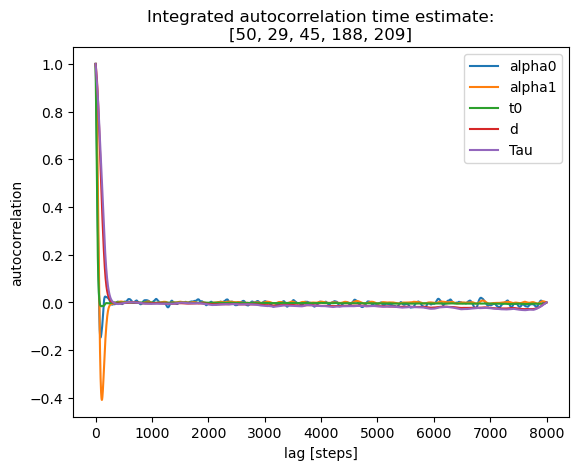

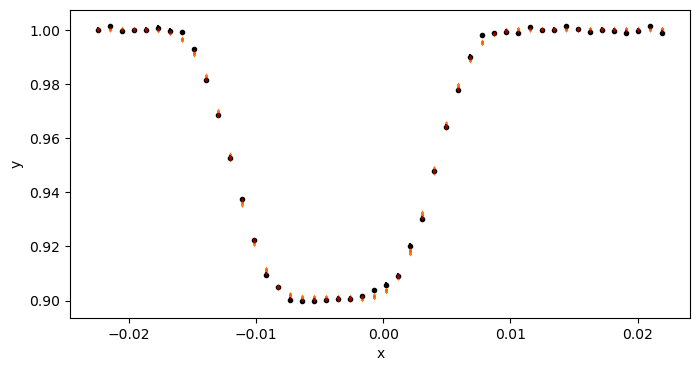

8 1554.0621262826753


100%|█████████████████████████████████████████████████████████| 8000/8000 [00:41<00:00, 192.30it/s]


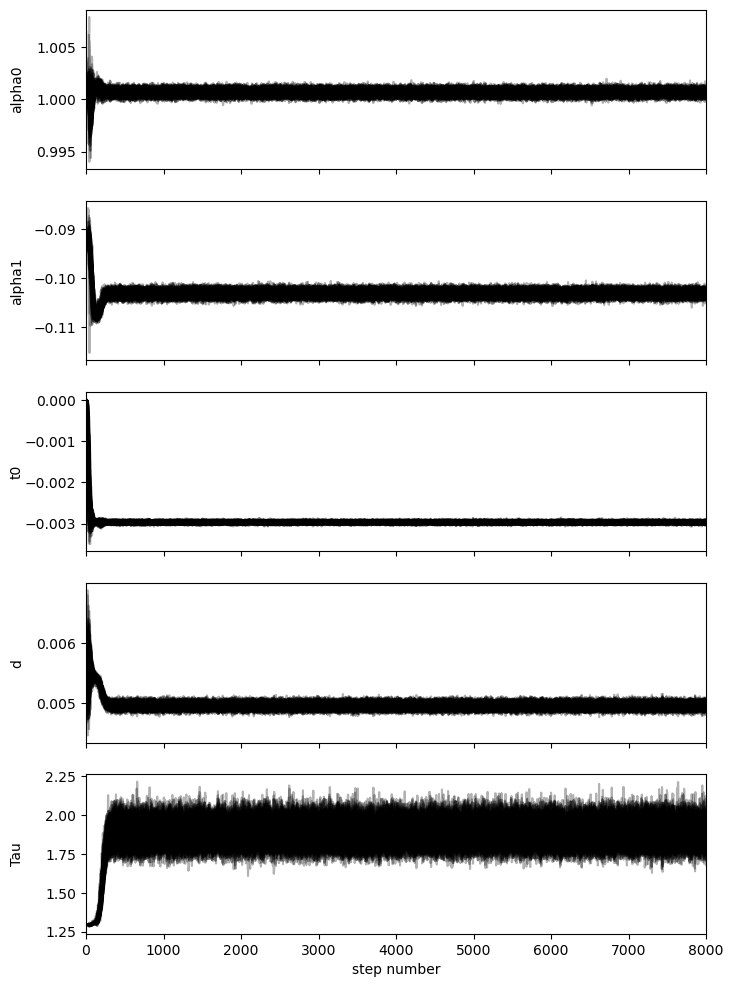

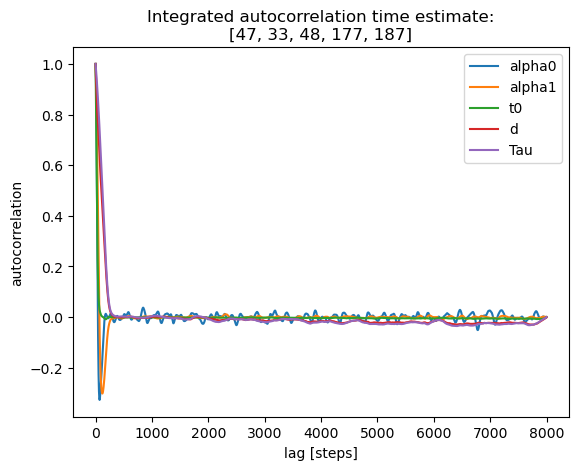

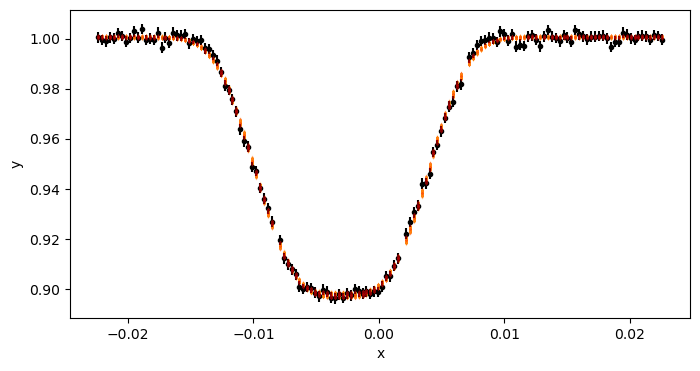

33 2106.709530023932


100%|█████████████████████████████████████████████████████████| 8000/8000 [00:38<00:00, 205.19it/s]


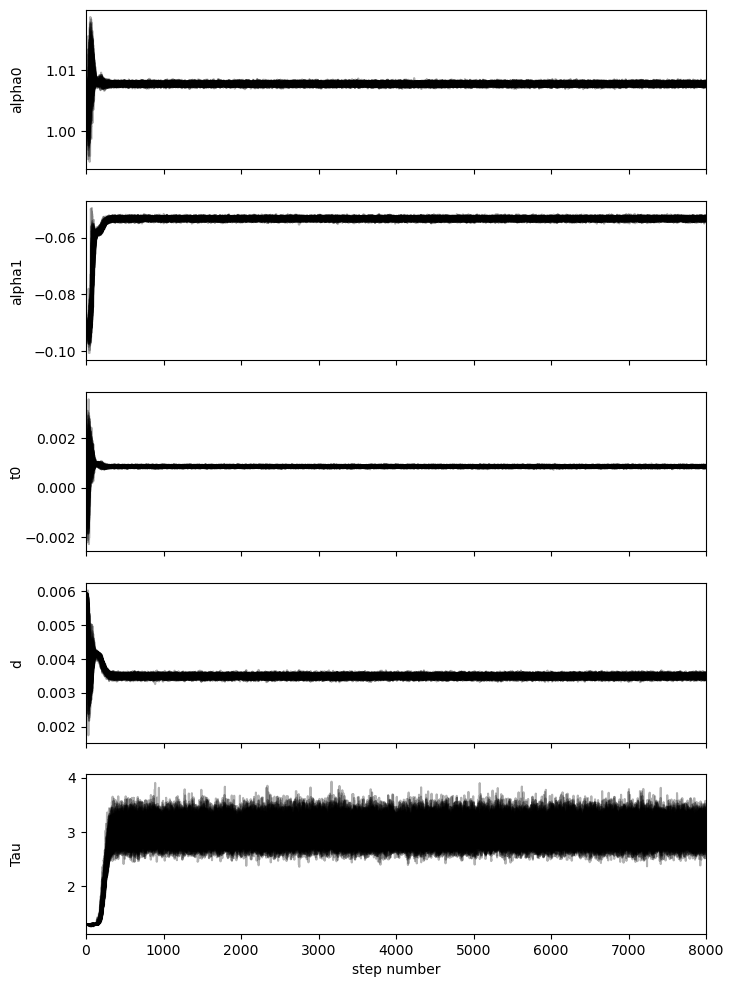

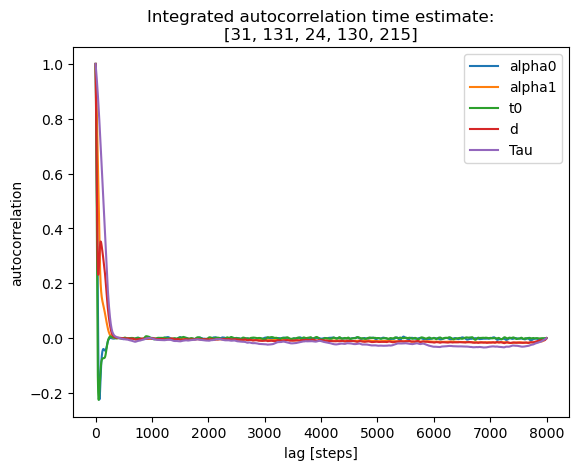

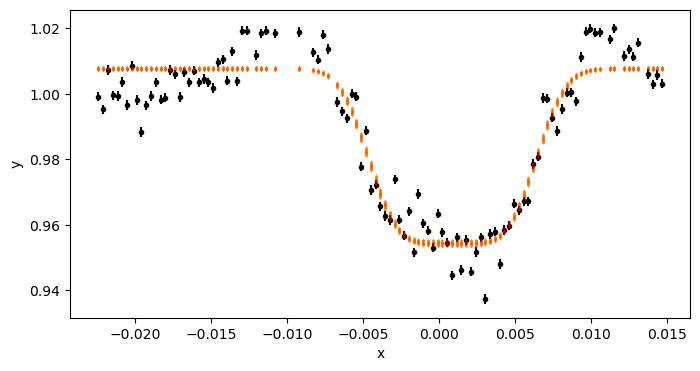

34 2128.728322128887


100%|█████████████████████████████████████████████████████████| 8000/8000 [00:45<00:00, 177.17it/s]


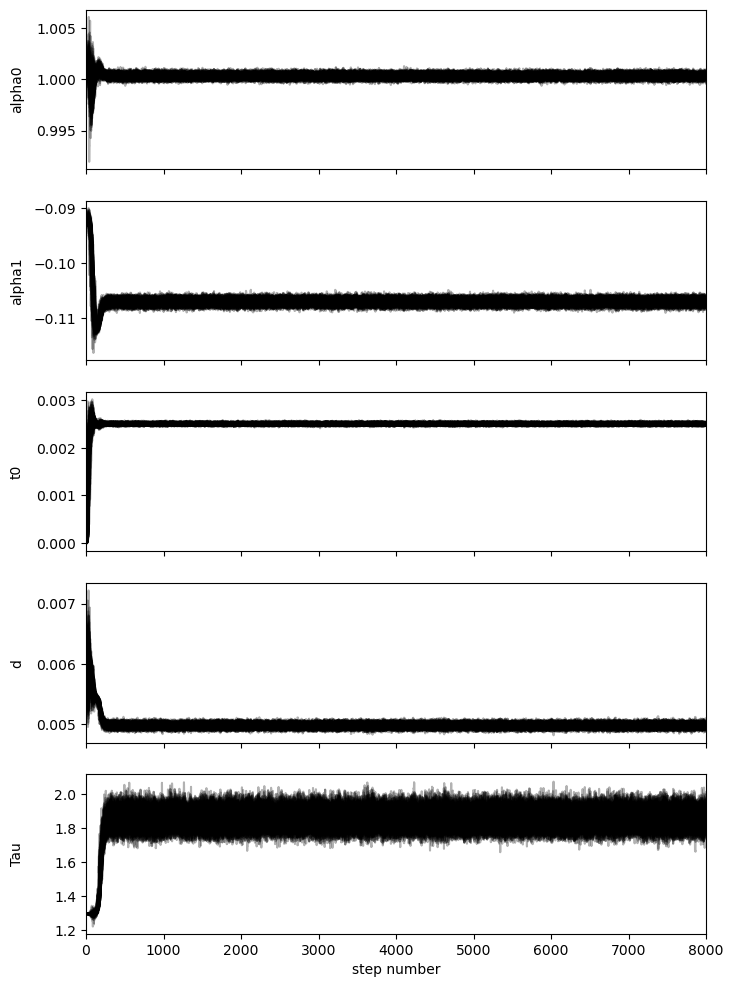

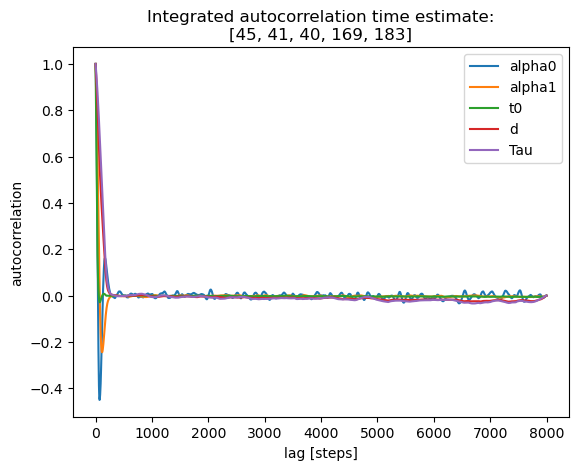

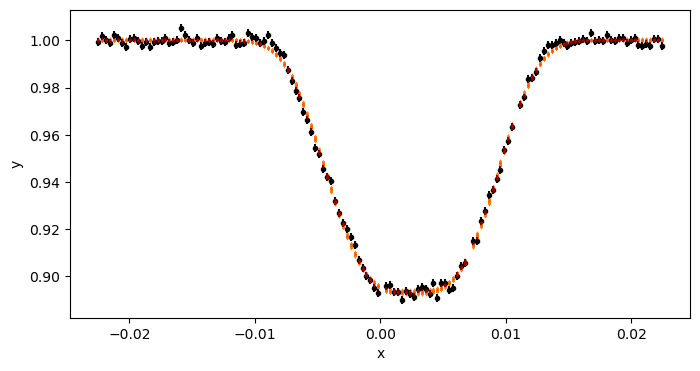

35 2150.915509274999


100%|█████████████████████████████████████████████████████████| 8000/8000 [00:41<00:00, 191.55it/s]


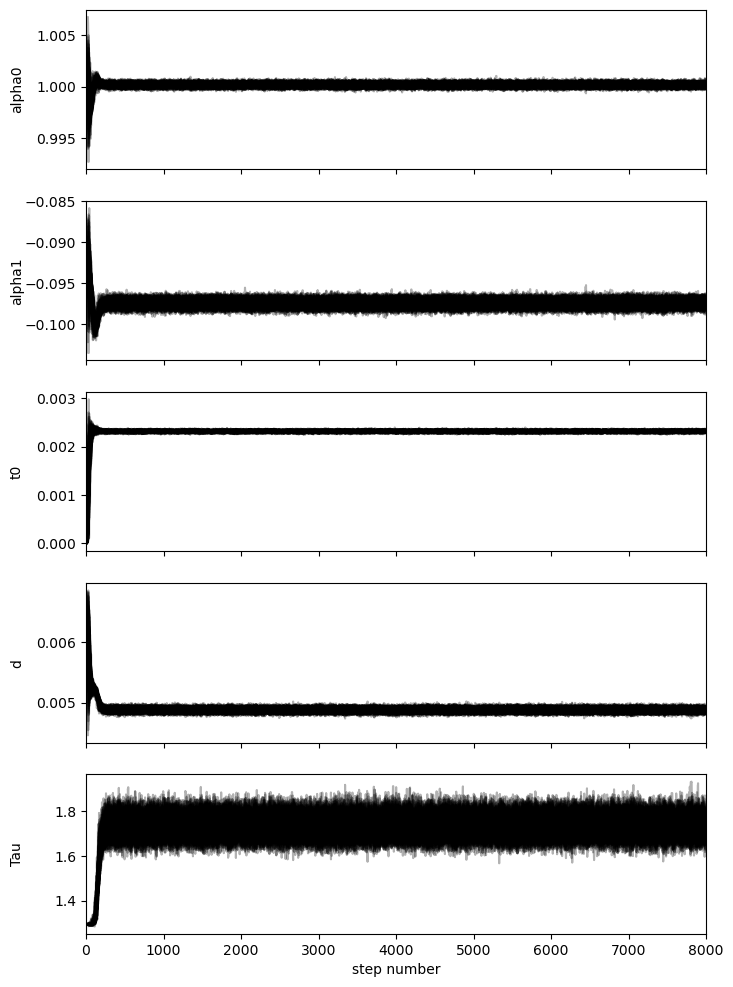

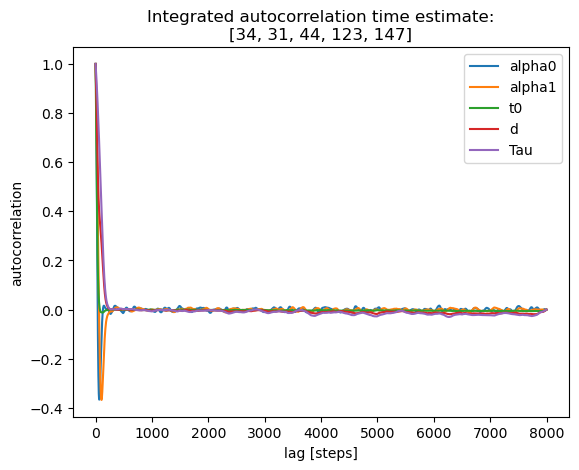

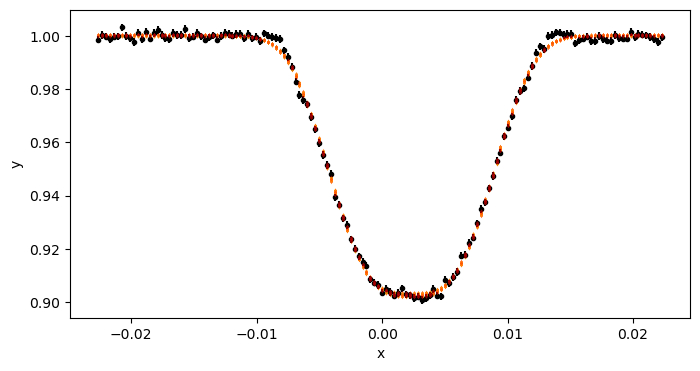

37 2195.126339276874


100%|█████████████████████████████████████████████████████████| 8000/8000 [00:47<00:00, 167.20it/s]


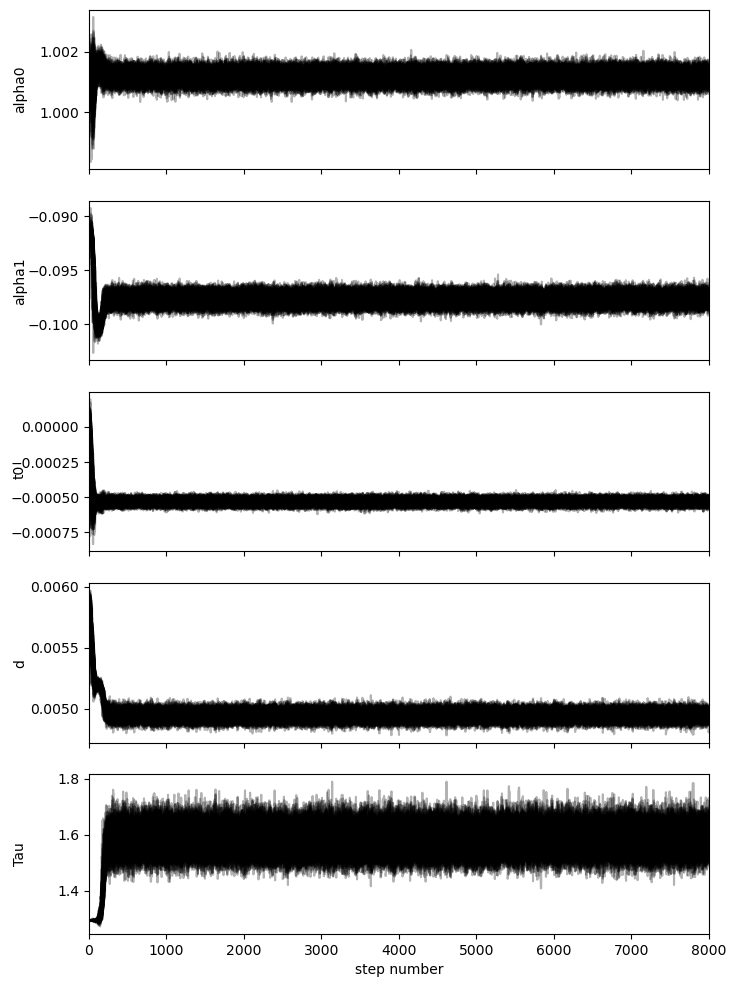

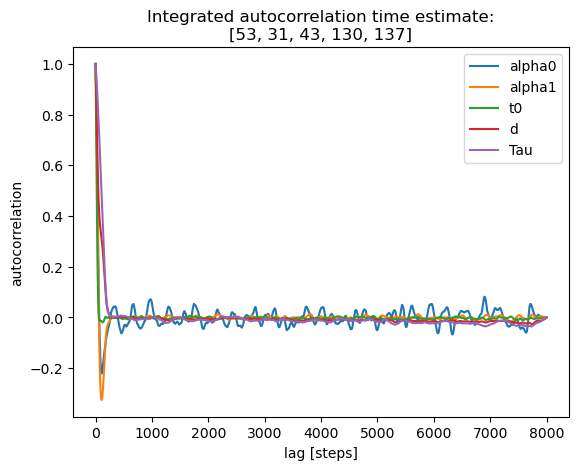

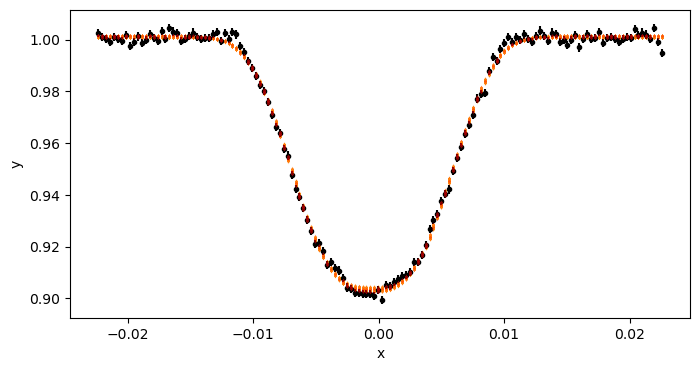

41 2283.554878762258


100%|█████████████████████████████████████████████████████████| 8000/8000 [00:41<00:00, 192.48it/s]


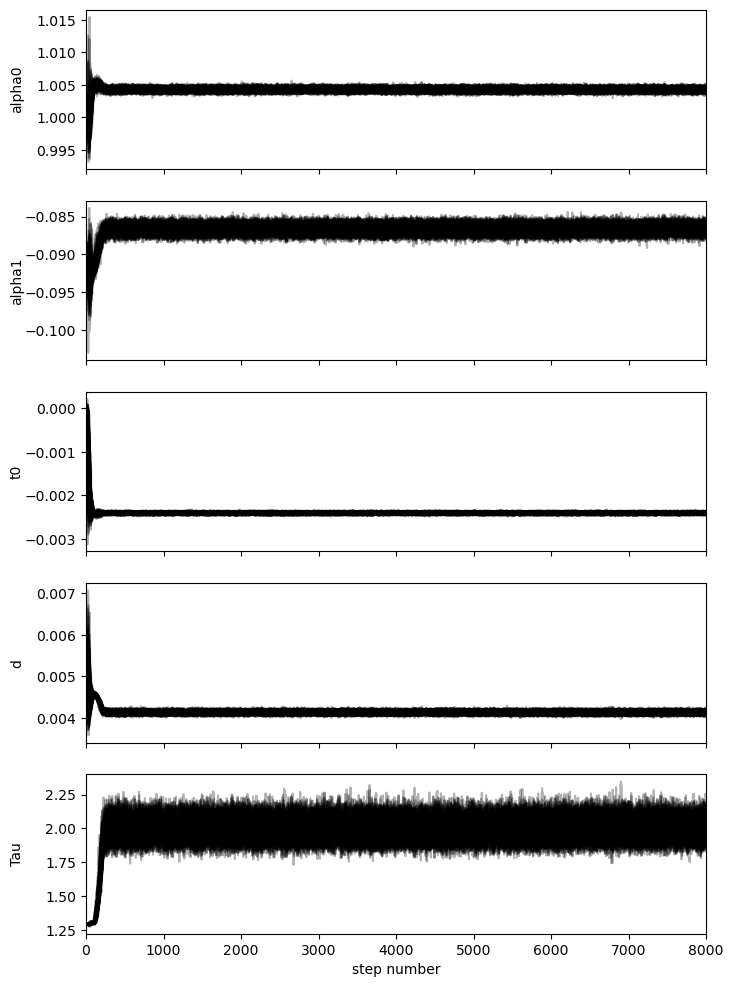

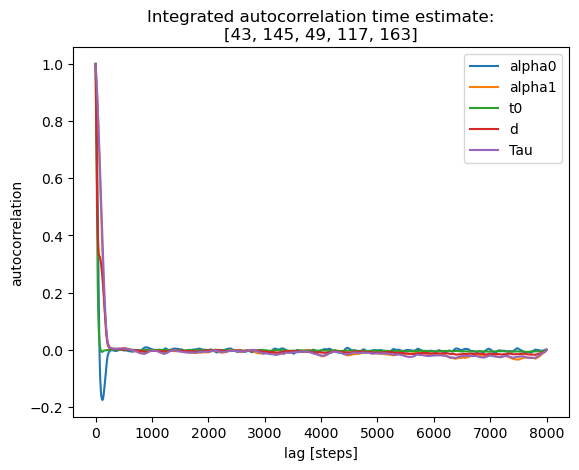

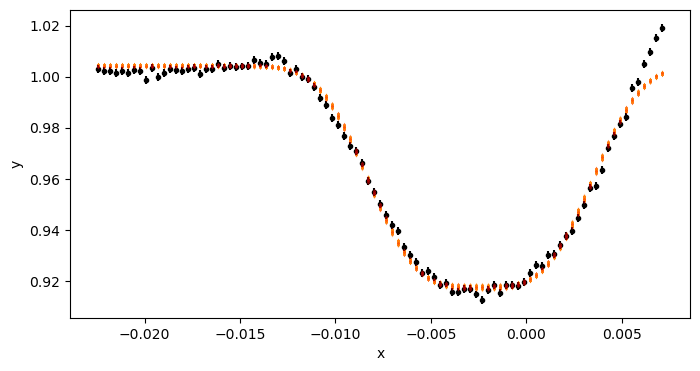

42 2305.4885292265076


100%|█████████████████████████████████████████████████████████| 8000/8000 [00:45<00:00, 176.88it/s]


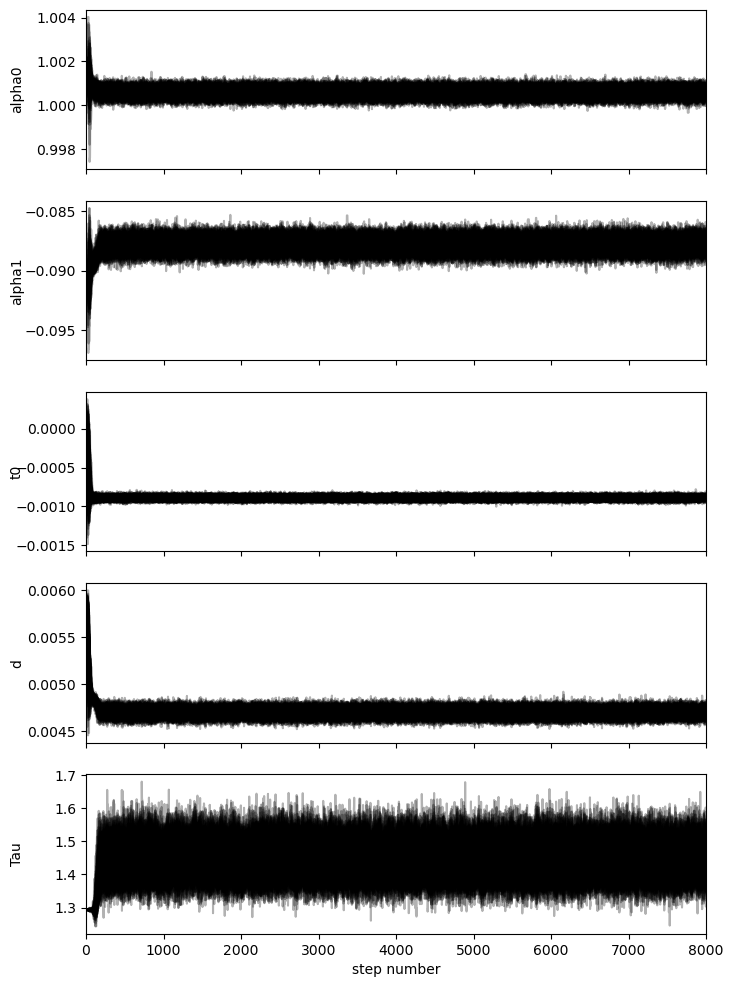

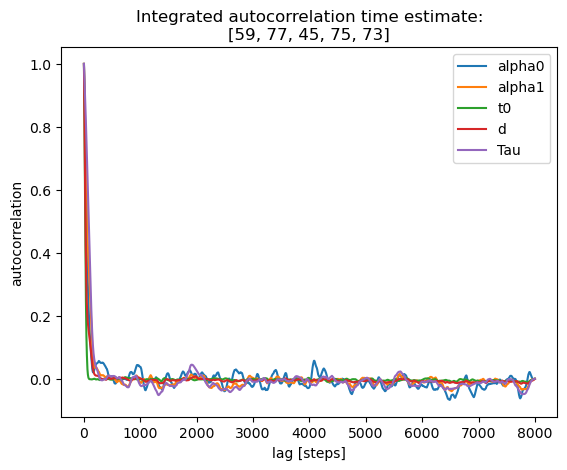

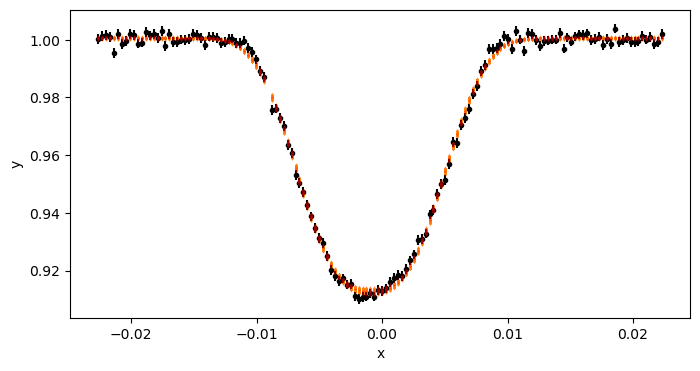

45 2371.9725703518275


 13%|███████▎                                                 | 1021/8000 [00:06<00:43, 159.59it/s]C:\dev\_juypter\PH_TESS_LightCurveViewer\eb_with_diff_sb_period\etv\etv_functions.py:204: RuntimeWarning: overflow encountered in cosh
  cosh_term = np.cosh((x - t0) / d)
100%|█████████████████████████████████████████████████████████| 8000/8000 [00:51<00:00, 154.05it/s]


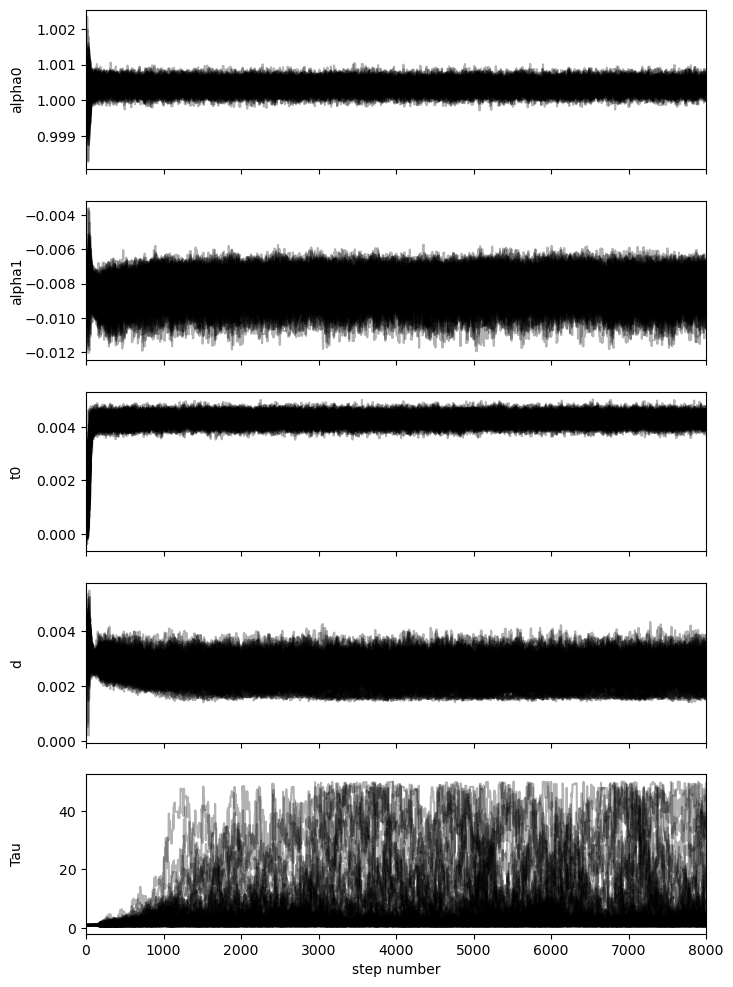

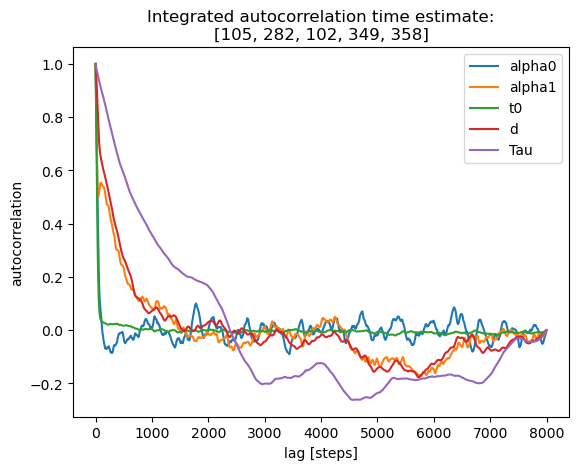

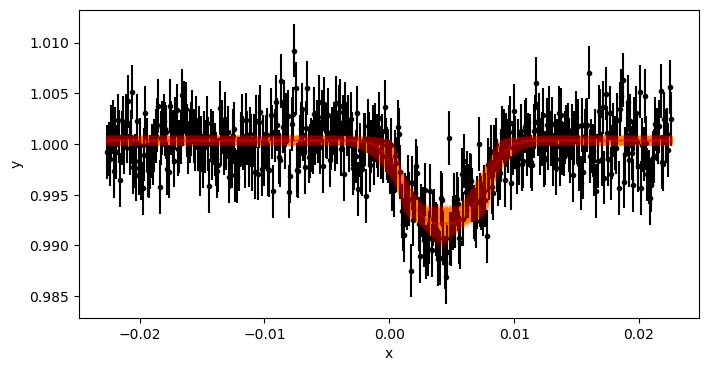

75 3035.142145974221


100%|█████████████████████████████████████████████████████████| 8000/8000 [00:51<00:00, 154.65it/s]


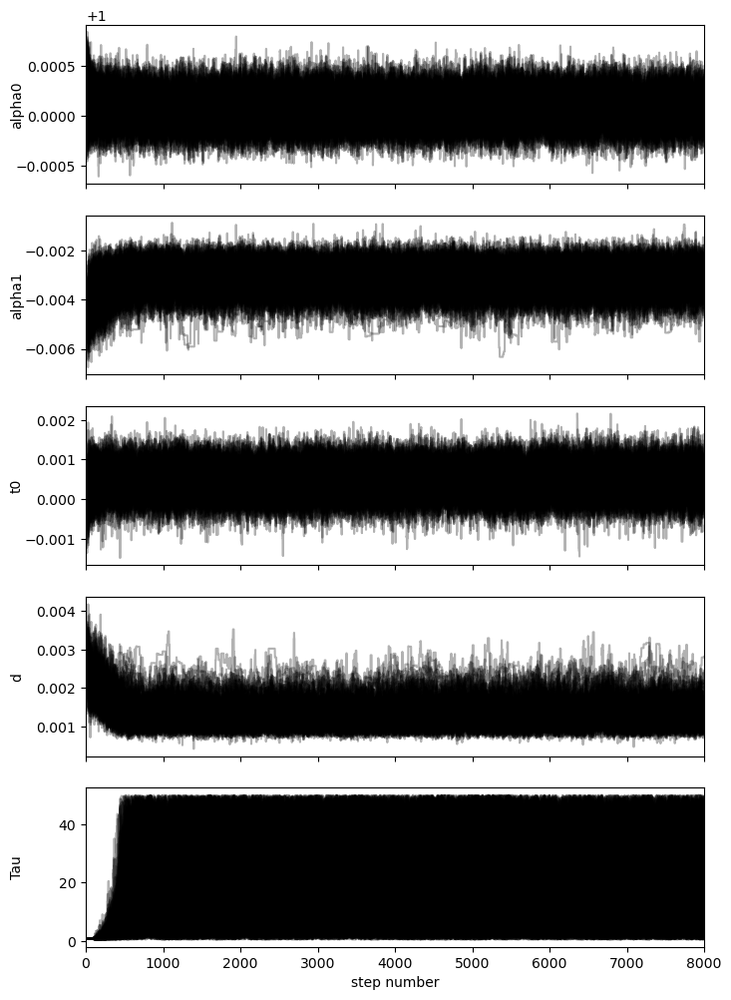

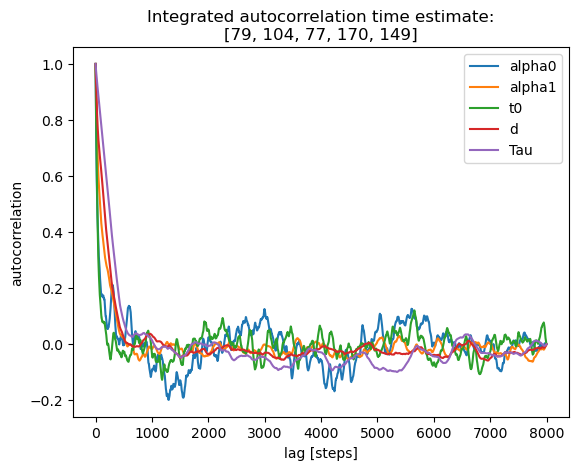

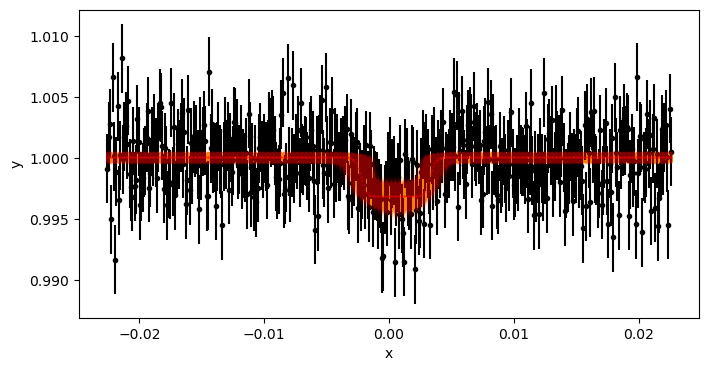

78 3101.4592658698534


100%|█████████████████████████████████████████████████████████| 8000/8000 [00:38<00:00, 210.04it/s]
The chain is shorter than 20 times the integrated autocorrelation time for 1 parameter(s). Use this estimate with caution and run a longer chain!
N/20 = 400;
tau: [303.96827546 435.56625315 315.80737239 340.16778291 352.81667739]


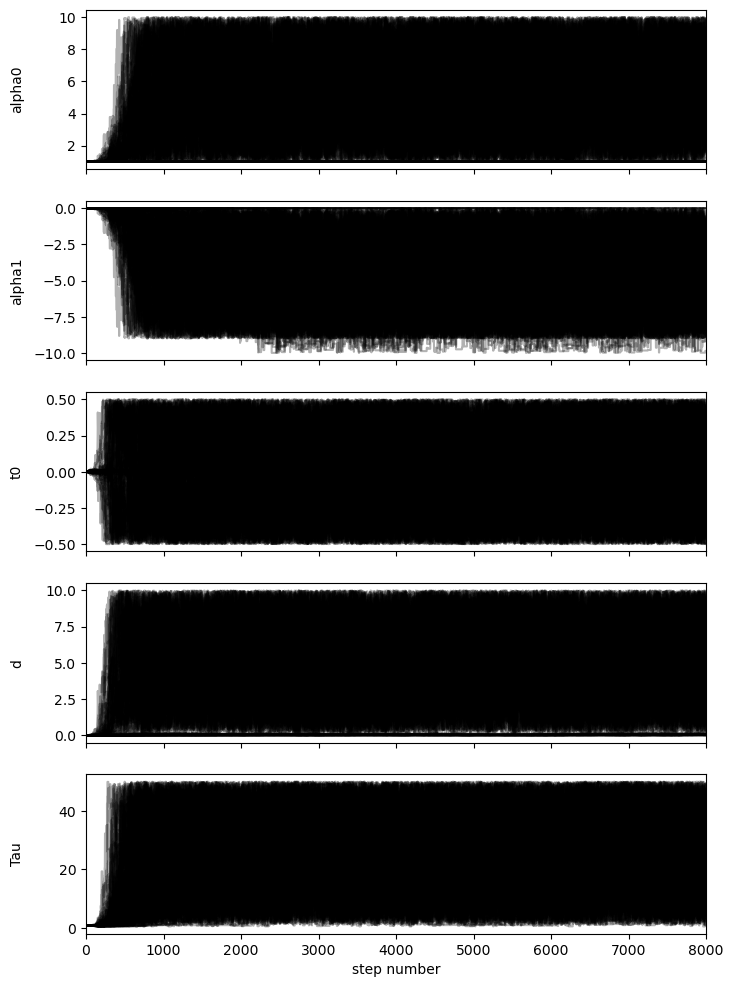

C:\dev\_juypter\PH_TESS_LightCurveViewer\eb_with_diff_sb_period\etv\etv_functions.py:290: RuntimeWarning: overflow encountered in cosh
  cosh_term = np.cosh((x - t0) / d)


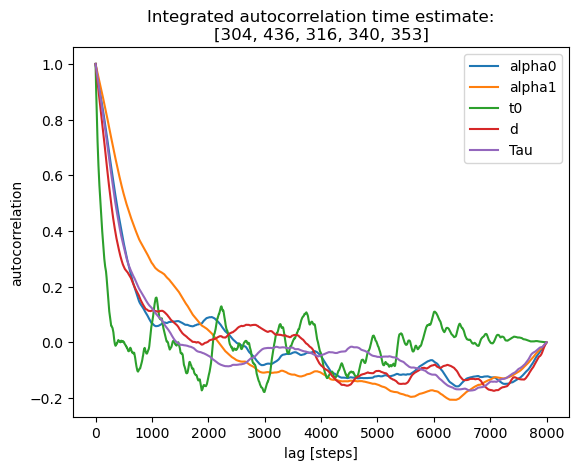

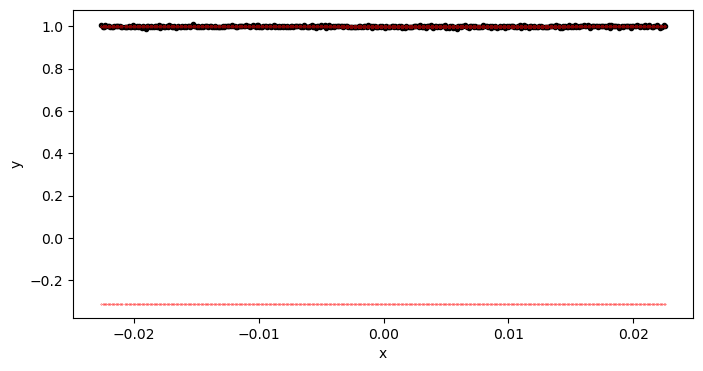

79 3123.564848551504
number,epoch,mean_alpha0,mean_alpha1,t0,stdv_t0,mean_d,mean_Tau
1,1399.3352038869698,1.0005271549219645,-0.10100680780791263,0.0009517511827432089,1.4603116075435626e-05,0.0051474701956012855,2.654293252165459
2,1421.5853392612346,1.0076520562906008,-0.10422827587958838,0.0008991301996436577,1.702388396096168e-05,0.005234741848725891,2.3649756637108204
3,1443.533186487803,1.0004357210616117,-0.10303028841025821,0.0009238233336862005,1.6444421374564873e-05,0.005175925790911567,2.354515000872313
5,1487.755890125215,1.0004882417668093,-0.10023843054693388,-0.000846321959323958,1.7166397850930207e-05,0.005057198402389596,2.4368005781186945
8,1554.0621262826753,1.0003452366242034,-0.09950423264146527,-0.0038627710119052937,1.785046767055163e-05,0.005048276712715738,2.8907134453664702
33,2106.709530023932,1.0006494678178137,-0.10307789114577706,-0.0029665268089067273,2.4131344371129855e-05,0.004958452834941424,1.8863773562421269
34,2128.728322128887,1.0076944419469864,-0

In [171]:

_lc_data_f = lc_data.fold(epoch_time=t0_secondary, period=period_s, normalize_phase=True)

c_etv_out_str_s = "number,epoch,mean_alpha0,mean_alpha1,t0,stdv_t0,mean_d,mean_Tau\n"

for c in np.unique(_lc_data_f.cycle):
    lc_f = _lc_data_f[_lc_data_f.cycle == c]
    lc_f = lc_f.truncate(-window_width_s / 2, window_width_s / 2)
    if len(lc_f) < 1:
        continue
    if len(lc_f) < 8:
        print(f"Skipped cycle {c} due to insuffient data points {len(lc_f)}")
        continue

    # if True:
    #     ax = lc_f.scatter(label=f"C.{c}");  # for diagnostics
    #     continue

    # verbose_cycles = 

    # if c not in verbose_cycles:  # for trying a few cycles
    #     continue

    plot_chains, plot_autocorrelation = True, True
    # if c in verbose_cycles:  # show MCMC details for selected cycles
    #     plot_chains, plot_autocorrelation = True, True  

    # convert lc to the form needed by fit etv_functions
    lc_f_data = SimpleNamespace(time=lc_f.time_original.value, phase=lc_f.time.value, flux=np.array(lc_f.flux.value), err=np.array(lc_f.flux_err.value))

    # nruns, discard = 20, 1
    nruns, discard = 8000, 1000  # 6000 is probably sufficient for convergence with tol=20, make it larger to be safe
     
    start_vals = [mean_alpha0_s, mean_alpha1_s, 0, mean_d_s, mean_Tau_s]  # mean_t0 is not helpful at all
    if c == 75:  # sector 63
        start_vals = [1.0, -0.01, 0, 0.003, 1.0]
    if c in [78, 79]:  # sector 66
        start_vals = [1.0, -0.005, 0, 0.003, 0.9]

    _alpha0, _alpha1, _t0, _d, _Tau, _fit_params_stats = etv_functions.run_mcmc_initial_fit(
        lc_f_data, start_vals, 
        # nruns=40, discard=6, 
        nruns=nruns, discard=discard, 
        autocorr_time_kwargs=dict(tol=20), pool=None, plot_chains=plot_chains,  plot_autocorrelation=plot_autocorrelation, plot=True, also_return_stats=True)
        
    # _alpha0, _alpha1, _t0, _d, _Tau, _fit_params_stats = etv_functions.run_mcmc_initial_fit(
    #     lc_f_data, start_vals, 
    #     # nruns=40, discard=6, 
    #     nruns=3000, discard=1000, 
    #     autocorr_time_kwargs=dict(tol=20), pool=-2, plot_chains=plot_chains,  plot_autocorrelation=plot_autocorrelation, plot=True, also_return_stats=True)

    _stdv_t0 = _fit_params_stats["std_t0"]
    _t = np.mean(lc_f.time_original.value)  # approximate transit time 
    print(c, _t)
    
    c_etv_out_str_s += ",".join([str(s) for s in [c, _t, _alpha0, _alpha1, _t0, _stdv_t0, _d, _Tau]])
    c_etv_out_str_s += "\n"
    
print(c_etv_out_str_s)

In [ ]:
# # save the result in a cell for safekeeping
# c_etv_out_str_s = """
# number,epoch,mean_alpha0,mean_alpha1,t0,stdv_t0,mean_d,mean_Tau
# 1,1399.3352038869698,1.0005271549219645,-0.10100680780791263,0.0009517511827432089,1.4603116075435626e-05,0.0051474701956012855,2.654293252165459
# 2,1421.5853392612346,1.0076520562906008,-0.10422827587958838,0.0008991301996436577,1.702388396096168e-05,0.005234741848725891,2.3649756637108204
# 3,1443.533186487803,1.0004357210616117,-0.10303028841025821,0.0009238233336862005,1.6444421374564873e-05,0.005175925790911567,2.354515000872313
# 5,1487.755890125215,1.0004882417668093,-0.10023843054693388,-0.000846321959323958,1.7166397850930207e-05,0.005057198402389596,2.4368005781186945
# 8,1554.0621262826753,1.0003452366242034,-0.09950423264146527,-0.0038627710119052937,1.785046767055163e-05,0.005048276712715738,2.8907134453664702
# 33,2106.709530023932,1.0006494678178137,-0.10307789114577706,-0.0029665268089067273,2.4131344371129855e-05,0.004958452834941424,1.8863773562421269
# 34,2128.728322128887,1.0076944419469864,-0.053281012701857554,0.0008559774857726675,2.461488031659786e-05,0.0034845177752979174,2.9991222252059497
# 35,2150.915509274999,1.0003251090174086,-0.10704566933196044,0.002503512622438189,1.8565451188968605e-05,0.004979425562658443,1.8569932548663568
# 37,2195.126339276874,1.000167470484816,-0.0974375256224544,0.0023143789736365054,1.663200918627272e-05,0.004878398380122786,1.7341232963385935
# 41,2283.554878762258,1.0011819026216386,-0.09766302001114874,-0.0005336481262846046,1.8750426580415443e-05,0.0049438537160451,1.5817762531978825
# 42,2305.4885292265076,1.0042885782540345,-0.08662644284746465,-0.0024052295331030956,1.88153426750087e-05,0.004130816658700284,1.9984010619610153
# 45,2371.9725703518275,1.000581214004927,-0.08781362254746339,-0.0008897991777927453,2.2520555117291857e-05,0.004693214475674111,1.447569059954629
# 75,3035.142145974221,1.000382069144508,-0.008203708072322,0.0042946685263737586,0.00018578875653911916,0.002568290283334425,1.4952358259757497
# 78,3101.4592658698534,1.000076064726224,-0.0031658357536382166,0.00048469906834029447,0.0003567973771698695,0.0013103504024712764,15.32744362215842
# 79,3123.564848551504,3.7149798233710083,-4.025393506973982,0.00441982693864157,0.2928486773414906,3.142547557409763,26.04929836729869
# """

## ETV O-C plot (Per-sector)

In [ ]:
%matplotlib inline
# %matplotlib widget


title_suffix = "eclipse timing variation"

#plot the extracted transit times to check for ETVs

num_rows = 2 if t0_secondary is not None else 1
figsize_y = 3.3 if num_rows == 1 else num_rows * 3.5
# num_rows = 1  # force to plot primary only
# figsize_y = 3.3

fig, axs = plt.subplots(num_rows, 1, figsize=(10, figsize_y), sharex=True)
if isinstance(axs, plt.Axes):  # handle edge case that num_rows == 1, returned axs is not a list
    axs = [axs]

# in_df_primary = pd.read_csv(outfile_path)
from io import StringIO
in_df_primary = pd.read_csv(StringIO(etv_out_str))
in_df_primary['midpoint'] = in_df_primary['epoch'] + (in_df_primary['t0']*period)
in_df_primary['shift_mins'] = in_df_primary['t0']*period*24*60
in_df_primary['std_mins'] = in_df_primary['stdv_t0']*period*24*60
in_df_primary_all = in_df_primary  # in case filtering is helpful

# in_df_primary = in_df_primary[in_df_primary.std_mins < 10]  # filter out outliers in error
# print(f"Note: {len(in_df_primary_all) - len(in_df_primary)} data points in df_primary filtered out due to huge O-C error.")

# axs[0].plot(in_df_primary['epoch'], in_df_primary['shift_mins'],
#              lw = 1, color = 'crimson', )
# axs[0].scatter(in_df_primary['epoch'], in_df_primary['shift_mins'],
#              marker = 'o', s=8**2, color = 'None', edgecolor = 'crimson', label="primary")
axs[0].errorbar(in_df_primary['epoch'], in_df_primary['shift_mins'], yerr = in_df_primary['std_mins'],
             lw = 0, marker = 'o', elinewidth = 1, markersize = 8, color = 'None', ecolor='crimson', markeredgecolor = 'crimson', label="primary")

# if False:
if t0_secondary is not None:
    # in_df_secondary = pd.read_csv(outfile_path_s)
    in_df_secondary = pd.read_csv(StringIO(etv_out_str_s))
    in_df_secondary['midpoint'] = in_df_secondary['epoch'] + (in_df_secondary['t0']*period_s)
    in_df_secondary['shift_mins'] = in_df_secondary['t0']*period_s*24*60
    in_df_secondary['std_mins'] = in_df_secondary['stdv_t0']*period_s*24*60
    in_df_secondary_all = in_df_secondary  # in case filtering is helpful

    # in_df_secondary = in_df_secondary[in_df_secondary.std_mins < 10]  # filter out outliers in error
    # print(f"Note: {len(in_df_secondary_all) - len(in_df_secondary)} data points in in_df_secondary filtered out due to huge O-C error.")

    # axs[1].plot(in_df_secondary['epoch'], in_df_secondary['shift_mins'],
    #              lw = 1, color = 'navy', )
    # axs[1].scatter(in_df_secondary['epoch'], in_df_secondary['shift_mins'],
    #              marker = 'x',  s=9**2, color = 'navy', zorder = -2, label="secondary" );
    axs[1].errorbar(in_df_secondary['epoch'], in_df_secondary['shift_mins'], yerr = in_df_secondary['std_mins'],
                 lw = 0, marker = 'x', elinewidth = 1, markersize = 9, color = 'navy', zorder = -2, label="secondary" );
else:
    in_df_secondary = None

for ax in axs:
    ax.set_ylabel("O - C (minutes)")
    ax.legend();

axs[-1].set_xlabel(f"Time ({search_result.time.format.upper()})")
axs[0].set_title(f"TIC {ticid}, {title_suffix}\nP: {period} d", fontsize=14)
axs[1].set_title(f"P: {period_s} d\n(different from primary)", fontsize=14)

plt.subplots_adjust(hspace=0.35)
# plt.ylim(-3, 8)
plt.show()

## ETV O-C plot (Per-cycle)

Note: 2 data points in df_primary filtered out due to large errors.
Note: 2 data points in in_df_secondary filtered out due to lager errors.


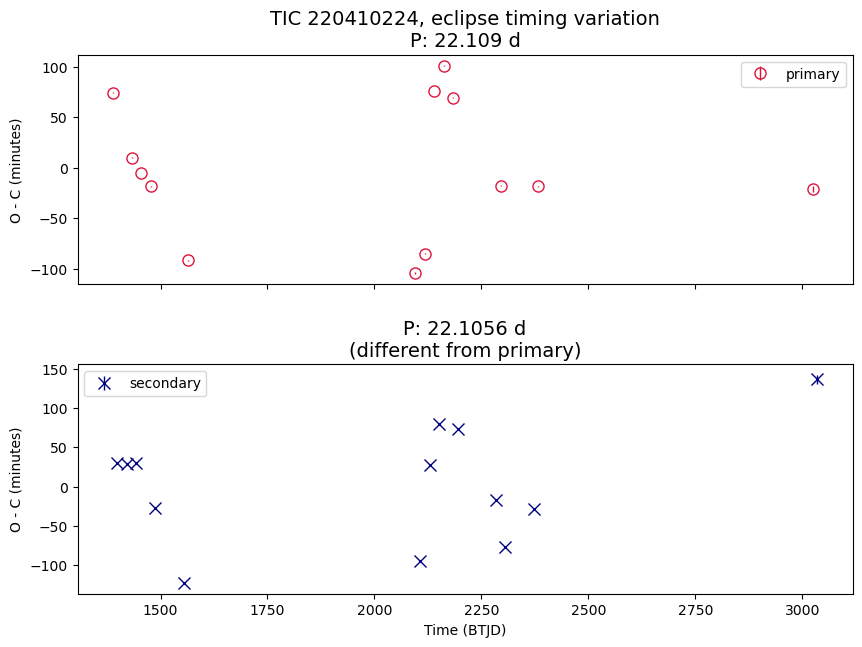

In [172]:
%matplotlib inline
# %matplotlib widget


title_suffix = "eclipse timing variation"

#plot the extracted transit times to check for ETVs

num_rows = 2 if t0_secondary is not None else 1
figsize_y = 3.3 if num_rows == 1 else num_rows * 3.5
# num_rows = 1  # force to plot primary only
# figsize_y = 3.3

fig, axs = plt.subplots(num_rows, 1, figsize=(10, figsize_y), sharex=True)
if isinstance(axs, plt.Axes):  # handle edge case that num_rows == 1, returned axs is not a list
    axs = [axs]

# in_df_primary = pd.read_csv(outfile_path)
from io import StringIO
in_df_primary = pd.read_csv(StringIO(c_etv_out_str))
in_df_primary['midpoint'] = in_df_primary['epoch'] + (in_df_primary['t0']*period)
in_df_primary['shift_mins'] = in_df_primary['t0']*period*24*60
in_df_primary['std_mins'] = in_df_primary['stdv_t0']*period*24*60
in_df_primary_all = in_df_primary  # in case filtering is helpful

in_df_primary = in_df_primary[in_df_primary.std_mins < 10]  # filter out outliers 
print(f"Note: {len(in_df_primary_all) - len(in_df_primary)} data points in df_primary filtered out due to large errors.")

# axs[0].plot(in_df_primary['epoch'], in_df_primary['shift_mins'],
#              lw = 1, color = 'crimson', )
# axs[0].scatter(in_df_primary['epoch'], in_df_primary['shift_mins'],
#              marker = 'o', s=8**2, color = 'None', edgecolor = 'crimson', label="primary")
axs[0].errorbar(in_df_primary['epoch'], in_df_primary['shift_mins'], yerr = in_df_primary['std_mins'],
             lw = 0, marker = 'o', elinewidth = 1, markersize = 8, color = 'None', ecolor='crimson', markeredgecolor = 'crimson', label="primary")

if t0_secondary is not None:
    # in_df_secondary = pd.read_csv(outfile_path_s)
    in_df_secondary = pd.read_csv(StringIO(c_etv_out_str_s))
    in_df_secondary['midpoint'] = in_df_secondary['epoch'] + (in_df_secondary['t0']*period_s)
    in_df_secondary['shift_mins'] = in_df_secondary['t0']*period_s*24*60
    in_df_secondary['std_mins'] = in_df_secondary['stdv_t0']*period_s*24*60
    in_df_secondary_all = in_df_secondary  # in case filtering is helpful

    in_df_secondary = in_df_secondary[in_df_secondary.std_mins < 10]  # filter out outliers in 
    print(f"Note: {len(in_df_secondary_all) - len(in_df_secondary)} data points in in_df_secondary filtered out due to lager errors.")

    # axs[1].plot(in_df_secondary['epoch'], in_df_secondary['shift_mins'],
    #              lw = 1, color = 'navy', )
    # axs[1].scatter(in_df_secondary['epoch'], in_df_secondary['shift_mins'],
    #              marker = 'x',  s=9**2, color = 'navy', zorder = -2, label="secondary" );
    axs[1].errorbar(in_df_secondary['epoch'], in_df_secondary['shift_mins'], yerr = in_df_secondary['std_mins'],
                 lw = 0, marker = 'x', elinewidth = 1, markersize = 9, color = 'navy', zorder = -2, label="secondary" );
else:
    in_df_secondary = None

for ax in axs:
    ax.set_ylabel("O - C (minutes)")
    ax.legend();

axs[-1].set_xlabel(f"Time ({search_result.time.format.upper()})")
axs[0].set_title(f"TIC {ticid}, {title_suffix}\nP: {period} d", fontsize=14)
axs[1].set_title(f"P: {period_s} d\n(different from primary)", fontsize=14)

plt.subplots_adjust(hspace=0.35)
# plt.ylim(-3, 8)
plt.show()

### O-C Plot, Zoom In (per cycle)

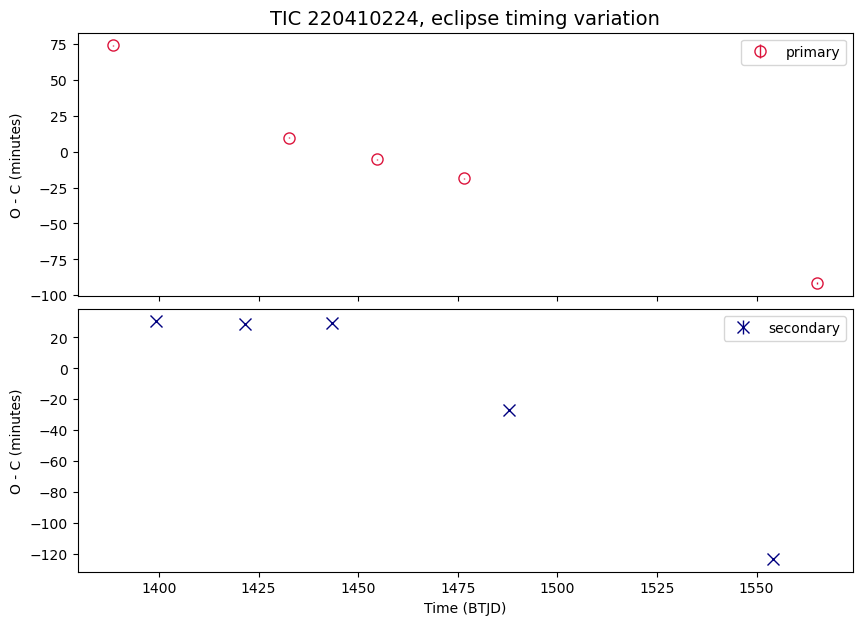

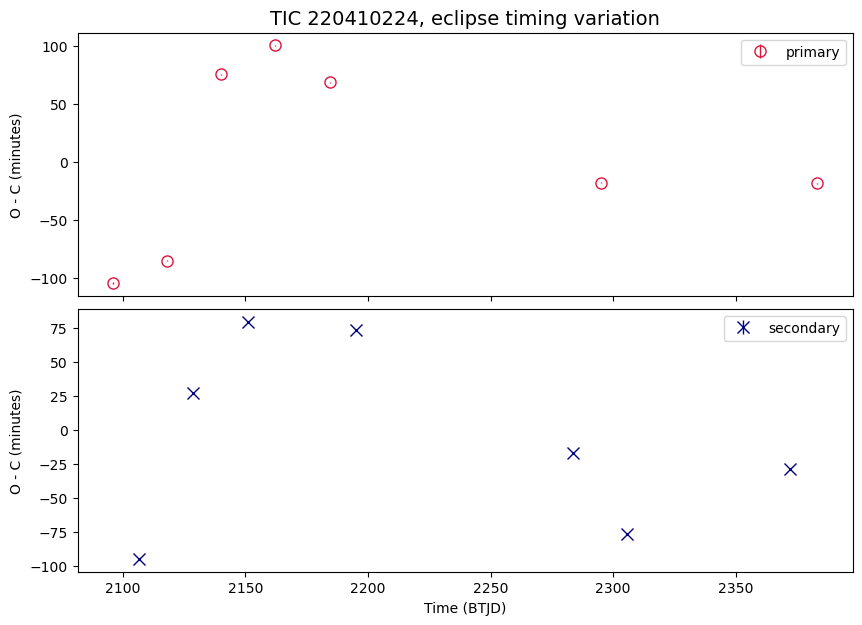

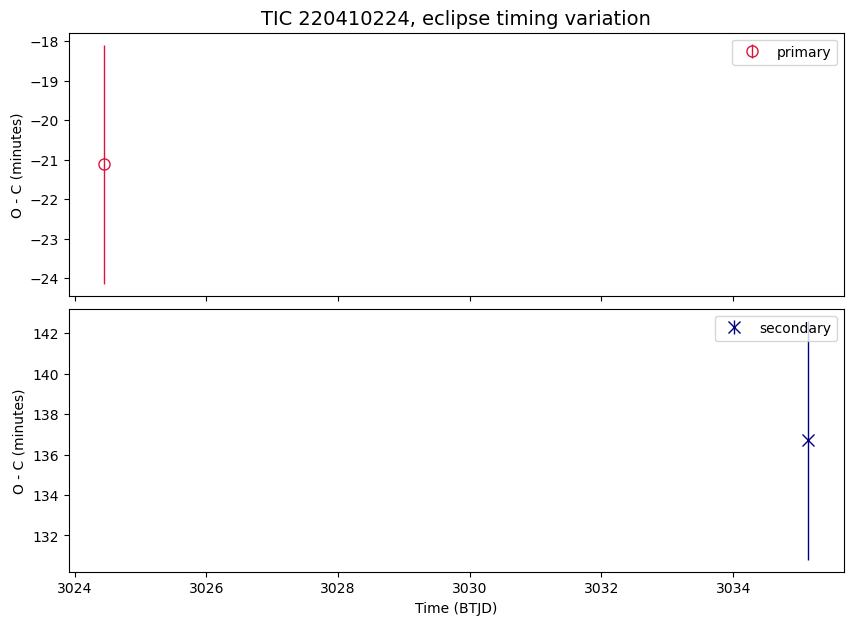

In [173]:
%matplotlib inline
# %matplotlib widget

zoom_ranges = [
    (1300, 1700),
    (2000, 2500),
    (3000, 3200),
]

def tweak_axs_list(axs_list):
    # axs_list[0][1].set_ylim(-20, 30);
    # axs_list[1][0].set_ylim(None, 0.5);
    # axs_list[1][1].set_ylim(-5.5, 2);

    # ax = axs_list[0][0]
    # ax.set_title(f"{ax.get_title()} (2min cadence)")
    # ax = axs_list[1][0]
    # ax.set_title(f"{ax.get_title()} (2min cadence)")

    pass


def plot_oc_in_zoom_ranges(in_df_primary, in_df_secondary, zoom_ranges):
    axs_list = []
    for zoom_start, zoom_end in zoom_ranges:
        num_rows = 2 if t0_secondary is not None else 1
        figsize_y = 3.3 if num_rows == 1 else num_rows * 3.5

        fig, axs = plt.subplots(num_rows, 1, figsize=(10, figsize_y), sharex=True)
        if isinstance(axs, plt.Axes):  # handle edge case that num_rows == 1, returned axs is not a list
            axs = [axs]

        df_zoom = in_df_primary[(in_df_primary['epoch'] > zoom_start) & (in_df_primary['epoch'] < zoom_end)]

        # axs[0].scatter(df_zoom['epoch'], df_zoom['shift_mins'],
        #                marker = 'o', s=8**2, color = 'None', edgecolor = 'crimson', label="primary")
        axs[0].errorbar(df_zoom['epoch'], df_zoom['shift_mins'], yerr = df_zoom['std_mins'],
                        lw = 0, marker = 'o', elinewidth = 1, markersize = 8, color = 'None', ecolor='crimson', markeredgecolor = 'crimson', label="primary")

        if in_df_secondary is not None:
            df_zoom = in_df_secondary[(in_df_secondary['epoch'] > zoom_start) & (in_df_secondary['epoch'] < zoom_end)]

            # axs[1].scatter(df_zoom['epoch'], df_zoom['shift_mins'],
            #                marker = 'x',  s=9**2, color = 'navy', zorder = -2, label="secondary" );
            axs[1].errorbar(df_zoom['epoch'], df_zoom['shift_mins'], yerr = df_zoom['std_mins'],
                            lw = 0, marker = 'x', elinewidth = 1, markersize = 9, color = 'navy', zorder = -2, label="secondary" );

        for ax in axs:
            ax.set_ylabel("O - C (minutes)")
            ax.legend();

        axs[-1].set_xlabel("Time (BTJD)")
        axs[0].set_title(f"TIC {ticid}, {title_suffix}", fontsize=14)

        plt.subplots_adjust(hspace=0.05)
        axs_list.append(axs)
    return axs_list


axs_list = plot_oc_in_zoom_ranges(in_df_primary, in_df_secondary, zoom_ranges)
tweak_axs_list(axs_list);

## make a periodogram 

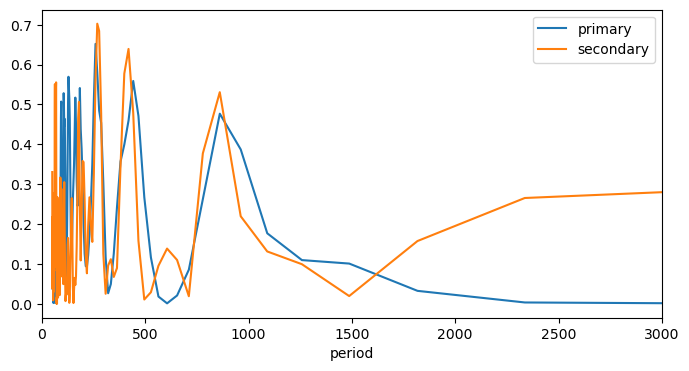

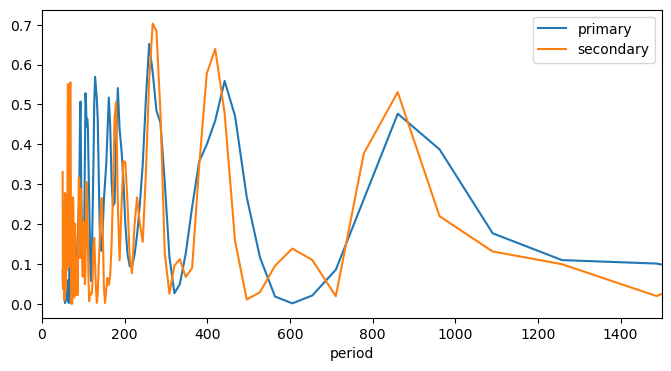

In [174]:
frequency, power = LombScargle(in_df_primary['epoch'], in_df_primary['shift_mins']).autopower()

fig, ax = plt.subplots(figsize=(8, 4))

plt.plot(1/frequency, power, label = 'primary')

if t0_secondary is not None:
    frequency_s, power_s = LombScargle(in_df_secondary['epoch'], in_df_secondary['shift_mins']).autopower()
    plt.plot(1/frequency_s, power_s, label = 'secondary')

plt.xlabel("period")

plt.legend()
plt.xlim(0, 3000)
plt.show()


if True:
    fig, ax = plt.subplots(figsize=(8, 4))

    plt.plot(1/frequency, power, label = 'primary')

    if t0_secondary is not None:
        plt.plot(1/frequency_s, power_s, label = 'secondary')

    plt.xlabel("period")

    plt.legend()
    plt.xlim(0, 1500)
    plt.show()

## O-C plot, folded

- for periodic trend in O-C

In [71]:
def truncate_freq_power_to_period_range(freq, power, period_min, period_max):
    f, p = freq, power
    if period_min is not None:
        f, p = f[f < 1 / period_min], p[f < 1 / period_min]
    if period_max is not None:
        f, p = f[f > 1 / period_max], p[f >  1 / period_max]
    return f, p


def plot_oc_folded(period_min=None, period_max=None, period_min_s=None, period_max_s=None, period=None, period_s=None):

    if period is None:
        _f, _p = truncate_freq_power_to_period_range(frequency, power, period_min, period_max)
        period = 1 / _f[np.argmax(_p)]
    phase_oc = etv_functions.phase_data(in_df_primary.epoch, 0, period)

    fig, axs = plt.subplots(num_rows, 1, figsize=(10, figsize_y * 1.1), sharex=False)
    if isinstance(axs, plt.Axes):  # handle edge case that num_rows == 1, returned axs is not a list
        axs = [axs]
    
    axs[0].scatter(phase_oc, in_df_primary.shift_mins, marker = 'o', s=12**2, c=in_df_primary.epoch);
    axs[0].errorbar(phase_oc, in_df_primary['shift_mins'], yerr = in_df_primary['std_mins'],
                    lw = 0, marker = 'o', elinewidth = 1, markersize = 8, color = 'None', ecolor='crimson', markeredgecolor = 'None', label="primary")
    axs[0].set_title(f"TIC {ticid}, {title_suffix}\nfolded with P={period:.4f} d", fontsize=14)

    if in_df_secondary is not None:
        if period_s is None:
            _f, _p = truncate_freq_power_to_period_range(frequency_s, power_s, period_min_s, period_max_s)
            period_s= 1 / _f[np.argmax(_p)]
        phase_oc_s = etv_functions.phase_data(in_df_secondary.epoch, 0, period_s)
        axs[1].scatter(phase_oc_s, in_df_secondary.shift_mins, marker = 'o',  s=12**2, c=in_df_secondary.epoch);
        axs[1].errorbar(phase_oc_s, in_df_secondary['shift_mins'], yerr = in_df_secondary['std_mins'],
                        lw = 0, marker = 'o', elinewidth = 1, markersize = 8, color='None', ecolor='navy', markeredgecolor = 'None', label="secondary" );
        axs[1].set_title(f"TIC {ticid}, {title_suffix}\nfolded with P={period_s:.4f} d", fontsize=14)

    for ax in axs:
        ax.set_ylabel("O - C (minutes)")
        ax.set_xlabel("Phase (Normalized)")
        ax.legend();
    plt.subplots_adjust(hspace=0.4)
    return axs

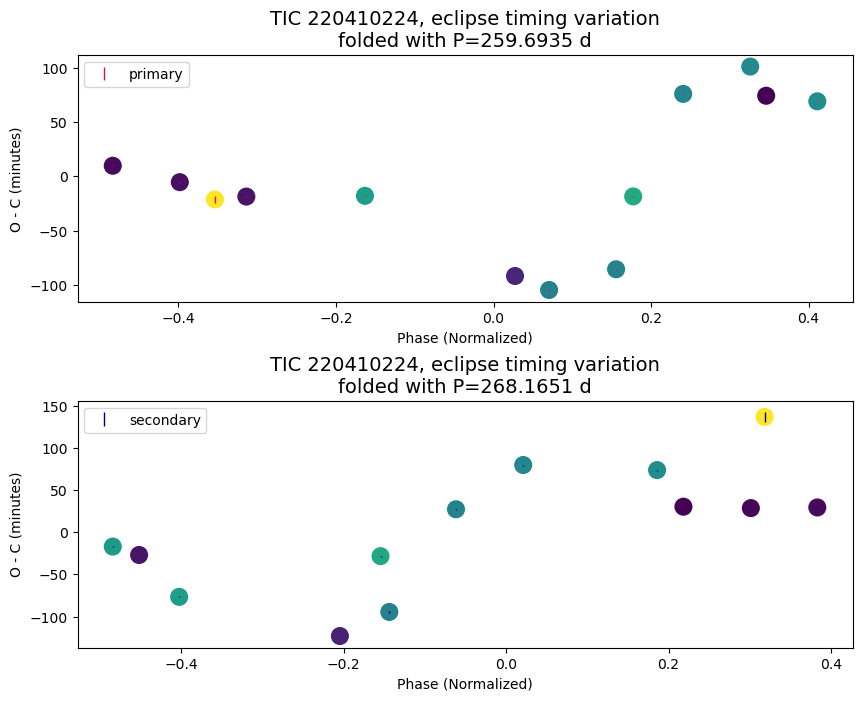

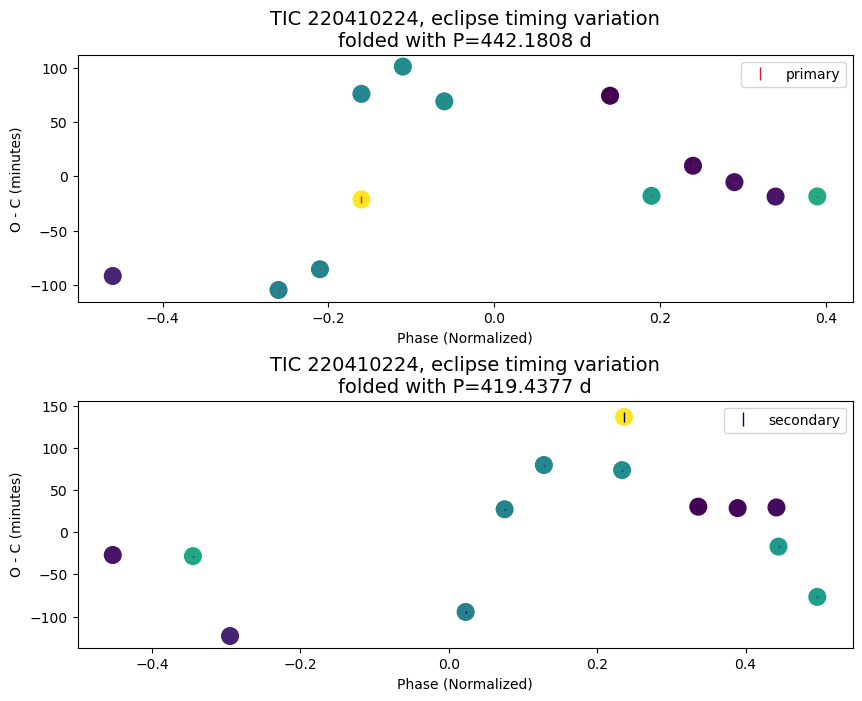

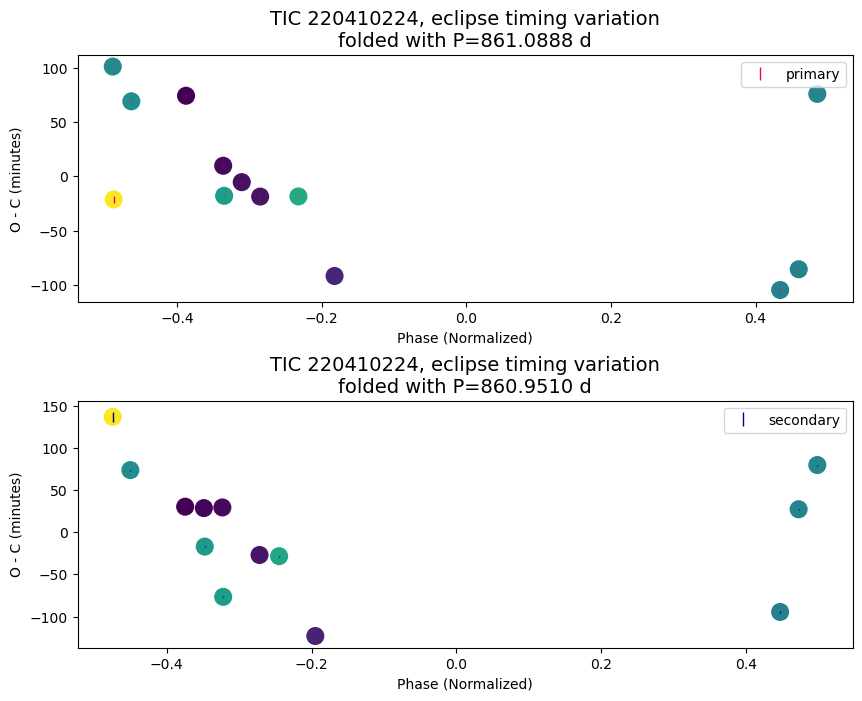

In [175]:
%matplotlib inline
# %matplotlib widget

if True:  # plot O-C periodic trend by folding with a period (from LS Periodogram by default)
    def tweak_axs(axs):
        pass

    axs = plot_oc_folded(
        period_min=None, period_max=None,
        period_min_s=None, period_max_s=None
    )

    axs = plot_oc_folded(
        period_min=300, period_max=None,
        period_min_s=300, period_max_s=None
    )

    axs = plot_oc_folded(
        period_min=600, period_max=None,
        period_min_s=600, period_max_s=None
    )
    # tweak_axs(axs)

## Results Summary

In [177]:
# FILL-IN the ETV results / comments
has_etv = "Y"
comments = "O-C suggests strong non-linear variation (correlated) with an amplitude of 200+ min, possibly with an ETV period in the range of 200 - 900 days."

# Eclipse depth from the model
depth_pct_p = round(-mean_alpha1 * 100, 2)
if t0_secondary is not None:
    depth_pct_s = round(-mean_alpha1_s * 100, 2)
else:
    depth_pct_s = None

summary = {
    "tic": ticid,
    "has_etv": has_etv,
    "comments": comments,
    "period": period,  # the period used in ETV analysis
    "depth_pct_p": depth_pct_p,
    "depth_pct_s": depth_pct_s,
    "epoch_p": t0_primary,
    "epoch_s": t0_secondary,
    "num_sectors": len(sr),
    "time_span": round(time[-1] - time[0], 2),
    "time_start": round(time[0], 2),
    "time_end": round(time[-1], 2),
}

summary = pd.DataFrame.from_dict(summary, orient="index")
with pd.option_context('display.max_colwidth', None, 'display.max_rows', 999, 'display.max_columns', 99):
    display(summary);

# Single line to be added to a CSV
print("")
print(summary.transpose().to_csv(
    index=False,
    header=True,
))

,0
tic,220410224
has_etv,Y
comments,"O-C suggests strong non-linear variation (correlated) with an amplitude of 200+ min, possibly with an ETV period in the range of 200 - 900 days."
period,22.109
depth_pct_p,11.78
depth_pct_s,9.18
epoch_p,1388.38
epoch_s,1399.328
num_sectors,15
time_span,1742.5



tic,has_etv,comments,period,depth_pct_p,depth_pct_s,epoch_p,epoch_s,num_sectors,time_span,time_start,time_end
220410224,Y,"O-C suggests strong non-linear variation (correlated) with an amplitude of 200+ min, possibly with an ETV period in the range of 200 - 900 days.",22.109,11.78,9.18,1388.38,1399.328,15,1742.5,1381.72,3124.22



# Eclipse Depth Variation in `ASAS-SN` data

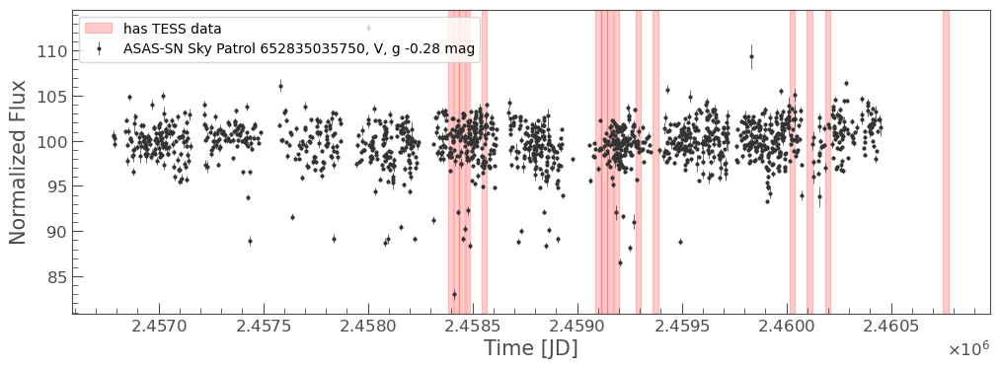

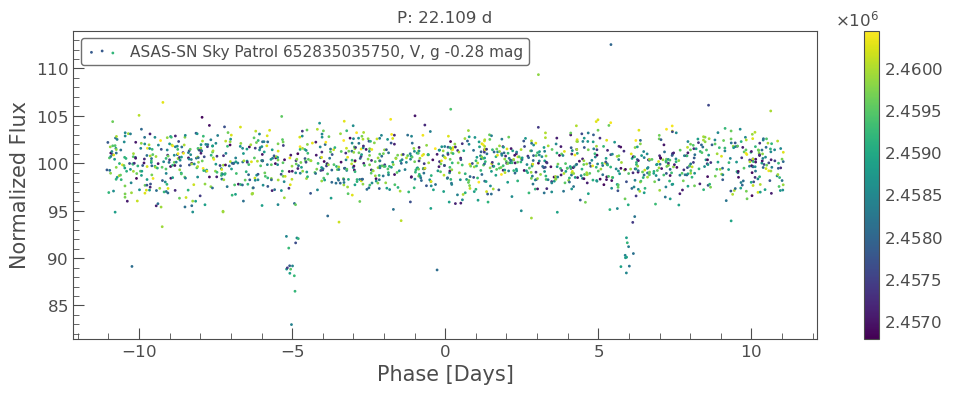

In [182]:
import tpf_webapp.lc_utils
import tic_plot as tplt

def mark_time_range(ax, lc, **kwargs): 
    jd_start = lc.time[0].to_value("jd")
    jd_end = lc.time[-1].to_value("jd")
    ax.axvspan(jd_start, jd_end, color="red", alpha=0.2, **kwargs)
    
# ASAS-SN SkyPatrol v2 data at the position
_lc = tpf_webapp.lc_utils.read_lc("http://asas-sn.ifa.hawaii.edu/skypatrol/objects/652835035750")
_lc = lke.to_normalized_flux_from_mag(_lc).normalize(unit="percent")

ax = tplt.errorbar(_lc, figsize=(12, 4));
for i, lc in enumerate(lcc_tess_all):
    label = "has TESS data" if i == 0 else None
    mark_time_range(ax, lc, label=label)
    ax.legend(loc="upper left");

_lc_f = _lc.fold(epoch_time=Time(t0_primary, format="btjd").to_value("jd") + 5,   # put primary at phase -5 days, roughly phase -0.25
                 period=period)  # the BTJD to HJD conversion is not precise, but should be suffient

ax = tplt.scatter(_lc_f, figsize=(12, 4), c=_lc_f.time_original.value);
ax.set_title(f"P: {_lc_f.period}");

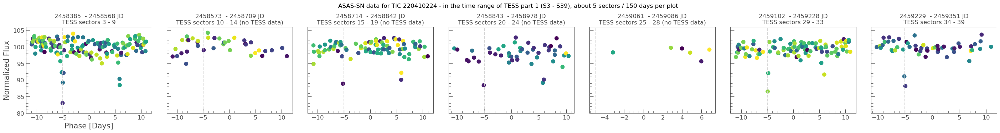

In [186]:
# Depth variation in TESS data time range

def btjd_to_jd_range(tstart, tend):
    return [ Time(t, format="btjd").to_value("jd") for t in [tstart, tend] ]
    
def sector_to_jd_range(sector_start, sector_end):
    tstart = lke.of_sector(lcc_tess, sector_start).time[0]
    tend = lke.of_sector(lcc_tess, sector_end).time[-1]  # inclusive
    return  btjd_to_jd_range(tstart, tend)

def do_plot(tstart, tend, title_suffix, ax=None, **kwargs):
    _lc_f_trunc = _lc_f.truncate(tstart, tend, column="time_original")
    _lc_f_trunc.meta["LABEL"] = None  # hack to avoid legend
    if ax is None:
        ax = tplt.lk_ax(figsize=(6, 3))
    if len(_lc_f_trunc) < 1:
        title = "{No data]"
        if title_suffix is not None:
            title += f"\n{title_suffix}"
        ax.set_title(title)        
        return ax
    ax = tplt.scatter(_lc_f_trunc, ax=ax, c=_lc_f_trunc.time_original.value, show_colorbar=False, **kwargs);
    title = f"{_lc_f_trunc.time_original.min().value:.0f}  - {_lc_f_trunc.time_original.max().value:.0f} JD"
    if title_suffix is not None:
        title += f"\n{title_suffix}"
    ax.set_title(title)
    ax.axvline(-5, linestyle="--", color="lightgray", label="t0");
    ax.set_ylim(80, 106);
    return ax


range_w_labels = [  # range S3 - S39
    (*sector_to_jd_range(3, 9), "TESS sectors 3 - 9"),
    (*btjd_to_jd_range(1569, 1711), "TESS sectors 10 - 14 (no TESS data)"),
    (*btjd_to_jd_range(1711, 1842), "TESS sectors 15 - 19 (no TESS data)"),
    (*btjd_to_jd_range(1842, 1983), "TESS sectors 20 - 24 (no TESS data)"),
    (*btjd_to_jd_range(1983, 2088), "TESS sectors 25 - 28 (no TESS data)"),
    (*btjd_to_jd_range(2088,2228), "TESS sectors 29 - 33"),
    (*btjd_to_jd_range(2228,2390), "TESS sectors 34 - 39"),
]


with plt.style.context(lk.MPLSTYLE):
    fig, axs = plt.subplots(1, len(range_w_labels), sharey=True, squeeze=True, figsize=(4 * len(range_w_labels), 3))
    plt.tight_layout();
    
for i, (tstart, tend, label) in enumerate(range_w_labels):
    ax = do_plot(tstart, tend, label, ax=axs[i], s=225);
    if i > 0:
        ax.set_ylabel(None)
        ax.set_xlabel(None)
fig.suptitle(f"ASAS-SN data for TIC {ticid} - in the time range of TESS part 1 (S3 - S39), about 5 sectors / 150 days per plot", y=1.15);

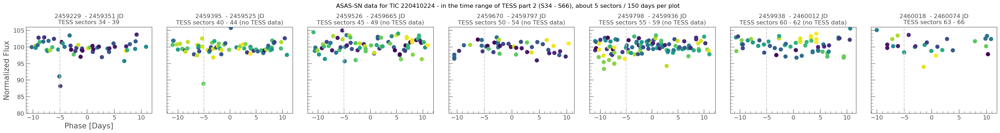

In [187]:
range_w_labels = [  # range S34 - S66
    (*btjd_to_jd_range(2228,2390), "TESS sectors 34 - 39"),
    (*btjd_to_jd_range(2390, 2525), "TESS sectors 40 - 44 (no TESS data)" ),
    (*btjd_to_jd_range(2525, 2665), "TESS sectors 45 - 49 (no TESS data)" ),
    (*btjd_to_jd_range(2665, 2797), "TESS sectors 50 - 54 (no TESS data)" ),
    (*btjd_to_jd_range(2797, 2937), "TESS sectors 55 - 59 (no TESS data)" ),
    (*btjd_to_jd_range(2937, 3014), "TESS sectors 60 - 62 (no TESS data)" ),
    (*sector_to_jd_range(63, 66), "TESS sectors 63 - 66"),
]


with plt.style.context(lk.MPLSTYLE):
    fig, axs = plt.subplots(1, len(range_w_labels), sharey=True, squeeze=True, figsize=(4 * len(range_w_labels), 3))
    plt.tight_layout();
    
for i, (tstart, tend, label) in enumerate(range_w_labels):
    ax = do_plot(tstart, tend, label, ax=axs[i], s=225);
    if i > 0:
        ax.set_ylabel(None)
        ax.set_xlabel(None)
fig.suptitle(f"ASAS-SN data for TIC {ticid} - in the time range of TESS part 2 (S34 - S66), about 5 sectors / 150 days per plot", y=1.15);

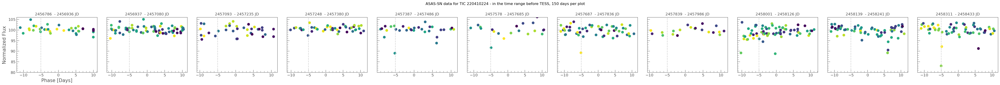

In [185]:
# Depth variation before TESS data time range

t = np.floor(_lc_f.time_original.min().value)
tend = np.floor(lke.of_sector(lcc_tess, 3).time[0].to_value("jd"))
range_width = 150

range_w_labels = []
while t < tend:
    range_w_labels.append(
        (t, t + range_width, None)
    )
    t += range_width


range_w_labels
with plt.style.context(lk.MPLSTYLE):
    fig, axs = plt.subplots(1, len(range_w_labels), sharey=True, squeeze=True, figsize=(4 * len(range_w_labels), 3))
    plt.tight_layout();


for i, (tstart, tend, label) in enumerate(range_w_labels):
    ax = do_plot(tstart, tend, label, ax=axs[i], s=225);
    if i > 0:
        ax.set_ylabel(None)
        ax.set_xlabel(None)
fig.suptitle(f"ASAS-SN data for TIC {ticid} - in the time range before TESS, 150 days per plot", y=1.15);

### ETV and O-C plot, TESS + ASAS-SN

emcee parallel enabled, use 4 CPUs.


100%|██████████████████████████████████████████████████████████| 8000/8000 [01:27<00:00, 91.52it/s]


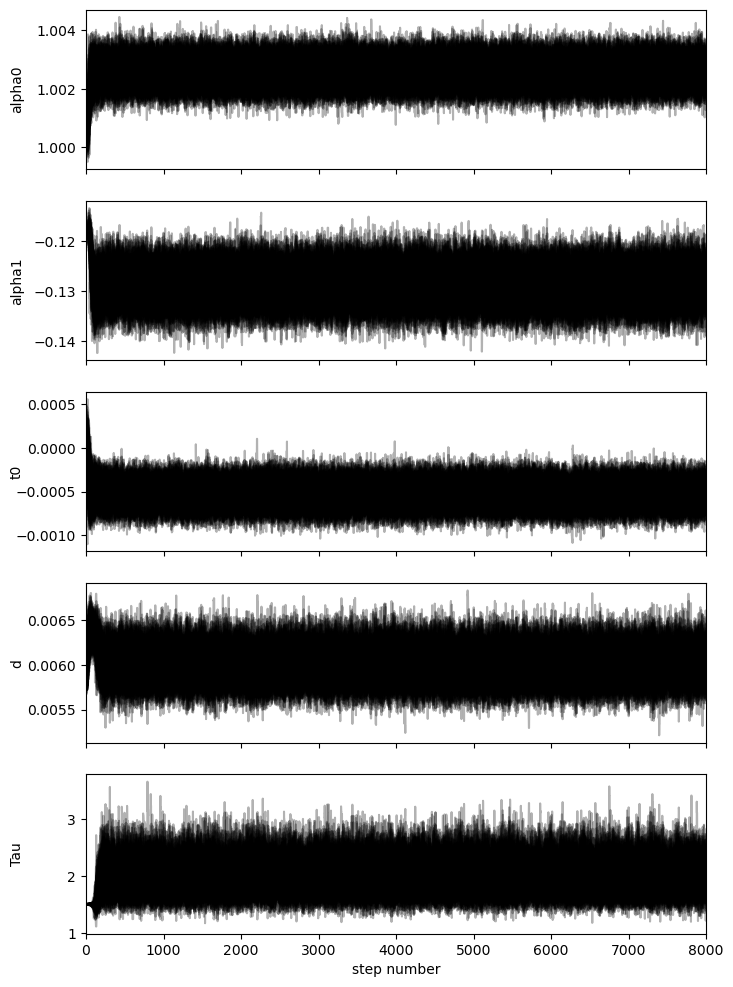

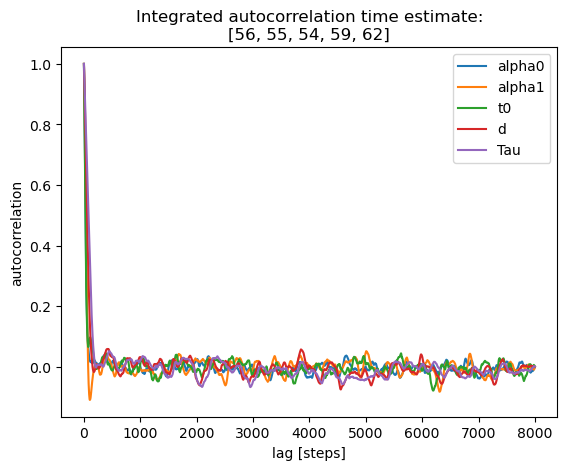

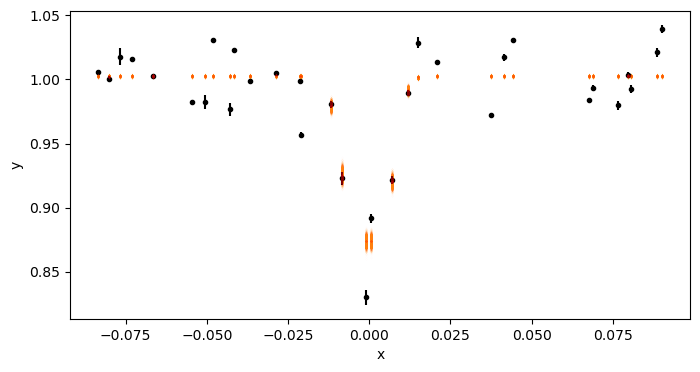

0 2458476.1144290343 1476.1152297712672
emcee parallel enabled, use 4 CPUs.


100%|██████████████████████████████████████████████████████████| 8000/8000 [01:24<00:00, 94.77it/s]


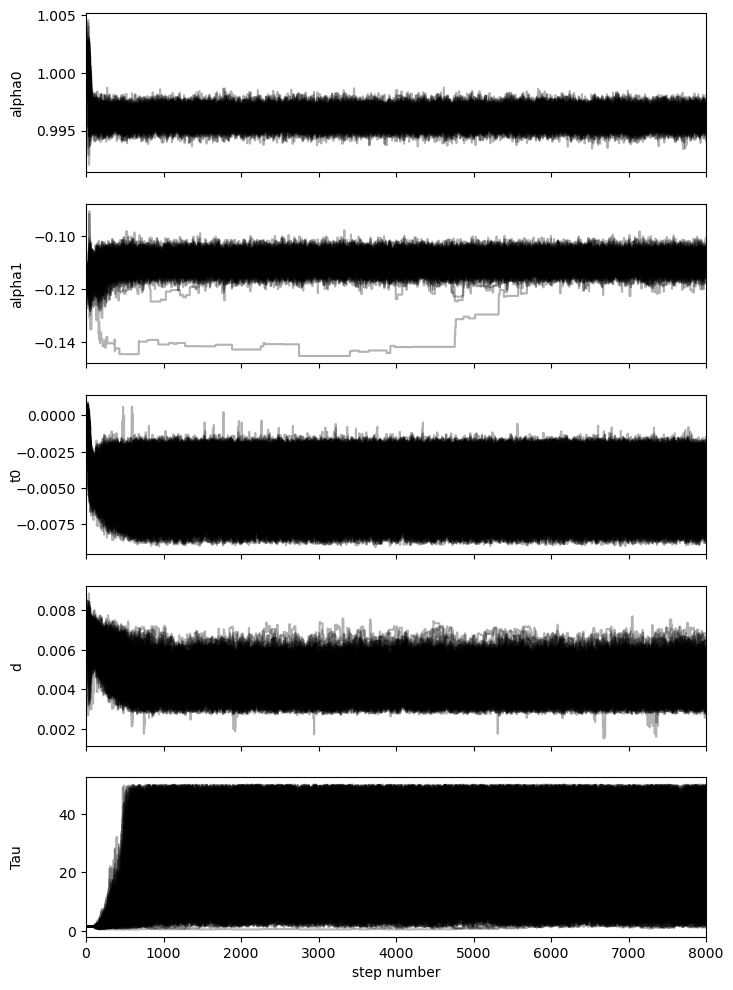

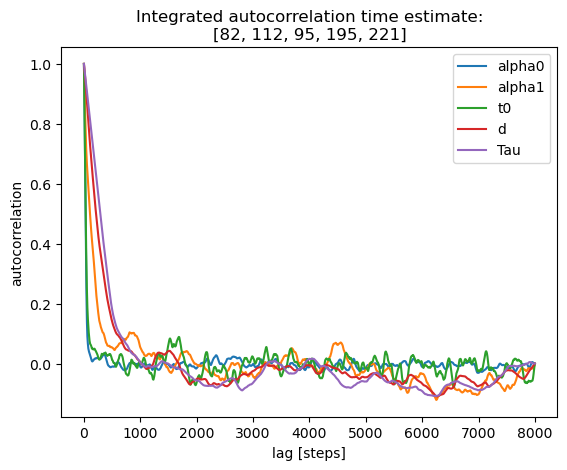

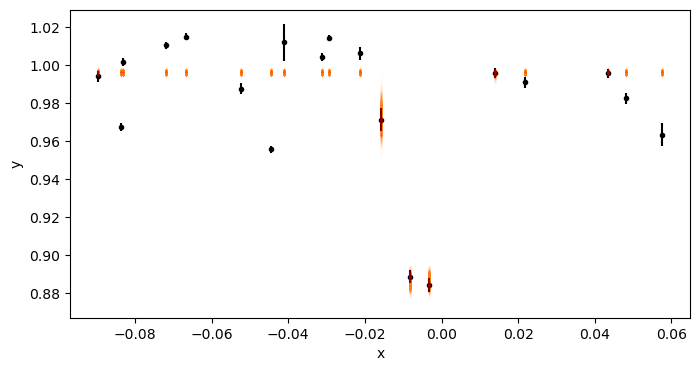

1 2458802.1001125313 1802.100913256909
number,epoch,mean_alpha0,mean_alpha1,t0,stdv_t0,mean_d,mean_Tau
0,1476.1152297712672,1.0025950014490723,-0.12864991315079966,-0.0005291272047103822,0.00012246759042539243,0.006006997250729335,1.977693591588062
1,1802.100913256909,0.9961156302251002,-0.1099762029748137,-0.004799096107665663,0.0018152106665220245,0.004779660002950091,21.991620111230024



In [232]:
c_etv_out_asassn_str = "number,epoch,mean_alpha0,mean_alpha1,t0,stdv_t0,mean_d,mean_Tau\n"

for c, trange in enumerate([
    # about 10 sectors per range
    btjd_to_jd_range(1325, 1569),  # TESS Sectors 1 - 9
    btjd_to_jd_range(1711, 1983),  # "TESS sectors 15 - 24 (no TESS data)"

    # # about 5 sectors per range, not enough data
    # btjd_to_jd_range(1325, 1437),  # TESS Sectors 1 - 4
    # btjd_to_jd_range(1437, 1569),  # TESS Sectors 5 - 9
    # btjd_to_jd_range(1711, 1842),  # "TESS sectors 15 - 19 (no TESS data)"
    # btjd_to_jd_range(1842, 1983),  # "TESS sectors 20 - 24 (no TESS data)"
]):
    
    _lc1 = _lc.normalize().truncate(*trange)  
    # tplt.scatter(_lc1)
    lc_f = _lc1.fold(epoch_time=Time(t0_primary, format="btjd").to_value("jd"), period=period, normalize_phase=True)
    lc_f = lc_f.truncate(-window_width_p *2.0 , window_width_p *2.0)  # 4X the window with from TESS

    # if True:
    #     ax = tplt.scatter(lc_f, s=225);
    #     continue
        
    # convert lc to the form needed by fit etv_functions
    lc_f_data = SimpleNamespace(time=lc_f.time_original.value, phase=lc_f.time.value, flux=np.array(lc_f.flux.value), err=np.array(lc_f.flux_err.value))
    
    start_vals = [mean_alpha0, mean_alpha1, 0, mean_d, mean_Tau]  # mean_t0 is not helpful at all
    
    _alpha0, _alpha1, _t0, _d, _Tau, _fit_params_stats = etv_functions.run_mcmc_initial_fit(
        lc_f_data, start_vals, 
        # nruns=20, discard=1, 
        nruns=8000, discard=1000,   # 6000 would probably be sufficient to satisfy convergence check of tol=20, but use a larger run to be safe
        autocorr_time_kwargs=dict(tol=20), pool=-2, plot_chains=plot_chains,  plot_autocorrelation=plot_autocorrelation, plot=True, also_return_stats=True)
    _stdv_t0 = _fit_params_stats["std_t0"]
    _t = np.mean(lc_f.time_original.value)  # approximate transit time 
    _t_btjd = Time(_t, format="jd").to_value("btjd")  # to fit with TESS data
    print(c, _t, _t_btjd)
    
    c_etv_out_asassn_str += ",".join([str(s) for s in [c, _t_btjd, _alpha0, _alpha1, _t0, _stdv_t0, _d, _Tau]])
    c_etv_out_asassn_str += "\n"


print(c_etv_out_asassn_str)



In [228]:
# # save the result in a cell (time range of ~10 sectors  per-row)
# c_etv_out_asassn_str = """
# number,epoch,mean_alpha0,mean_alpha1,t0,stdv_t0,mean_d,mean_Tau
# 0,1476.1152297712672,1.0025950014490723,-0.12864991315079966,-0.0005291272047103822,0.00012246759042539243,0.006006997250729335,1.977693591588062
# 1,1802.100913256909,0.9961156302251002,-0.1099762029748137,-0.004799096107665663,0.0018152106665220245,0.004779660002950091,21.991620111230024
# """

# ---

# # save the result in a cell  (time range of ~5 sectors  per-row)
# c_etv_out_asassn_str = """
# number,epoch,mean_alpha0,mean_alpha1,t0,stdv_t0,mean_d,mean_Tau
# 0,1405.8319541413157,1.0053563091975994,-0.17754725707252356,-0.003873070007951813,0.0021753511634707897,0.007757775373849577,1.6740272080489285
# 1,1508.0621732428938,1.0013081847570646,-0.11157219980210077,-0.001914212514406054,0.0009762617718989072,0.005138805787212469,2.523538194785181
# 2,1782.5243933867114,1.0053706802618938,-0.11800376246736424,-0.0019066317835099208,0.0005397160676317394,0.0062787133569278675,13.336842974332328
# 3,1856.9151689021548,0.9816237072473382,-0.10048170069328183,-0.013526845696027221,0.00806225002391582,0.013624276425888858,10.572726527377306
# """

Note: 2 data points in df_primary filtered out due to large errors.


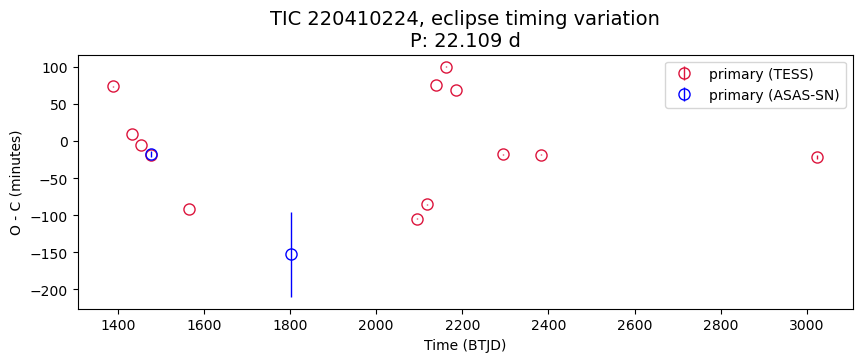

In [233]:
%matplotlib inline
# %matplotlib ipympl


title_suffix = "eclipse timing variation"

#plot the extracted transit times to check for ETVs

num_rows = 1  # 2 if t0_secondary is not None else 1
figsize_y = 3.3 if num_rows == 1 else num_rows * 3.5
# num_rows = 1  # force to plot primary only
# figsize_y = 3.3

fig, axs = plt.subplots(num_rows, 1, figsize=(10, figsize_y), sharex=True)
if isinstance(axs, plt.Axes):  # handle edge case that num_rows == 1, returned axs is not a list
    axs = [axs]

# in_df_primary = pd.read_csv(outfile_path)
from io import StringIO
in_df_primary = pd.read_csv(StringIO(c_etv_out_str))
in_df_primary['midpoint'] = in_df_primary['epoch'] + (in_df_primary['t0']*period)
in_df_primary['shift_mins'] = in_df_primary['t0']*period*24*60
in_df_primary['std_mins'] = in_df_primary['stdv_t0']*period*24*60
in_df_primary_all = in_df_primary  # in case filtering is helpful

in_df_primary = in_df_primary[in_df_primary.std_mins < 10]  # filter out outliers 
print(f"Note: {len(in_df_primary_all) - len(in_df_primary)} data points in df_primary filtered out due to large errors.")

# axs[0].plot(in_df_primary['epoch'], in_df_primary['shift_mins'],
#              lw = 1, color = 'crimson', )
# axs[0].scatter(in_df_primary['epoch'], in_df_primary['shift_mins'],
#              marker = 'o', s=8**2, color = 'None', edgecolor = 'crimson', label="primary")
axs[0].errorbar(in_df_primary['epoch'], in_df_primary['shift_mins'], yerr = in_df_primary['std_mins'],
             lw = 0, marker = 'o', elinewidth = 1, markersize = 8, color = 'None', ecolor='crimson', markeredgecolor = 'crimson', label="primary (TESS)")

# now ASAS-SN data

in_df_primary = pd.read_csv(StringIO(c_etv_out_asassn_str))
in_df_primary['midpoint'] = in_df_primary['epoch'] + (in_df_primary['t0']*period)
in_df_primary['shift_mins'] = in_df_primary['t0']*period*24*60
in_df_primary['std_mins'] = in_df_primary['stdv_t0']*period*24*60

axs[0].errorbar(in_df_primary['epoch'], in_df_primary['shift_mins'], yerr = in_df_primary['std_mins'],
             lw = 0, marker = 'o', elinewidth = 1, markersize = 8, color = 'None', ecolor='blue', markeredgecolor = 'blue', label="primary (ASAS-SN)");


for ax in axs:
    ax.set_ylabel("O - C (minutes)")
    ax.legend();

axs[-1].set_xlabel(f"Time ({search_result.time.format.upper()})")
axs[0].set_title(f"TIC {ticid}, {title_suffix}\nP: {period} d", fontsize=14)

plt.subplots_adjust(hspace=0.35)
# plt.ylim(-3, 8)
plt.show()

# Catalina Surveys data

- unclear if the data is usable

time,flux,flux_err,masterid,mag,magerr,ra,dec,blend
,,,,mag,mag,deg,deg,
Time,float64,float64,uint64,float64,float64,float64,float64,int32
2453713.95354,0.9673864499689516,0.04851926364824144,3055021014689,12.629,0.054,70.73777,-55.4977,0
2453713.96174,0.9700631337839574,0.04851926364824144,3055021014689,12.626,0.054,70.73777,-55.4977,0
2453713.96995,0.9727472237769657,0.04851926364824144,3055021014689,12.623,0.054,70.73778,-55.4977,0
2453713.97815,0.9817479430199849,0.04851926364824144,3055021014689,12.613,0.054,70.73777,-55.49771,0
2453736.08636,0.9453660459579654,0.050270342637577126,3055021014689,12.654,0.056,70.73774,-55.49772,0


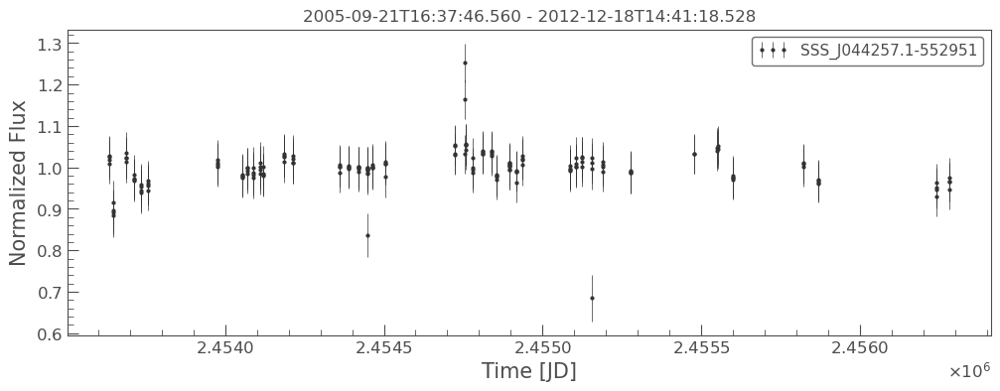

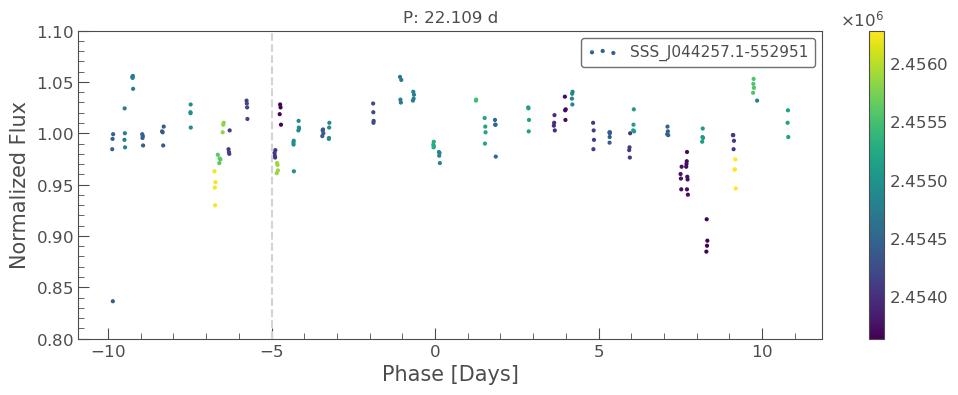

In [289]:
import lightkurve_ext_readers as lker
reload(lker)

lc_css = lker.read_catalina_csv(f"{lk_download_dir}/targets/tic220410224_crts_result_web_fileS1TTxa.csv", label="SSS_J044257.1-552951", to_time_format="jd")
# lc_css = lker.read_catalina_csv(f"{lk_download_dir}/targets/tic220410224_crts_long_result_web_fileihwm3n.csv", label="SSS_J044257.1-552951", to_time_format="jd")
lc_css = lke.to_normalized_flux_from_mag(lc_css)

ax = tplt.errorbar(lc_css, figsize=(12, 4));

ax.set_title(f"{lc_css.time.min().to_value('isot')} - {lc_css.time.max().to_value('isot')}")

# # mark TESS data - no need TESS is way later
# for i, lc in enumerate(lcc_tess_all):
#     label = "has TESS data" if i == 0 else None
#     mark_time_range(ax, lc, label=label)
#     ax.legend(loc="upper left");

display(lc_css.head())

lc_css_f = lc_css.fold(epoch_time=Time(t0_primary, format="btjd") + 5,   # put primary at phase -5 days, roughly phase -0.25
                       period=period)  # the BTJD to HJD conversion is not precise, but should be suffient

ax = tplt.scatter(lc_css_f, figsize=(12, 4), c=lc_css_f.time_original.to_value("jd"), s=16);
ax.set_title(f"P: {lc_css_f.period}");
ax.axvline(-5, linestyle="--", color="lightgray", label="primary t0");
ax.set_ylim(0.8, 1.1);

# Scratch

In [ ]:
# Experiment to see if including ingress / egress would signficiantly change the result
# - note: alpha0 / alpha1 don't converge well at all, but it does not seem to significantly affect the result.

from types import SimpleNamespace

etv_out_str_wide_win = "number,epoch,mean_alpha0,mean_alpha1,t0,stdv_t0,mean_d,mean_Tau\n"

for lc in lcc_tess[:]: 
    lc_f = lc.fold(epoch_time=t0_primary, period=period, normalize_phase=True)
    lc_f = lc_f.truncate(-window_width_p / 2 * 2, window_width_p / 2 * 2)
    lc_f = lc_f.truncate(0.75, 1.07, column="flux")  # crude remove outliers
    # ax = lc_f.scatter(label=f"S. {lc.sector}");  # for diagnostics
    
    # convert lc to the form needed by fit etv_functions
    lc_f_data = SimpleNamespace(time=lc_f.time_original.value, phase=lc_f.time.value, flux=np.array(lc_f.flux.value), err=np.array(lc_f.flux_err.value))
    
    start_vals = [mean_alpha0, mean_alpha1, 0, mean_d, mean_Tau]  # mean_t0 is not helpful at all
    _alpha0, _alpha1, _t0, _d, _Tau, _fit_params_stats = etv_functions.run_mcmc_initial_fit(
        lc_f_data, start_vals, 
        # nruns=40, discard=6, 
        nruns=5000, discard=1000,  # 3000  is probably sufficient
        autocorr_time_kwargs=dict(tol=20), pool=-2, plot_chains=True,  plot_autocorrelation=True, plot=True, also_return_stats=True)
    
    _stdv_t0 = _fit_params_stats["std_t0"]
    _t = np.mean(lc_f.time_original.value)  # approximate transit time 
    print(lc.sector, _t)
    
    etv_out_str_wide_win += ",".join([str(s) for s in [lc.sector, _t, _alpha0, _alpha1, _t0, _stdv_t0, _d, _Tau]])
    etv_out_str_wide_win += "\n"

print(etv_out_str_wide_win)

In [ ]:
# # save the result in a cell for safekeeping
# etv_out_str_wide_win = """\
# number,epoch,mean_alpha0,mean_alpha1,t0,stdv_t0,mean_d,mean_Tau
# 14,1695.9315012660013,1.0066927208400884,-0.19527320245417712,-0.0024084747249216235,2.1375465836782263e-05,0.013784103568594518,1.1106948080398062
# 15,1723.658199467935,1.0015170980990435,-0.19204828009247168,-0.0020137798119000826,1.9176969233845507e-05,0.013731336741963591,1.1247796662711322
# 41,2433.4062900678855,1.0022956254234265,-0.20358801541971,0.0016672408607406636,1.178539469240903e-05,0.013618416876736969,1.1073912631486325
# 54,2782.3710799563682,1.0027762420770063,-0.20158795827436782,0.0013609292818985096,1.1756651738611195e-05,0.013545391418521624,1.104813737741508
# 55,2810.1232361042253,1.0023747953047912,-0.19647183841396995,0.0012982294331478459,1.1806961835950924e-05,0.013559837109337999,1.1027283501990364
# 75,3353.408428122994,1.0011521908833965,-0.20678402169415633,-0.0002912834787168352,9.392960604539041e-06,0.013417520583959432,1.107503010415923
# 81,3519.9393542579446,1.0028174546347262,-0.20214997675154256,-0.0007589386744599292,7.957789316644965e-06,0.013413070053184852,1.095434952043832
# 82,3545.7285149604522,1.0028812010369124,-0.1992482266901794,-0.0007895575604011098,8.575197991774063e-06,0.01338562252679059,1.1023402314862523
# """

In [ ]:
%matplotlib inline
# %matplotlib widget


title_suffix = "eclipse timing variation"

#plot the extracted transit times to check for ETVs

num_rows = 2 if t0_secondary is not None else 1
figsize_y = 3.3 if num_rows == 1 else num_rows * 3.5
# num_rows = 1  # force to plot primary only
# figsize_y = 3.3

fig, axs = plt.subplots(num_rows, 1, figsize=(10, figsize_y), sharex=True)
if isinstance(axs, plt.Axes):  # handle edge case that num_rows == 1, returned axs is not a list
    axs = [axs]

from io import StringIO
in_df_primary = pd.read_csv(StringIO(etv_out_str_wide_win))
in_df_primary['midpoint'] = in_df_primary['epoch'] + (in_df_primary['t0']*period)
in_df_primary['shift_mins'] = in_df_primary['t0']*period*24*60
in_df_primary['std_mins'] = in_df_primary['stdv_t0']*period*24*60
in_df_primary_all = in_df_primary  # in case filtering is helpful

axs[0].errorbar(in_df_primary['epoch'], in_df_primary['shift_mins'], yerr = in_df_primary['std_mins'],
             lw = 0, marker = 'o', elinewidth = 1, markersize = 8, color = 'None', ecolor='crimson', markeredgecolor = 'crimson', label="primary");